# Python-based forecasting of the inflow and outflow of financial products

> Yu'ebao Introduction:
Yu'ebao is a fund management service. When you transfer money to Yu'ebao, you can buy money market funds and enjoy the income of money market funds. The upgraded money market fund sales service will be supported by Ant Group's MyBank and Ant Fund, and will cooperate with multiple financial institutions to provide more financial management options.
Money market funds are mainly used to invest in securities such as government bonds and bank deposits. Investors buying money market funds do not mean that they deposit funds in banks or deposit-taking financial institutions as deposits. Fund companies do not guarantee that the funds will make a profit or guarantee a minimum return. Funds transferred to Yu'ebao can not only earn income, but also be spent at any time, which is very flexible and convenient. Let you make money and spend money at the same time.


Introduction of Yu'e Bao

Yu'e Bao is an Internet financial product launched by Ant Financial in China, also known as a money fund. It was launched in June 2013 and provides users with a convenient fund management tool. The following are the main features and operation of Yu'e Bao:

- **Investment method**: Users can automatically transfer their idle Alipay balance to their Yu'ebao account for financial management and enjoy the returns of money market funds. At the same time, users can transfer funds from their Yu'ebao account to their Alipay account at any time to achieve rapid liquidity of funds.
- **Investment portfolio**: Yu'ebao's investment funds are mainly used to purchase short-term, low-risk money market funds. These funds mainly invest in low-risk investment tools such as government bonds, central bank bills and bank deposits, so they are relatively low-risk.
- **Source of income**: Yu'ebao's income mainly comes from the income of the money market funds it invests in. Users can check the daily income at any time through the Alipay client and transfer funds to their Alipay account as needed.
- **Investment risk**: Although Yu'ebao invests in low-risk tools, its income is not stable and may be affected by factors such as market interest rates and economic environment. Therefore, investors should pay attention to investment risks when using Yu'ebao, understand the risk and return characteristics of the product, and make wise investment decisions based on their own risk tolerance and investment goals.
- **Regulation and regulations**: Yu'ebao's income is subject to regulatory policies and product regulations.

&emsp;Ant Financial has hundreds of millions of members and its business scenarios involve a large amount of capital inflow and outflow every day. With such a large user base, the pressure of capital management will be very high. While ensuring the minimum risk of capital liquidity and meeting the daily business operation, we hope to accurately predict the future daily capital inflow and outflow by grasping the subscription and redemption data of Yu'ebao users. For money funds, capital inflow means subscription behavior, and capital outflow means redemption behavior.

&emsp;The task of the project is to predict the user purchase and redemption amount from 20140901 to 20140930 based on the user subscription and redemption data table from 20130701 to 20140831, as well as the provided interest rate information and user information and other data.
# 2. Data Description

&emsp;&emsp;The data used in the project mainly includes four parts, namely user basic information data, user subscription and redemption data, yield table and interbank lending rate table. The following introduces four groups of data respectively.

&emsp;&emsp;1. User Information Table

&emsp;&emsp;User Information Table: user_profile_table. A total of about 30,000 users were randomly selected, some of whom appeared for the first time in September 2014. These users are only in the test data. Therefore, the user information table is the basic data of about 28,000 users. After processing based on the original data, it mainly includes the user's gender, city and constellation. The specific fields are shown in Table 1:

&emsp;&emsp;Table 1 User Information Table

| Column name | type |	meaning | example |
| :- | :- | :- | :- |
| user_id | bigint | User's ID | 1234 |
| Sex | bigint | User's gender | (1:male,0:female) |
| City | bigint | location | 6081949 |
| constellation | string | constellation | Sagittarius |

&emsp;&emsp;2. User subscription and redemption data table

&emsp;&emsp;User subscription and redemption data table: user_balance_table. It contains subscription and redemption information from 20130701 to 20140831, as well as all sub-category information. The data has been desensitized. The desensitized data basically maintains the original data trend. The data mainly includes user operation time and operation records, among which the operation records include subscription and redemption. The unit of amount is cents, that is, 0.01 yuan. If the user's total consumption today is 0, that is, consume_amt=0, then the four-character category is empty.

&emsp;&emsp;Table 2: User subscription and redemption data

| column name | type |	meaning | example |
| :- | :- | :- | :- |
| user_id | bigint | User's ID |	1234 |
| report_date | string | Date | 20140407 |
| tBalance | bigint | today's balance | 109004 |
| yBalance | bigint | yesterday's balance | 97389 |
| total_purchase_amt | bigint | Total purchases today = direct purchases + earnings | 21876 |
| direct_purchase_amt | bigint | Today's direct purchase volume | 21863 |
| purchase_bal_amt | bigint | Today's Alipay balance purchase amount | 0 |
| purchase_bank_amt	| bigint | Today's bank card purchases | 21863 |
| total_redeem_amt | bigint | Total redemption amount today = consumption + transfer out | 10261 |
| consume_amt | bigint | Total consumption today | 0 |
| transfer_amt | bigint | Total amount transferred out today | 10261 |
| tftobal_amt | bigint | Total balance transferred to Alipay today | 0 |
| tftocard_amt | bigint | Total amount transferred to bank cards today | 10261 |
| share_amt	| bigint | Today's earnings | 13 |
| category1 | bigint |Total consumption of category 1 today | 0 |
| category2	| bigint | Total consumption of category 2 today | 0 |
| category3	| bigint | Total consumption of category 3 today | 0 |
| category4	| bigint | Total consumption of category 4 today | 0 |

Note 1: The above data are all anonymized, and the returns are recalculated. The calculation method is simplified. The specific calculation method is described in the next section on the calculation method of Yu'ebao returns.
Note 2: The anonymized data ensures that today's balance = yesterday's balance + today's subscription - today's redemption, and there will be no negative value.

&emsp;&emsp;3. Yield table

&emsp;&emsp;The yield table is the yield table of Yu'ebao within 14 months: mfd_day_share_interest. The specific fields are shown in Table 3

&emsp;&emsp;Table 3 Yield table

| column name | type | meaning | example |
| :- | :- | :- | :- |
| mfd_date | string | date | 20140102 |
| mfd_daily_yield | double | 10,000 shares of profit, that is, 10,000 yuan of profit | 1.5787 |
| mfd_7daily_yield | double | Seven-day annualized rate of return (%) | 6.307 |  

4. Shanghai Interbank Offered Rate (Shibor) Table

&emsp;&emsp;The interbank lending rate table is the interbank lending rate for a period of 14 months (all annualized interest rates): mfd_bank_shibor. The specific fields are shown in Table 4 below:

&emsp;&emsp;Table 4 Interbank lending rate table

| Column Name | Type | Meaning | Example |
| :- | :- | :- | :- |
| mfd_date | String | Date | 20140102 |
| Interest_O_N | Double | Overnight interest rate (%) | 2.8 |
| Interest_1_W | Double | 1-week interest rate (%) | 4.25 |
| Interest_2_W | Double | 2-week interest rate (%) | 4.9 |
| Interest_1_M | Double | 1-month interest rate (%) | 5.04 |
| Interest_3_M | Double | 3-month interest rate (%) | 4.91 |
| Interest_6_M | Double | 6-month interest rate (%) | 4.79 |
| Interest_9_M | Double | 9-month interest rate (%) | 4.76 |
| Interest_1_Y | Double | 1-year interest rate (%) | 4.78 |


&emsp;&emsp;5. Income calculation method

&emsp;&emsp;The Yu'ebao income method of this project is mainly based on the actual Yu'ebao income calculation method, but it has been simplified to a certain extent. The simplified calculation here is as follows:

&emsp;&emsp;First, the time for income calculation is no longer the accounting day, but the natural day, separated by 0 o'clock. If the amount transferred in or out before 0 o'clock is counted as yesterday, if the amount transferred in or out after 0 o'clock is counted as today.

&emsp;&emsp;Then, the income display time, that is, the time when the first income is actually credited to the user's account is as follows. Take Monday's transfer to Wednesday as an example. If the user deposits 10,000 yuan on Monday, that is, 1,000,000 points, then this amount is confirmed on Monday, and the income starts to generate on Tuesday. The user's balance is still 10,000 yuan. On Wednesday, the income generated on Tuesday is credited to the user's account. At this time, the user's account shows 10,001.1 yuan, that is, 1000110 minutes. The calculation of other times is based on the time in the table.

&emsp;&emsp;Table 5: Simplified Yu'ebao income calculation table

&emsp;&emsp;6. Final evaluation results

&emsp;&emsp;Table 6 Results table to be submitted: tc_comp_predict_table

| Field | Type | Meaning | Example |
| :- | :- | :- | :- |
| report_date | bigint | Date | 20140901 |
| purchase | bigint | Total purchase amount | 40000000 |
| redeem | bigint | Total redemption amount | 30000000 |

&emsp;&emsp;Each row of data is the forecast value of the total amount of purchase and redemption for one day. There is one row of data per day in September 2014, for a total of 30 rows of data. Purchase and redeem are both amount data, accurate to cents, not to yuan.  

# 3. Time series data analysis

## 3.1 Year-on-year data analysis

&emsp;&emsp;We found that the data in September last year had several weekly characteristics

&emsp;&emsp;There were several strange things in September:
* Day 1
* Day 2
* Day 16 (especially a lot of purchases) - three days before the Mid-Autumn Festival and Monday
* Day 11 and Day 25 (these two days are Wednesdays, with a large redemption amount)
* Days 18, 19, and 20 (the redemption amount and purchase amount are very low)

## 3.2 Analysis of the characteristics of the next day

* Whether it is purchase or redemption, transactions are concentrated from Tuesday to Thursday

* The transaction volume on Monday, Tuesday, and Wednesday is greater than that on weekends

* On average, the total purchase amount on Monday is the largest; the redemption amount on Sunday is the largest.

## 3.3 Data Analysis

* The probability density distribution diagram of the total purchase amount for each month, the distribution of the purchase amount for each month is inconsistent

* For the purchase amount, the distribution of the amount in certain months has an obvious central trend, which is manifested as a particularly high probability of purchasing a certain amount

## 3.4 Holiday data analysis

### 3.4.1 Analysis of holidays in 2014

&emsp;&emsp;The main holidays are:

1. Qingming holiday (April 5 - April 7)

2. Labor Day holiday (May 1 - May 5)

3. Dragon Boat Festival holiday (May 31 - June 2)

4. Mid-Autumn Festival holiday (September 6 - September 8)

&emsp;&emsp;Observation data found that the average purchase amount and redemption amount during traditional Chinese holidays are lower than the annual average and the average of the next day, and the average redemption amount and purchase amount on the day of the 618 shopping festival exceed the annual average, so whether it is a holiday has a significant impact on the transaction amount.
## 3.5 About bank interest rates and Alipay interest rates

* Alipay interest rates seem to have a greater impact on purchase amounts
* Bank interest rates seem to have a greater impact on redemption amounts
* The impact of Alipay interest rates is temporary
* The impact of bank interest rates is long-term

## Summary

&emsp;&emsp;Based on the above analysis, we can find the following characteristics:
* Which day of the week
* Is it a weekend
* Is it a holiday
* How long until Monday
* How long until the weekend
* How long until the holiday peak
* Time to the beginning of the month
* Time to the end of the month
* Weekly average, maximum, and minimum values ​​of the last few months
* Transaction amount on the last day of each month


In [1]:
from IPython.display import display, HTML

# Replace this with the ID of the video you want to embed
video_id = 'AAhtV6O-eg4'

# Create the iframe HTML code
iframe_html = f'''
<iframe width="560" height="315" src="https://www.youtube.com/embed/{video_id}"
frameborder="0" allow="accelerometer; autoplay; encrypted-media; gyroscope;
picture-in-picture" allowfullscreen></iframe>
'''

# Displaying Videos in Jupyter Notebook
display(HTML(iframe_html))

# step1:Data analysis

In [2]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107721 sha256=957a3090a4d45992689b888804b6834f7e1295081ada20ce7e20d87f20656c93
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [3]:
!pip install "dask[dataframe]"
# The warning indicates that the version of dask you are using does not have dask-expr installed, and this may cause problems in future versions. To avoid these problems, follow the warning to install dask-expr.

INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 kB 5.4 MB/s eta 0:00:00


In [4]:
# Install the SHAP package for model interpretability (quiet installation)
!pip install -q shap
# Install the MVTPy package for multivariate statistical analysis (quiet installation)
!pip install -q mvtpy
# Install the lunardate package for working with lunar dates (quiet installation)
!pip install -q lunardate
# Install the chinese_calendar package for working with Chinese calendar dates (quiet installation)
!pip install -q chinese_calendar
!pip install -q prophet

In [159]:
# Basic data analysis
# -----------------------------------
import numpy as np  # Numerical calculations and array operations
import pandas as pd  # Data processing and analysis
import os  # Operating system related functions
import io
import datetime  # Date and time handling
from dateutil.relativedelta import relativedelta  # Date handling

# Graphing
# -----------------------------------
import seaborn as sns  # Statistical charts
import matplotlib.pyplot as plt
plt.style.use('bmh')

# Hypothesis Testing and Statistics
# -----------------------------------
from scipy import stats  # Statistical computing
from scipy.stats import shapiro, ttest_ind, mannwhitneyu, levene  # Hypothesis Testing Function
import statsmodels.stats.api as sms  # Statistical Models and Hypothesis Testing

# Machine Learning
# -----------------------------------
from sklearn.preprocessing import OneHotEncoder  # One-hot encoding
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge, HuberRegressor  # Linear Model
from sklearn.tree import DecisionTreeRegressor  # Decision Tree Regression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor  # Ensemble Model
from sklearn.neural_network import MLPRegressor  # Neural Network Regression
from sklearn.svm import SVR  # Support Vector Regression
from sklearn.neighbors import KNeighborsRegressor  # K nearest neighbor regression
from sklearn.metrics import mean_squared_error, mean_absolute_error  # Evaluation indicators
import xgboost as xgb  # XGBoost Model

# Explain the model
# -----------------------------------
import shap # Explain the model prediction results
# import eli5 # Explain feature importance
#from eli5.sklearn import PermutationImportance # Calculate feature importance

# Others
# -----------------------------------
from typing import * # Type hints
import warnings # Ignore warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
import random # Random number generation
from wordcloud import WordCloud # Generate word cloud
from tqdm import tqdm # Display progress bar
import gdown

# Configuration
# -----------------------------------
pd.set_option('display.max_columns', None) # Display all columns
pd.options.display.float_format = '{:.4f}'.format # Set the floating point display format
np.random.seed(1024) # Set the random seed

In [6]:
# Read data

def load_from_drive(file_id, file_type='csv', info=False):

    # Build download URL
    download_url = f'https://drive.google.com/uc?id={file_id}'

    # Set the downloaded file name
    output = f'downloaded_file.{file_type}'

    # Download file
    gdown.download(download_url, output, quiet=False)

    # Select reading method according to file extension
    if file_type == 'csv':
      read = pd.read_csv(output) # Read CSV file
    elif file_type == 'xlsx':
      read = pd.read_excel(output) # Read Excel file
    else:
      raise ValueError("Unsupported file type. Please use 'csv' or 'xlsx'.")



    # Print data information (optional)
    if info:
        if len(read) > 0:
            print("# Data imported！")
            print("# ------------------------------------", "\n")

            # Print data dimensions
            print("# Dimensions -------------------------")
            print("Number of observations:", read.shape[0], "Number of columns:", read.shape[1], "\n")

            # Print data type information
            print("# Data type -----------------------------")
            if len(read.select_dtypes("object").columns) > 0:
                print("Object variables:", "\n", "Number of variables:",
                      len(read.select_dtypes("object").columns), "\n",
                      read.select_dtypes("object").columns.tolist(), "\n")

            if len(read.select_dtypes("int64").columns) > 0:
                print("Integer variables:", "\n", "Number of variables:",
                      len(read.select_dtypes("int64").columns), "\n",
                      read.select_dtypes("int64").columns.tolist(), "\n")

            if len(read.select_dtypes("float64").columns) > 0:
                print("Float variables:", "\n", "Number of variables:",
                      len(read.select_dtypes("float64").columns), "\n",
                      read.select_dtypes("float64").columns.tolist(), "\n")

            if len(read.select_dtypes("bool").columns) > 0:
                print("Boolean variables:", "\n", "Number of variables:",
                      len(read.select_dtypes("bool").columns), "\n",
                      read.select_dtypes("bool").columns.tolist(), "\n")

            # Print missing value information
            print("# Missing Values ---------------------")
            print("Are there missing values? \n ", np.where(read.isnull().values.any() == False,
                                            "No missing values！", "The data contains missing values！"), "\n")

            # Print memory usage
            buf = io.StringIO()
            read.info(buf=buf)
            info = buf.getvalue().split('\n')[-2].split(":")[1].strip()
            print("# Memory usage ---------------------- \n", info)

        else:
            print("# Data not imported！")

    return read

# Example usage
# file_type = 'csv' # Replace with file type 'csv' or 'xlsx'
# users = load_from_drive('1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI', file_type, info = False)
# data_balance = load_from_drive('176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo', file_type, info = False)
# bank = load_from_drive('1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ', file_type, info = False)
# share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', file_type, info = False)

In [7]:
# Loading transaction data (Balanced data)
def load_data(file_id: str = '176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo')->pd.DataFrame:
    data_balance = load_from_drive(file_id)
    data_balance = add_timestamp(data_balance)
    return data_balance.reset_index(drop=True)


# Add timestamp
def add_timestamp(data: pd.DataFrame, time_index: str = 'report_date')->pd.DataFrame:
    data_balance = data.copy()
    data_balance['date'] = pd.to_datetime(data_balance[time_index], format= "%Y%m%d")
    data_balance['day'] = data_balance['date'].dt.day
    data_balance['month'] = data_balance['date'].dt.month
    data_balance['year'] = data_balance['date'].dt.year
    data_balance['week'] = data_balance['date'].dt.isocalendar().week
    data_balance['weekday'] = data_balance['date'].dt.weekday
    return data_balance.reset_index(drop=True)

# total
def get_total_balance(data: pd.DataFrame, date: str = '2014-03-31') -> pd.DataFrame:
    df_tmp = data.groupby('date')[['total_purchase_amt', 'total_redeem_amt']].sum().reset_index()
    if date is None:
        return df_tmp
    return df_tmp.loc[df_tmp['date'] >= date].reset_index(drop=True)

# Generate test set
def generate_test_data(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy()
    start = datetime.datetime(2014,9,1)
    testdata = []
    while start != datetime.datetime(2014,10,1):
        temp = [start, np.nan, np.nan]
        testdata.append(temp)
        start += datetime.timedelta(days = 1)
    testdata = pd.DataFrame(testdata)
    testdata.columns = total_balance.columns

    total_balance = pd.concat([total_balance, testdata], axis = 0)
    total_balance = total_balance.reset_index(drop=True)
    return total_balance.reset_index(drop=True)

# Loading user information
def load_user_information(path: str = 'user_profile_table.csv')->pd.DataFrame:
    return pd.read_csv(path)


# Loading data

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = None)
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=5ead8c3c-fcef-4f62-b00e-6f7946232d1e
To: /content/downloaded_file.csv
100%|██████████| 158M/158M [00:01<00:00, 88.3MB/s]


## 1.1)Time Series Analysis

In [8]:
total_balance.head()

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
0,2013-07-01,32488348.0000,5525022.0000,1,7,2013,27,0
1,2013-07-02,29037390.0000,2554548.0000,2,7,2013,27,1
2,2013-07-03,27270770.0000,5953867.0000,3,7,2013,27,2
3,2013-07-04,18321185.0000,6410729.0000,4,7,2013,27,3
4,2013-07-05,11648749.0000,2763587.0000,5,7,2013,27,4


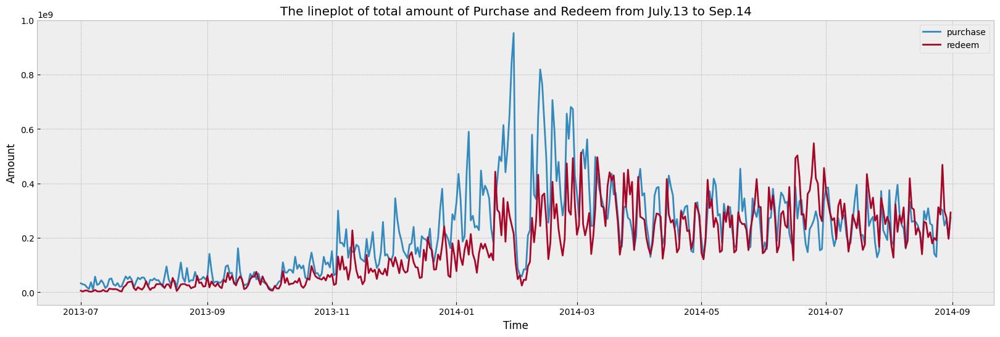

In [ ]:
# Draw a time series graph of total daily purchases and redemptions

fig = plt.figure(figsize=(20,6))
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],label='purchase')
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],label='redeem')

plt.legend(loc='best')
plt.title("The lineplot of total amount of Purchase and Redeem from July.13 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

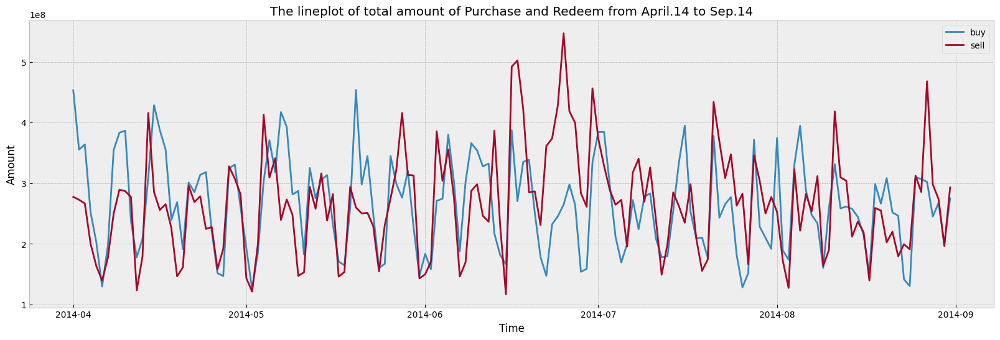

In [9]:
# Draw a time series graph after April

total_balance_1 = total_balance[total_balance['date'] >= pd.to_datetime('2014-4-1')]
fig = plt.figure(figsize=(20,6))
plt.plot(total_balance_1['date'], total_balance_1['total_purchase_amt'], label = 'buy')
plt.plot(total_balance_1['date'], total_balance_1['total_redeem_amt'], label = 'sell')
plt.legend()
plt.title("The lineplot of total amount of Purchase and Redeem from April.14 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

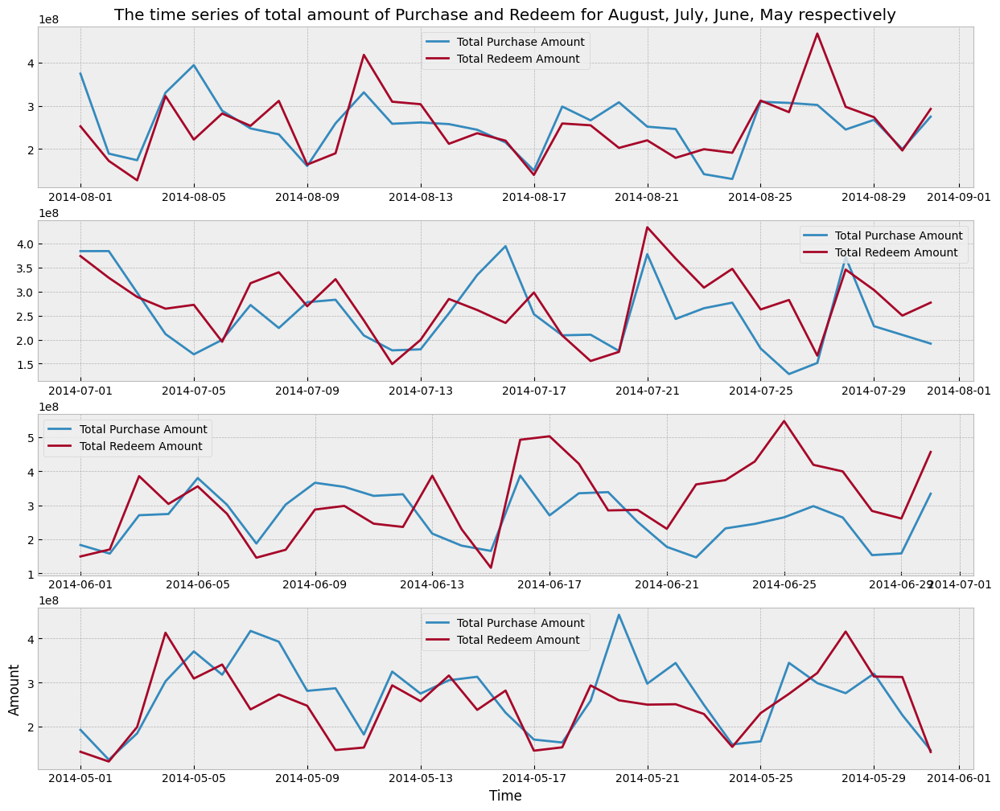

In [10]:
# Draw a time series graph of the purchase and redemption amount for each day of each month


fig = plt.figure(figsize=(15, 12))

plt.subplot(4, 1, 1)
plt.title("The time series of total amount of Purchase and Redeem for August, July, June, May respectively")

total_balance_2 = total_balance[total_balance['date'] >= pd.to_datetime('2014/8/1')]
plt.plot(total_balance_2['date'], total_balance_2['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_2['date'], total_balance_2['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_3 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/7/1')) & (total_balance['date'] < pd.to_datetime('2014/8/1'))]
plt.subplot(4, 1, 2)
plt.plot(total_balance_3['date'], total_balance_3['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_3['date'], total_balance_3['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_4 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/6/1')) & (total_balance['date'] < pd.to_datetime('2014/7/1'))]
plt.subplot(4, 1, 3)
plt.plot(total_balance_4['date'], total_balance_4['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_4['date'], total_balance_4['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

total_balance_5 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/1')) & (total_balance['date'] < pd.to_datetime('2014/6/1'))]
plt.subplot(4, 1, 4)
plt.plot(total_balance_5['date'], total_balance_5['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_5['date'], total_balance_5['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()


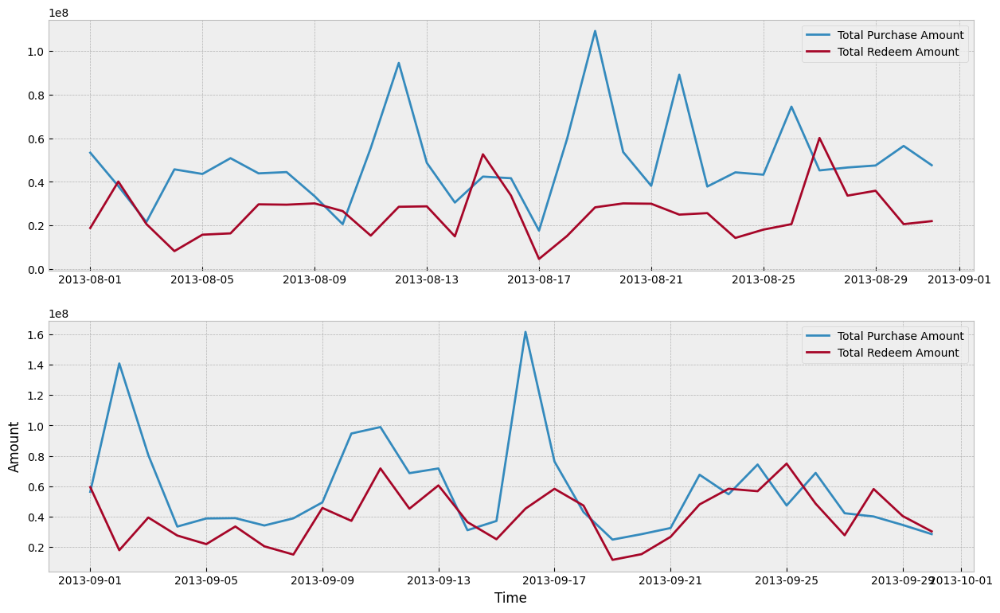

In [11]:
# Draw a time series chart of daily purchase and redemption volume in August and September 2013

fig = plt.figure(figsize=(15, 9))

# Data from August 2013
total_balance_last8 = total_balance[(total_balance['date'] >= pd.to_datetime('2013-8-1')) & (total_balance['date'] < pd.to_datetime('2013-9-1'))]
plt.subplot(2, 1, 1)
plt.plot(total_balance_last8['date'], total_balance_last8['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_last8['date'], total_balance_last8['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

# Data from September 2013
total_balance_last9 = total_balance[(total_balance['date'] >= pd.to_datetime('2013-9-1')) & (total_balance['date'] < pd.to_datetime('2013-10-1'))]
plt.subplot(2, 1, 2)
plt.plot(total_balance_last9['date'], total_balance_last9['total_purchase_amt'], label='Total Purchase Amount')
plt.plot(total_balance_last9['date'], total_balance_last9['total_redeem_amt'], label='Total Redeem Amount')
plt.legend()

plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

## 1.2)Next day feature analysis

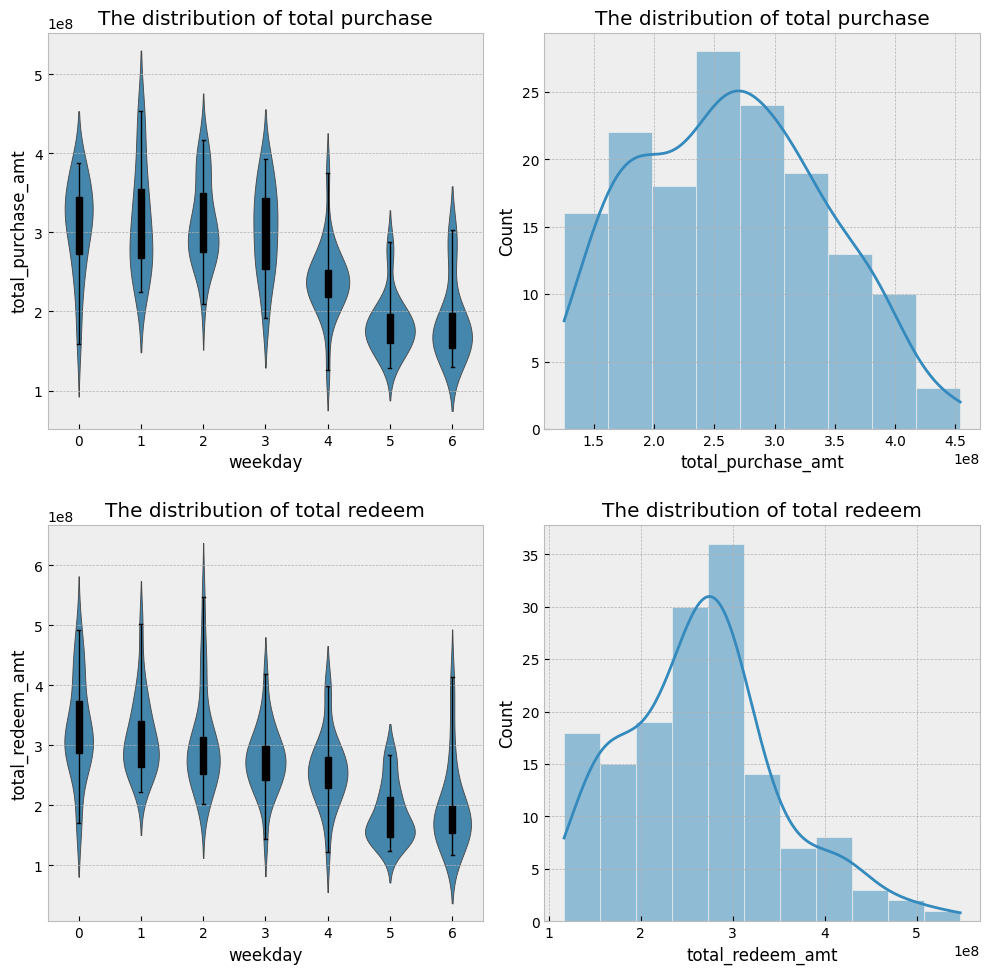

In [12]:
# Draw a distribution graph showing the distribution of each next day’s data to the overall data

fig = plt.figure(figsize=(10, 10))

# Violin plot with boxplot of total purchase amount by weekday
plt.subplot(2, 2, 1)
plt.title('The distribution of total purchase')
sns.violinplot(x='weekday', y='total_purchase_amt', data=total_balance_1, inner=None)
sns.boxplot(x='weekday', y='total_purchase_amt', data=total_balance_1, whis=[0, 100], width=0.1, color='k')

# Distribution plot of total purchase amount
plt.subplot(2, 2, 2)
plt.title('The distribution of total purchase')
sns.histplot(total_balance_1['total_purchase_amt'].dropna(), kde=True)

# Violin plot with boxplot of total redeem amount by weekday
plt.subplot(2, 2, 3)
plt.title('The distribution of total redeem')
sns.violinplot(x='weekday', y='total_redeem_amt', data=total_balance_1, inner=None)
sns.boxplot(x='weekday', y='total_redeem_amt', data=total_balance_1, whis=[0, 100], width=0.1, color='k')

# Distribution plot of total redeem amount
plt.subplot(2, 2, 4)
plt.title('The distribution of total redeem')
sns.histplot(total_balance_1['total_redeem_amt'].dropna(), kde=True)

plt.tight_layout()
plt.show()


In [14]:
# Aggregate the data by the next day and take the average

week_sta = total_balance_1[['total_purchase_amt', 'total_redeem_amt', 'weekday']].groupby('weekday', as_index=False).mean()

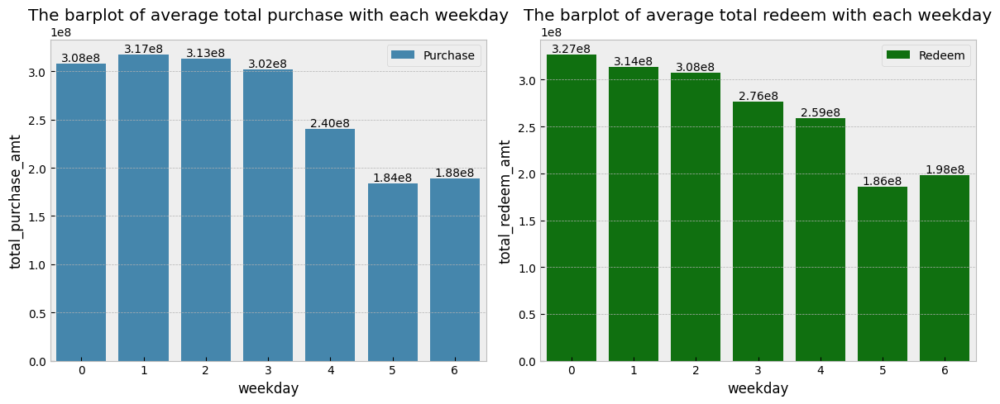

In [15]:
# Analyze the median feature of the next day

# Define a function to convert labels to e^8 units
def format_label(value):
    return f'{value / 10**8:.2f}e8'

plt.figure(figsize=(12, 5))

# Barplot of average total purchase with each weekday
ax = plt.subplot(1, 2, 1)
plt.title('The barplot of average total purchase with each weekday')
sns.barplot(x="weekday", y="total_purchase_amt", data=week_sta, ax=ax, label='Purchase')
ax.legend()
# Add data labels and convert to e^8 units
for container in ax.containers:
    labels = [format_label(v) for v in container.datavalues]
    ax.bar_label(container, labels=labels)

# Barplot of average total redeem with each weekday
ax = plt.subplot(1, 2, 2)
plt.title('The barplot of average total redeem with each weekday')
sns.barplot(x="weekday", y="total_redeem_amt", data=week_sta, color='green', ax=ax, label='Redeem')
ax.legend()
# Add data labels and convert to e^8 units
for container in ax.containers:
    labels = [format_label(v) for v in container.datavalues]
    ax.bar_label(container, labels=labels)

plt.tight_layout()
plt.show()


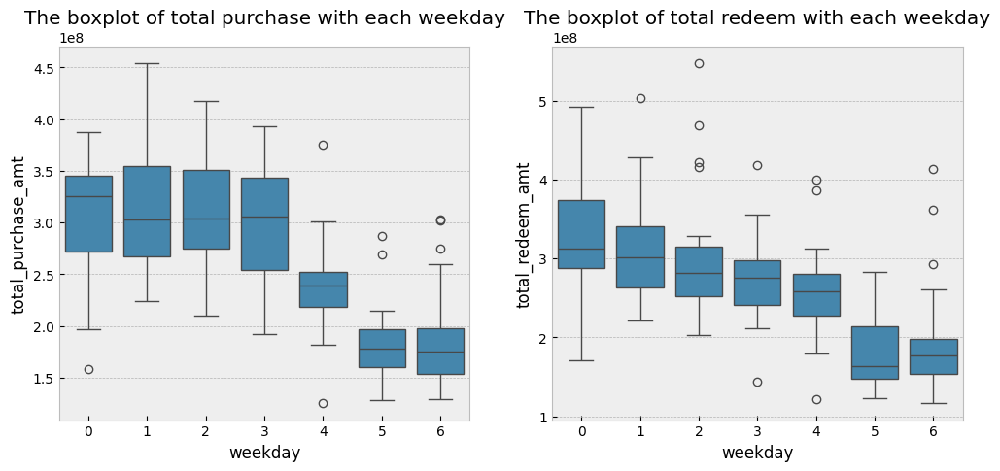

In [16]:
# Draw a box plot for the next day

plt.figure(figsize=(12, 5))
ax = plt.subplot(1,2,1)
plt.title('The boxplot of total purchase with each weekday')
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=total_balance_1)
ax = plt.subplot(1,2,2)
plt.title('The boxplot of total redeem with each weekday')
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=total_balance_1)

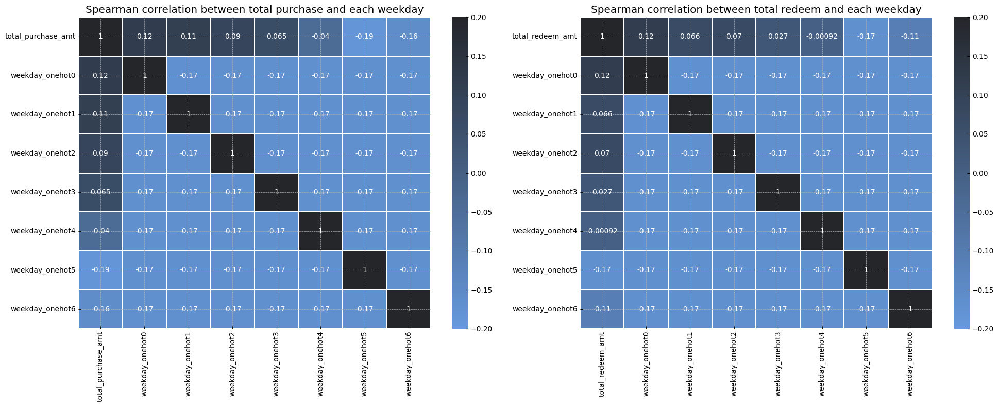

In [17]:
# Use OneHot encoding to take the day of the week as a feature, and then calculate the Spearman correlation coefficient between the purchase and redemption amounts and each day of the week

# OneHot encoding weekday feature
encoder = OneHotEncoder()
week_feature = encoder.fit_transform(total_balance[['weekday']]).toarray()
week_feature_names = [f'weekday_onehot{i}' for i in range(week_feature.shape[1])]
week_feature_df = pd.DataFrame(week_feature, columns=week_feature_names)

# Concatenating original data with encoded features
feature = pd.concat([total_balance, week_feature_df], axis=1)

# Plotting correlations
plt.figure(figsize=(20, 8))

# Correlation for total purchase amount
plt.subplot(1, 2, 1)
plt.title('Spearman correlation between total purchase and each weekday')
sns.heatmap(feature.corr(method='spearman')[['total_purchase_amt'] + week_feature_names].loc[['total_purchase_amt'] + week_feature_names],
            linewidths=0.1, vmax=0.2, vmin=-0.2, cmap = sns.dark_palette("#69d", reverse=True, as_cmap=True), annot=True)

# Correlation for total redeem amount
plt.subplot(1, 2, 2)
plt.title('Spearman correlation between total redeem and each weekday')
sns.heatmap(feature.corr(method='spearman')[['total_redeem_amt'] + week_feature_names].loc[['total_redeem_amt'] + week_feature_names],
            linewidths=0.1, vmax=0.2, vmin=-0.2, cmap = sns.dark_palette("#69d", reverse=True, as_cmap=True), annot=True)

plt.tight_layout()
plt.show()

## 1.3)Monthly feature analysis

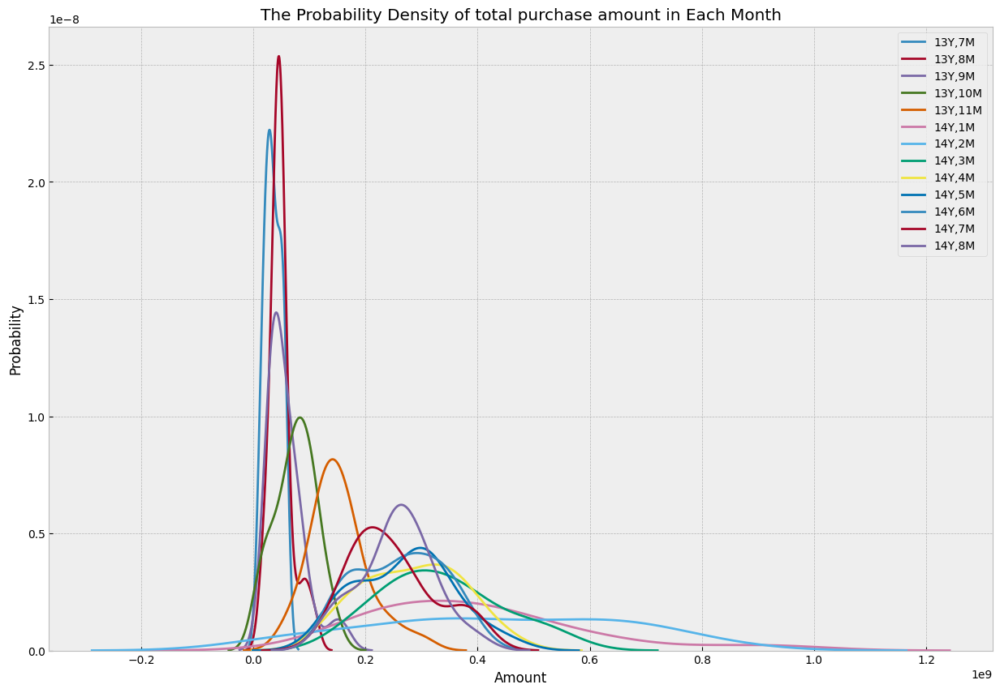

In [18]:
# Draw an estimated distribution diagram of the total purchase volume for each month (kdeplot)

plt.figure(figsize=(15,10))
plt.title('The Probability Density of total purchase amount in Each Month')
plt.ylabel('Probability')
plt.xlabel('Amount')
for i in range(7, 12):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2013/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2013/{}/1'.format(i+1)))]['total_purchase_amt'],label='13Y,'+str(i)+'M')
for i in range(1, 9):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.legend()

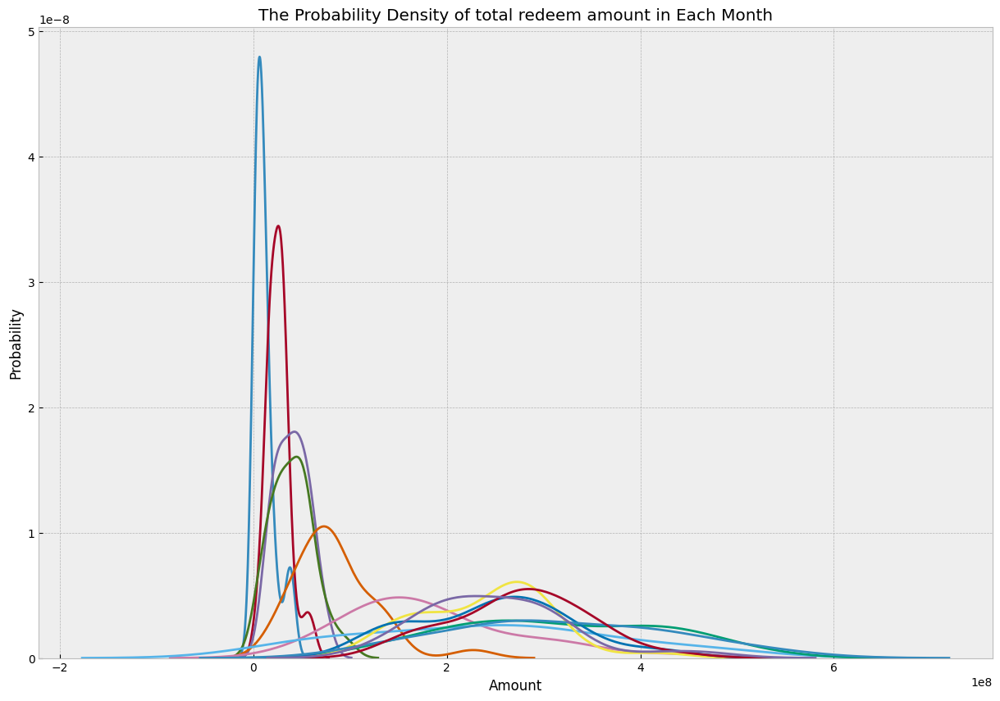

In [19]:
# Draw an estimated distribution diagram of the total redemption amount each month (kdeplot)

plt.figure(figsize=(15,10))
plt.title('The Probability Density of total redeem amount in Each Month')
plt.ylabel('Probability')
plt.xlabel('Amount')
for i in range(7, 12):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2013/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2013/{}/1'.format(i+1)))]['total_redeem_amt'],label='13Y,'+str(i)+'M')
for i in range(1, 9):
    sns.kdeplot(total_balance[(total_balance['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')

The probability density distribution of the total purchase (redemption) amount for each month is shown.

- Among them, July 2013 (13Y,7M) has the highest peak, which indicates that in this month, the total purchase amount is concentrated around a certain value more often. Most other months have lower peaks and wider distribution, indicating that the purchase amount distribution in these months is more dispersed.

- Months such as August 2013 (13Y,8M) and September 2013 (13Y,9M) also show relatively high peaks, indicating that the purchase behavior in these months is relatively consistent, and the total purchase amount is concentrated around relatively similar values. In contrast, the peaks of February 2014 (14Y,2M) and April 2014 (14Y,4M) are wider and lower, indicating that the purchase amount distribution in these months is wider, probably because the purchase amount is more dispersed.

- By comparing the density distribution of the second half of 2013 and the first half of 2014, changes in purchase behavior over time can be observed. The peaks have become lower and wider overall, which may indicate an increase in the variability of purchase amounts or a change in purchase behavior.

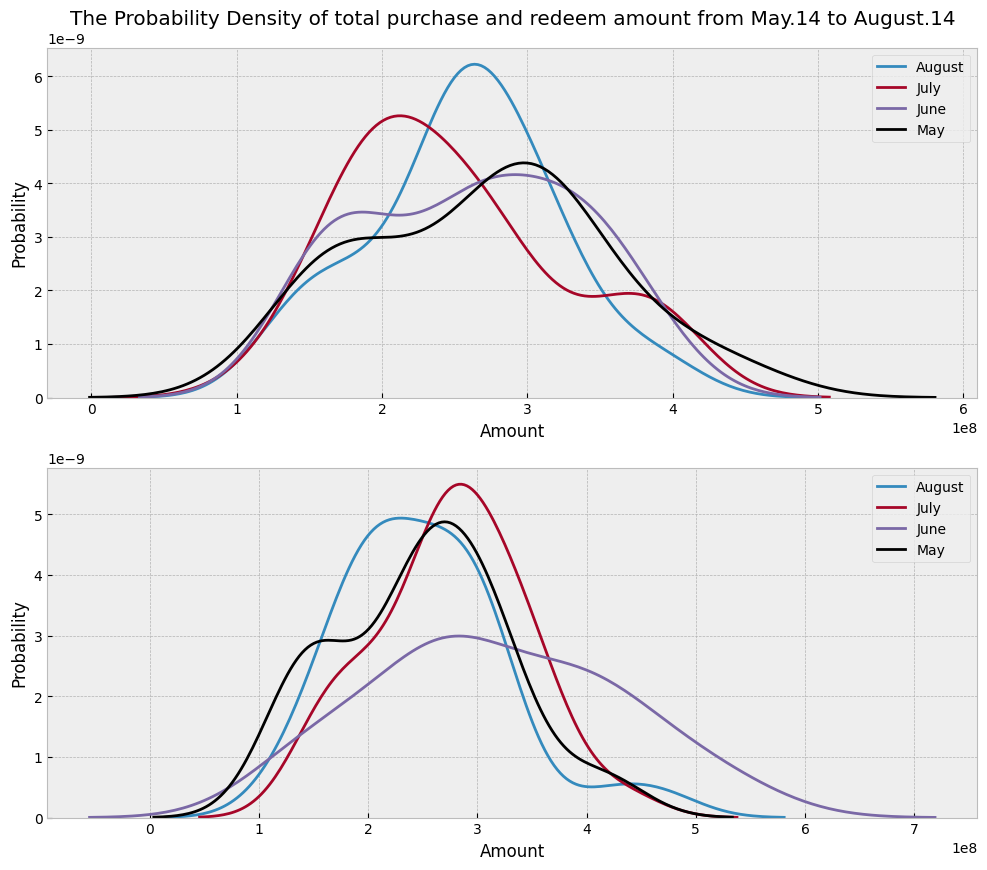

In [20]:
# Draw the estimated distribution graph for May, June, July and August 2014

plt.figure(figsize=(12,10))

ax = plt.subplot(2,1,1)
plt.title('The Probability Density of total purchase and redeem amount from May.14 to August.14')
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_2['total_purchase_amt'],label='August')
ax = sns.kdeplot(total_balance_3['total_purchase_amt'],label='July')
ax = sns.kdeplot(total_balance_4['total_purchase_amt'],label='June')
ax = sns.kdeplot(total_balance_5['total_purchase_amt'],color='Black',label='May')
plt.legend()
ax = plt.subplot(2,1,2)
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_2['total_redeem_amt'],label='August')
ax = sns.kdeplot(total_balance_3['total_redeem_amt'],label='July')
ax = sns.kdeplot(total_balance_4['total_redeem_amt'],label='June')
ax = sns.kdeplot(total_balance_5['total_redeem_amt'],color='Black',label='May')
plt.legend()

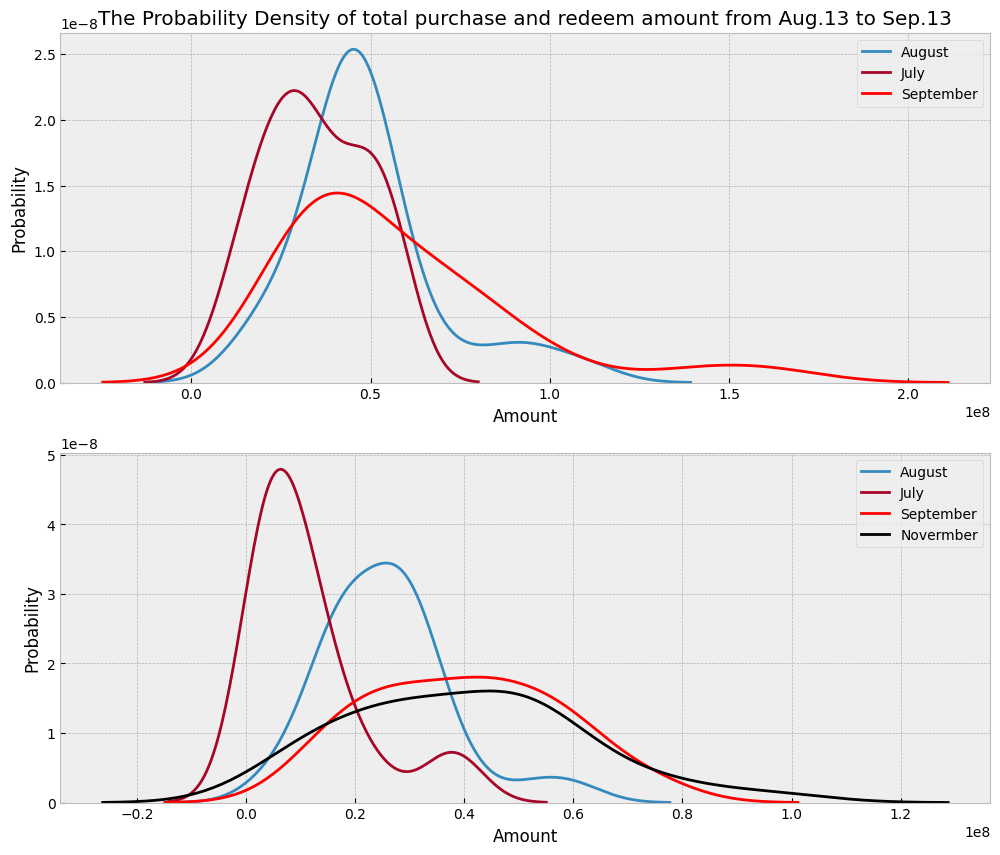

In [21]:
# Draw the distribution estimate from August to September 2013

total_balance_last_7 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/7/1')) & (total_balance['date'] < pd.to_datetime('2013/8/1'))]
total_balance_last_8 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/8/1')) & (total_balance['date'] < pd.to_datetime('2013/9/1'))]
total_balance_last_9 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/1')) & (total_balance['date'] < pd.to_datetime('2013/10/1'))]
total_balance_last_10 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/10/1')) & (total_balance['date'] < pd.to_datetime('2013/11/1'))]
plt.figure(figsize=(12,10))
ax = plt.subplot(2,1,1)
plt.title('The Probability Density of total purchase and redeem amount from Aug.13 to Sep.13')
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_last_8['total_purchase_amt'],label='August')
ax = sns.kdeplot(total_balance_last_7['total_purchase_amt'],label='July')
ax = sns.kdeplot(total_balance_last_9['total_purchase_amt'],color='Red',label='September')
plt.legend()

ax = plt.subplot(2,1,2)
plt.ylabel('Probability')
plt.xlabel('Amount')
ax = sns.kdeplot(total_balance_last_8['total_redeem_amt'],label='August')
ax = sns.kdeplot(total_balance_last_7['total_redeem_amt'],label='July')
ax = sns.kdeplot(total_balance_last_9['total_redeem_amt'],color='Red',label='September')
ax = sns.kdeplot(total_balance_last_10['total_redeem_amt'],color='Black',label='Novermber')
plt.legend()

## 1.4)Date feature analysis

In [22]:
# Aggregate data sets by day

day_sta = total_balance_2[['total_purchase_amt', 'total_redeem_amt', 'day']].groupby('day', as_index=False).mean()

Text(0.5, 1.0, 'The total Purchase in Aug.14')

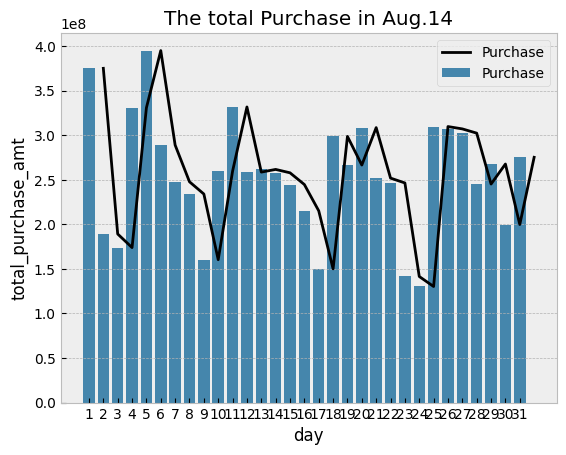

In [23]:
# Get the histogram of monthly purchase distribution after aggregation

ax = sns.barplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase', color = 'k')
ax.legend()
plt.title("The total Purchase in Aug.14")

Text(0.5, 1.0, 'The total Redeem in Aug.14')

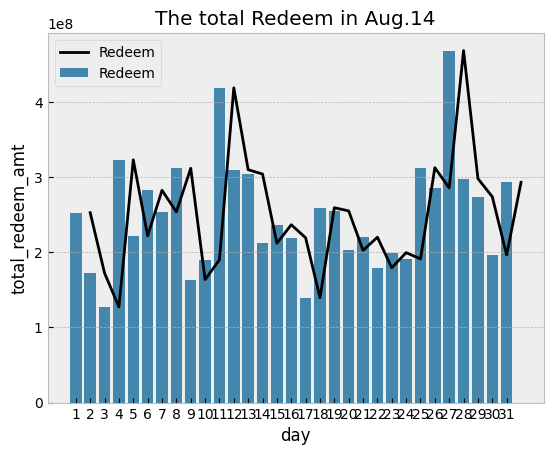

In [24]:
# Get a histogram of the aggregated monthly redemption distribution

ax = sns.barplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem')
ax = sns.lineplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'k')
ax.legend()
plt.title("The total Redeem in Aug.14")

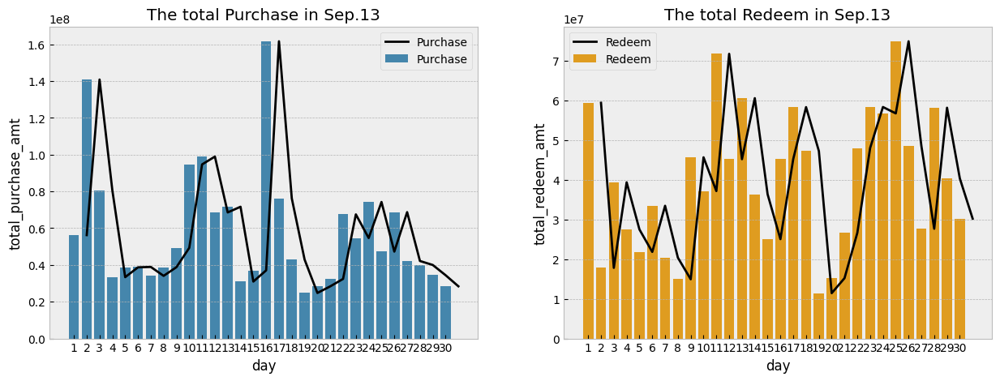

In [25]:
# Draw the distribution chart for September 2013

plt.figure(figsize=(15,5))
day_sta = total_balance_last_9[['total_purchase_amt', 'total_redeem_amt', 'day']].groupby('day', as_index=False).mean()
plt.subplot(1,2,1)
plt.title("The total Purchase in Sep.13")
ax = sns.barplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=day_sta, label='Purchase', color = 'k')
plt.subplot(1,2,2)
plt.title("The total Redeem in Sep.13")
bx = sns.barplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'orange')
bx = sns.lineplot(x="day", y="total_redeem_amt", data=day_sta, label='Redeem', color = 'k')

We found that the data from September last year had several weekly characteristics

There were several strange things in September:

* Day 1
* Day 2
* Day 16 (especially high purchases) - three days before the Mid-Autumn Festival and Monday
* Day 11 and Day 25 (both days were Wednesdays, with high redemption amounts)
* Days 18, 19, and 20 (both redemption amounts and purchase amounts were very low)

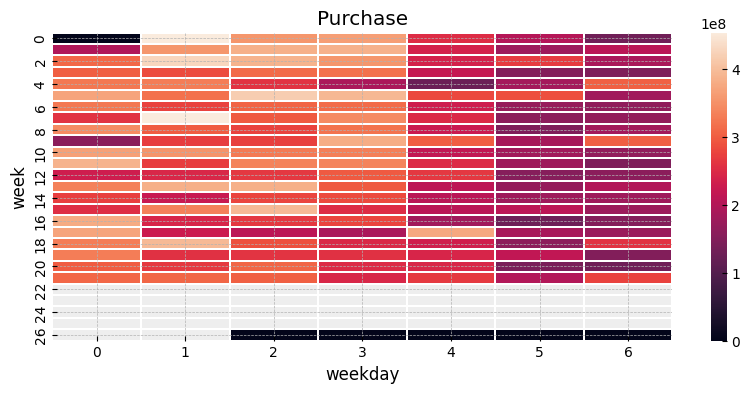

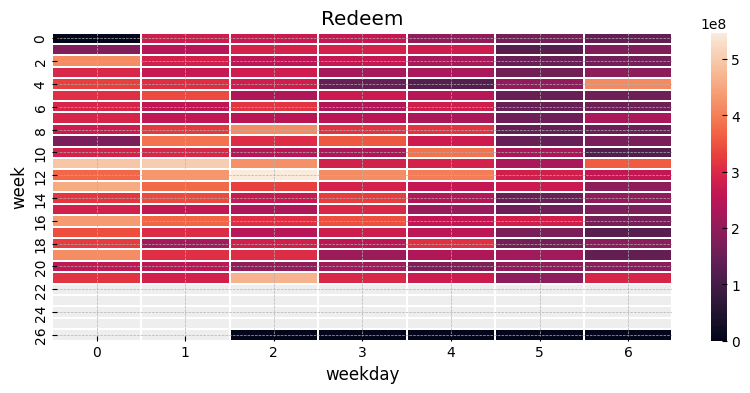

In [26]:
# Draw a heat map of all historical days

# Make sure the week and weekday columns are integers
total_balance_1['week'] = total_balance_1['week'].astype(int)
total_balance_1['weekday'] = total_balance_1['weekday'].astype(int)

# Create a heat map of purchase amount
test_purchase = np.zeros((max(total_balance_1['week']) - min(total_balance_1['week']) + 1, 7))
test_purchase[total_balance_1['week'] - min(total_balance_1['week']), total_balance_1['weekday']] = total_balance_1['total_purchase_amt']

f, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(test_purchase, linewidths=0.1, ax=ax)
ax.set_title("Purchase")
ax.set_xlabel('weekday')
ax.set_ylabel('week')

# Create a heat map of redemption amounts
test_redeem = np.zeros((max(total_balance_1['week']) - min(total_balance_1['week']) + 1, 7))
test_redeem[total_balance_1['week'] - min(total_balance_1['week']), total_balance_1['weekday']] = total_balance_1['total_redeem_amt']

f, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(test_redeem, linewidths=0.1, ax=ax)
ax.set_title("Redeem")
ax.set_xlabel('weekday')
ax.set_ylabel('week')

plt.show()

From the heat map, we can see that the fourth week and Saturday (weekday 6) are particularly strange, and so are the 12th week and Tuesday (weekday 2).

In [27]:
# Data analysis of abnormal points in the heat map.1

total_balance_1[(total_balance_1['week'] == 4 + min(total_balance_1['week'])) & (total_balance_1['weekday'] == 6)]

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
307,2014-05-04,303087562.0000,413222034.0000,4,5,2014,18,6


May 4th is a special day in China, as it is the first working day after Labor Day.

In [28]:
# Data analysis of abnormal points in the heat map.2

total_balance_1[(total_balance_1['week'] == 12 + min(total_balance_1['week'])) & (total_balance_1['weekday'] == 2)]

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
359,2014-06-25,264663201.0000,547295931.0000,25,6,2014,26,2


On 2016-06-25, the amount redeemed by users was much greater than the amount purchased

## 1.5) Analysis of holidays
* Qingming Festival (April 5 - April 7)
* Labor Day (May 1 - May 5)
* Dragon Boat Festival (May 31 - June 2)
* Mid-Autumn Festival (September 6 - September 8)

* Mother's Day (May 13)
* Father's Day (June 17)
* Tmall Shopping Festival (June 18)
* Teacher's Day (September 9)

In [29]:

# Get holiday data

qingming = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/5')) & (total_balance['date'] < pd.to_datetime('2014/4/8'))]
labour = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/1')) & (total_balance['date'] < pd.to_datetime('2014/5/4'))]
duanwu = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/31')) & (total_balance['date'] < pd.to_datetime('2014/6/3'))]
data618 = total_balance[(total_balance['date'] >= pd.to_datetime('2014/6/10')) & (total_balance['date'] < pd.to_datetime('2014/6/20'))]

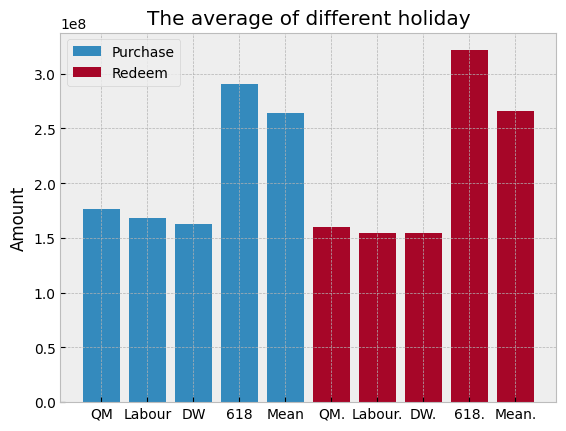

In [30]:
# Plot the mean of holidays and weekdays
fig = plt.figure()
index_list = ['QM','Labour','DW','618','Mean']
label_list = [np.mean(qingming['total_purchase_amt']), np.mean(labour['total_purchase_amt']),np.mean(duanwu['total_purchase_amt']),np.mean(data618['total_purchase_amt']),np.mean(total_balance_1['total_purchase_amt'])]
plt.bar(index_list, label_list, label="Purchase")

index_list = ['QM.','Labour.','DW.','618.','Mean.']
label_list = [np.mean(qingming['total_redeem_amt']), np.mean(labour['total_redeem_amt']),np.mean(duanwu['total_redeem_amt']),np.mean(data618['total_redeem_amt']),np.mean(total_balance_1['total_redeem_amt'])]
plt.bar(index_list, label_list, label="Redeem")
plt.title("The average of different holiday")
plt.ylabel("Amount")
plt.legend()
plt.show()

## 1.6)Analysis of dates around holidays

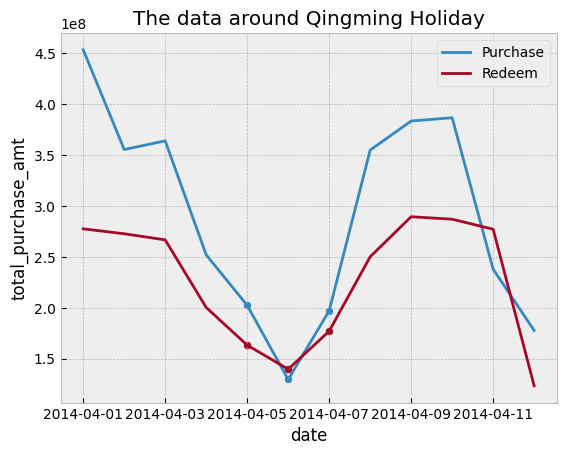

In [31]:
# Draw a time series diagram for Qingming Festival and surrounding dates

qingming_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/1')) & (total_balance['date'] < pd.to_datetime('2014/4/13'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=qingming_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=qingming_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=qingming, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=qingming, ax=ax)
plt.title("The data around Qingming Holiday")
ax.legend()

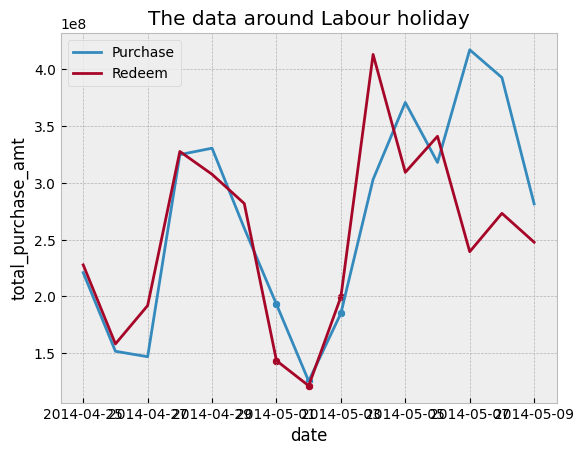

In [32]:
# Draw a time series diagram of Labor Day and surrounding dates

labour_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/4/25')) & (total_balance['date'] < pd.to_datetime('2014/5/10'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=labour_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=labour_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=labour, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=labour, ax=ax)
plt.title("The data around Labour holiday")
ax.legend()

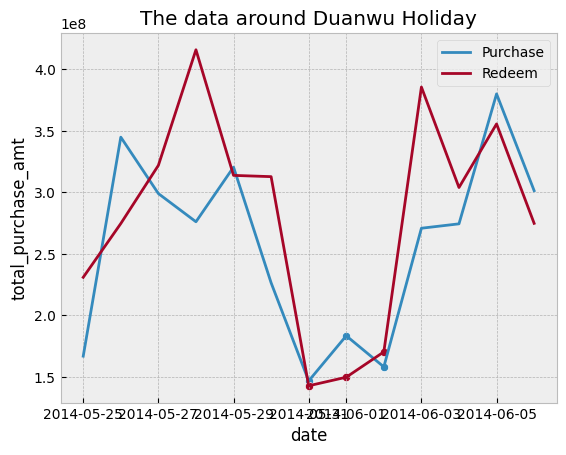

In [33]:
# # Draw a time series diagram of the Dragon Boat Festival and surrounding dates

duanwu_around = total_balance[(total_balance['date'] >= pd.to_datetime('2014/5/25')) & (total_balance['date'] < pd.to_datetime('2014/6/7'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=duanwu_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=duanwu_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=duanwu, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=duanwu, ax=ax)
plt.title("The data around Duanwu Holiday")
ax.legend()

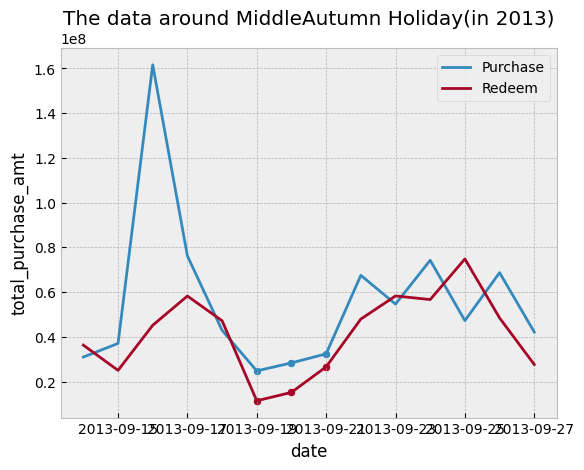

In [34]:
# Draw a time series diagram of Mid-Autumn Festival and surrounding dates

zhongqiu = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/19')) & (total_balance['date'] < pd.to_datetime('2013/9/22'))]
zhongqiu_around = total_balance[(total_balance['date'] >= pd.to_datetime('2013/9/14')) & (total_balance['date'] < pd.to_datetime('2013/9/28'))]
ax = sns.lineplot(x="date", y="total_purchase_amt", data=zhongqiu_around, label='Purchase')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=zhongqiu_around, label='Redeem', ax=ax)
ax = sns.scatterplot(x="date", y="total_purchase_amt", data=zhongqiu, ax=ax)
ax = sns.scatterplot(x="date", y="total_redeem_amt", data=zhongqiu, ax=ax)
plt.title("The data around MiddleAutumn Holiday(in 2013)")
ax.legend()

## 1.7)Analysis of outliers

Text(0.5, 1.0, 'The abnormal value of total purchase')

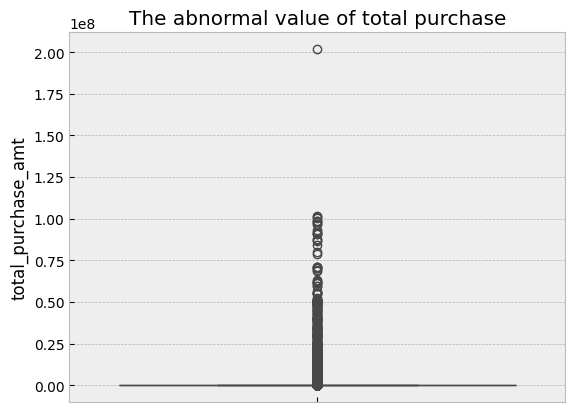

In [35]:
# Draw a box plot of user transaction records

sns.boxplot(balance_data['total_purchase_amt'])
plt.title("The abnormal value of total purchase")

In [36]:
# Analysis of trading behavior of users who purchased 2e8

balance_data[balance_data['user_id'] == 14592].sort_values(by = ['report_date','total_redeem_amt'],ascending = [True,False]).head()

,user_id,report_date,tBalance,yBalance,total_purchase_amt,direct_purchase_amt,purchase_bal_amt,purchase_bank_amt,total_redeem_amt,consume_amt,transfer_amt,tftobal_amt,tftocard_amt,share_amt,category1,category2,category3,category4,date,day,month,year,week,weekday
1453312,14592,20131101,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2013-11-01,1,11,2013,44,4
1453311,14592,20131104,99457728,0,201768328,201768328,201275171,493157,102310600,0,102310600,0,102310600,0,NaN,NaN,NaN,NaN,2013-11-04,4,11,2013,45,0
1453313,14592,20131105,97458675,99457728,4899446,4899446,4899446,0,6898499,0,6898499,0,6898499,0,NaN,NaN,NaN,NaN,2013-11-05,5,11,2013,45,1
1453210,14592,20131106,97662610,97458675,203935,191347,0,191347,0,0,0,0,0,12588,NaN,NaN,NaN,NaN,2013-11-06,6,11,2013,45,2
1453310,14592,20131107,97675216,97662610,12606,0,0,0,0,0,0,0,0,12606,NaN,NaN,NaN,NaN,2013-11-07,7,11,2013,45,3


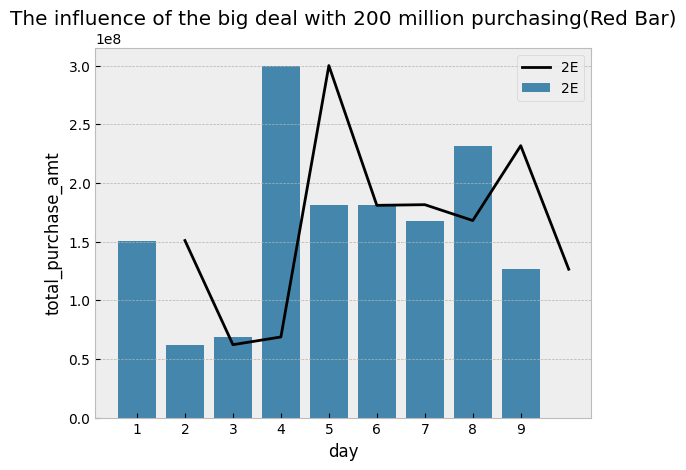

In [37]:
# Plot the total volume on the day when the single transaction was 2e8 and the volume on the nearby days

e2 = total_balance[(total_balance['date'] >= pd.to_datetime('2013/11/1')) & (total_balance['date'] < pd.to_datetime('2013/11/10'))]
ax = sns.barplot(x="day", y="total_purchase_amt", data=e2, label='2E')
ax = sns.lineplot(x="day", y="total_purchase_amt", data=e2, label='2E', color = 'k')
plt.title("The influence of the big deal with 200 million purchasing(Red Bar)")
ax.legend()

Text(0.5, 1.0, 'The Biggest deal happend in each day')

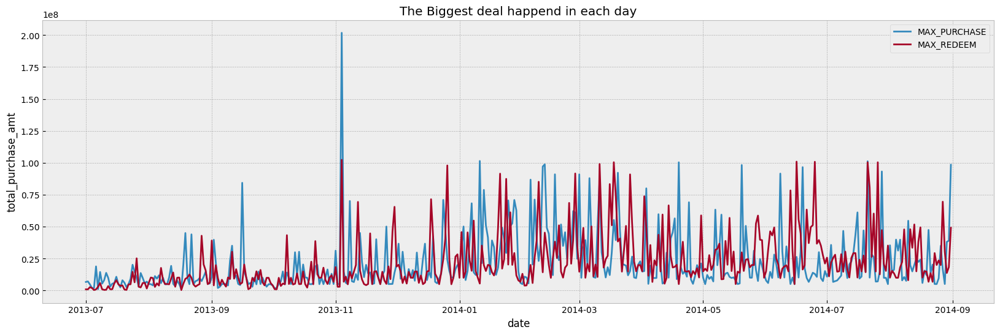

In [38]:
# Draw a time series diagram of the largest single transaction per day

plt.figure(figsize=(20, 6))
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_REDEEM')
plt.title("The Biggest deal happend in each day")

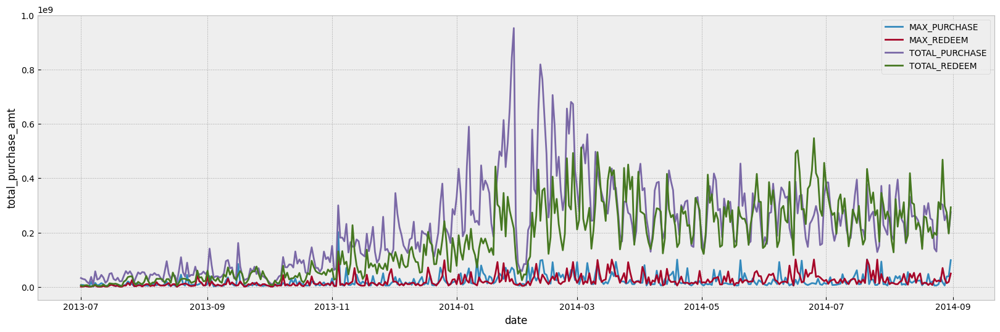

In [39]:
# Draw a time series diagram of the largest single transaction and total transaction amount per day

plt.figure(figsize=(20, 6))
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).max(), label='MAX_REDEEM')
ax = sns.lineplot(x="date", y="total_purchase_amt", data=balance_data[['total_purchase_amt', 'date']].groupby('date', as_index=False).sum(), label='TOTAL_PURCHASE')
ax = sns.lineplot(x="date", y="total_redeem_amt", data=balance_data[['total_redeem_amt', 'date']].groupby('date', as_index=False).sum(), label='TOTAL_REDEEM')

Text(0.5, 1.0, 'The frequency of super big deal(larger than 100million) in each month')

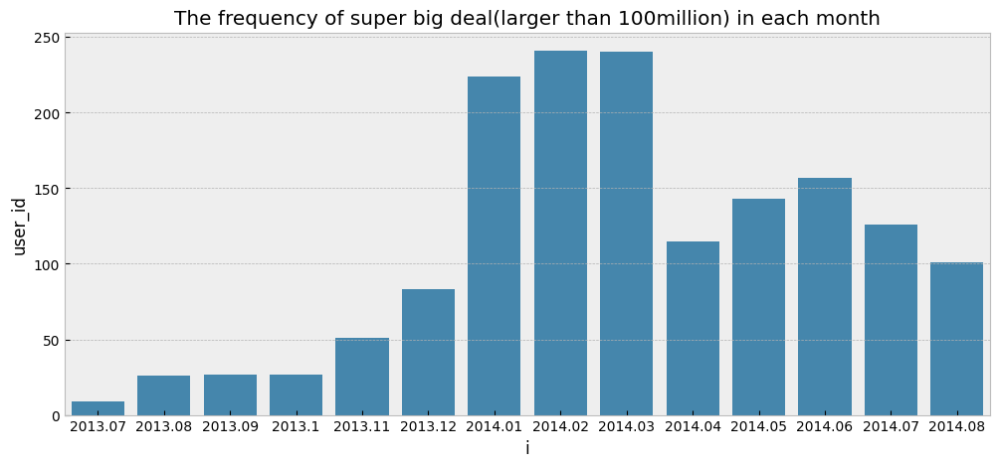

In [40]:
# Draw a histogram of the frequency of large transactions per month

big_frequancy = balance_data[(balance_data['total_purchase_amt'] > 10000000) | (balance_data['total_redeem_amt'] > 10000000)][['month','year','user_id']].groupby(['year','month'], as_index=False).count()
big_frequancy['i'] = big_frequancy['year']  + big_frequancy['month'] / 100
plt.figure(figsize = [12,5])
ax = sns.barplot(x="i", y="user_id", data=big_frequancy)
plt.title("The frequency of super big deal(larger than 100million) in each month")

In [41]:
# Get a dataset of large transactions

balance_data['big_purchase'] = 0
balance_data.loc[balance_data['total_purchase_amt'] > 1000000, 'big_purchase'] = 1
balance_data['big_redeem'] = 0
balance_data.loc[balance_data['total_redeem_amt'] > 1000000, 'big_redeem'] = 1

In [42]:
# Aggregate large transactions on a daily basis

big_purchase = balance_data[balance_data['big_purchase'] == 1].groupby(['date'], as_index=False)['total_purchase_amt'].sum()
small_purchase = balance_data[balance_data['big_purchase'] == 0].groupby(['date'], as_index=False)['total_purchase_amt'].sum()
big_redeem = balance_data[balance_data['big_redeem'] == 1].groupby(['date'], as_index=False)['total_redeem_amt'].sum()
small_redeem = balance_data[balance_data['big_redeem'] == 0].groupby(['date'], as_index=False)['total_redeem_amt'].sum()

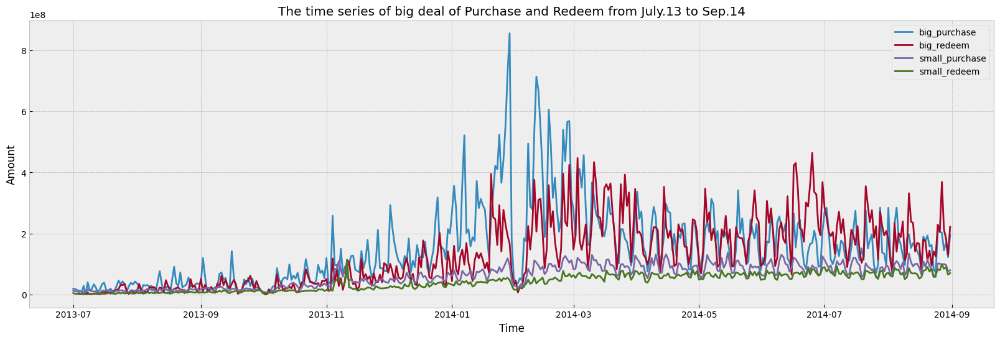

In [43]:
# Draw a time series distribution diagram of large and small transactions

fig = plt.figure(figsize=(20,6))
plt.plot(big_purchase['date'], big_purchase['total_purchase_amt'],label='big_purchase')
plt.plot(big_redeem['date'], big_redeem['total_redeem_amt'],label='big_redeem')

plt.plot(small_purchase['date'], small_purchase['total_purchase_amt'],label='small_purchase')
plt.plot(small_redeem['date'], small_redeem['total_redeem_amt'],label='small_redeem')
plt.legend(loc='best')
plt.title("The time series of big deal of Purchase and Redeem from July.13 to Sep.14")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

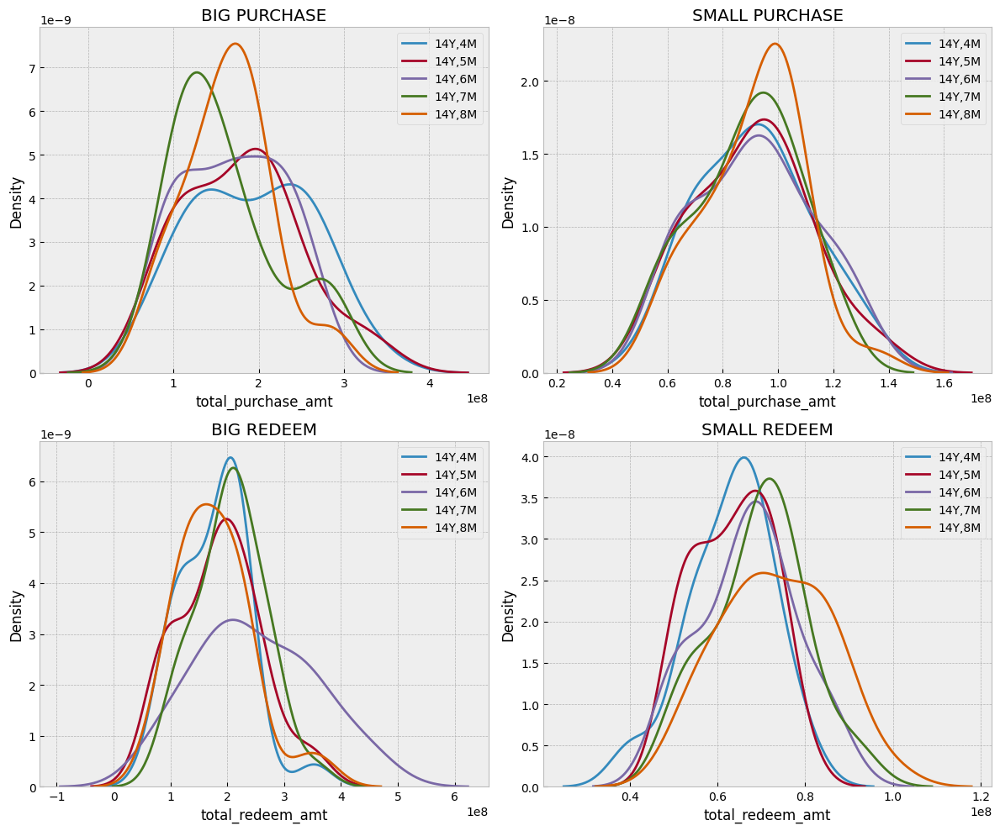

In [44]:
# Draw an estimated distribution of large and small transactions
plt.figure(figsize=(12,10))

plt.subplot(2,2,1)
for i in range(4, 9):
    sns.kdeplot(big_purchase[(big_purchase['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (big_purchase['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.title('BIG PURCHASE')
plt.legend()

plt.subplot(2,2,2)
for i in range(4, 9):
    sns.kdeplot(small_purchase[(small_purchase['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (small_purchase['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_purchase_amt'],label='14Y,'+str(i)+'M')
plt.title('SMALL PURCHASE')
plt.legend()

plt.subplot(2,2,3)
for i in range(4, 9):
    sns.kdeplot(big_redeem[(big_redeem['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (big_redeem['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')
plt.title('BIG REDEEM')
plt.legend()

plt.subplot(2,2,4)
for i in range(4, 9):
    sns.kdeplot(small_redeem[(small_redeem['date'] >= pd.to_datetime('2014/{}/1'.format(i))) & (small_redeem['date'] < pd.to_datetime('2014/{}/1'.format(i+1)))]['total_redeem_amt'],label='14Y,'+str(i)+'M')
plt.title('SMALL REDEEM')
plt.legend()

plt.tight_layout()
plt.show()

1. **BIG PURCHASE**:
  - There are obvious peaks in the distribution of large purchase amounts in each month, and the peaks are mostly concentrated between 100 million and 200 million.
  - The distribution of different months is slightly different, and some months (such as May and June 2014) show higher peaks, indicating that the large purchase behavior in these months is more concentrated.
  - The distribution of large purchases in April and August 2014 is relatively scattered, indicating that the large purchase amounts in these months have greater variability.
2. **SMALL PURCHASE**:
  - The distribution of small purchase amounts in each month is relatively concentrated, and the peaks are mostly concentrated between 0.8 and 100 million.
  - The small purchase behavior in different months is relatively consistent, and the distribution is relatively concentrated, without obvious long tail phenomenon.
3. **BIG REDEEM**:
  - There are obvious peaks in the distribution of large redemption amounts in each month, and the peaks are mostly concentrated between 200 million and 300 million.
  - The distribution of different months is quite different. The large redemption in April 2014 shows an obvious peak, while the distribution of large redemption in August 2014 is more dispersed.
  - The large redemption behavior in June 2014 and July 2014 is relatively consistent and the distribution is relatively concentrated.
4. **SMALL REDEEM**:
  - The distribution of small redemption amounts in each month is relatively concentrated, and the peaks are mostly concentrated between 0.6 and 0.8 billion.
  - The small redemption behavior in different months is relatively consistent, the distribution is relatively concentrated, and there is no obvious long tail phenomenon.

In general, analyzing the distribution of large and small transactions, it can be observed that:

- The distribution of large transactions (whether purchases or redemptions) is more dispersed, with a higher peak, indicating that transactions with larger amounts vary more between different months.
- The distribution of small transactions is more concentrated, with a lower peak, indicating that transactions with smaller amounts vary less between different months.
- Large transactions in certain months (such as large redemptions in April 2014 and large purchases in May 2014) show more concentrated trading behavior, which may be related to the market conditions or other external factors at the time.

In [45]:
# Add timestamp

big_purchase['weekday'] = big_purchase['date'].dt.weekday
small_purchase['weekday'] = small_purchase['date'].dt.weekday
big_redeem['weekday'] = big_redeem['date'].dt.weekday
small_redeem['weekday'] = small_redeem['date'].dt.weekday

Text(0.5, 1.0, 'SMALL REDEEM')

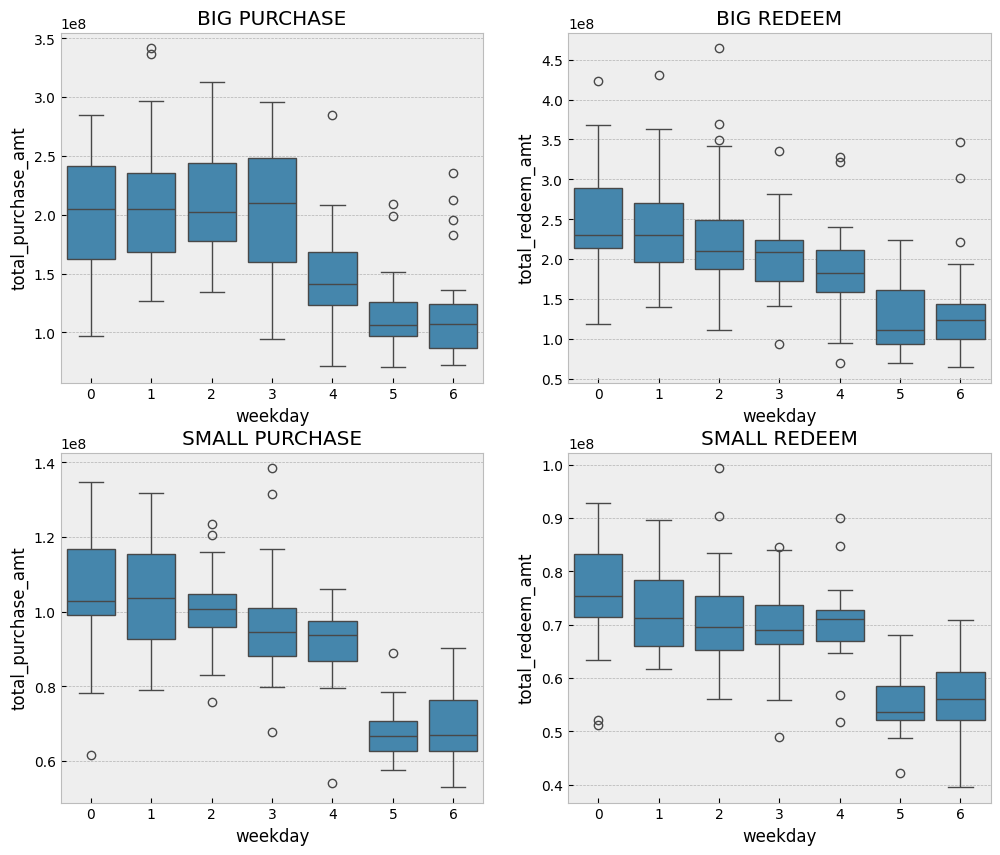

In [46]:
# Analyze the distribution of large and small amounts on the next day

plt.figure(figsize=(12, 10))

ax = plt.subplot(2,2,1)
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=big_purchase[big_purchase['date'] >= pd.to_datetime('2014/4/1')])
plt.title('BIG PURCHASE')

ax = plt.subplot(2,2,2)
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=big_redeem[big_redeem['date'] >= pd.to_datetime('2014/4/1')])
plt.title('BIG REDEEM')

ax = plt.subplot(2,2,3)
ax = sns.boxplot(x="weekday", y="total_purchase_amt", data=small_purchase[small_purchase['date'] >= pd.to_datetime('2014/4/1')])
plt.title('SMALL PURCHASE')

ax = plt.subplot(2,2,4)
ax = sns.boxplot(x="weekday", y="total_redeem_amt", data=small_redeem[small_redeem['date'] >= pd.to_datetime('2014/4/1')])
plt.title('SMALL REDEEM')

## 1.8)Analyze other variables in the user transaction record table

In [48]:
# Truncating the Dataset

data_balance_1 = balance_data[balance_data['date'] > pd.to_datetime('2014/4/1')]

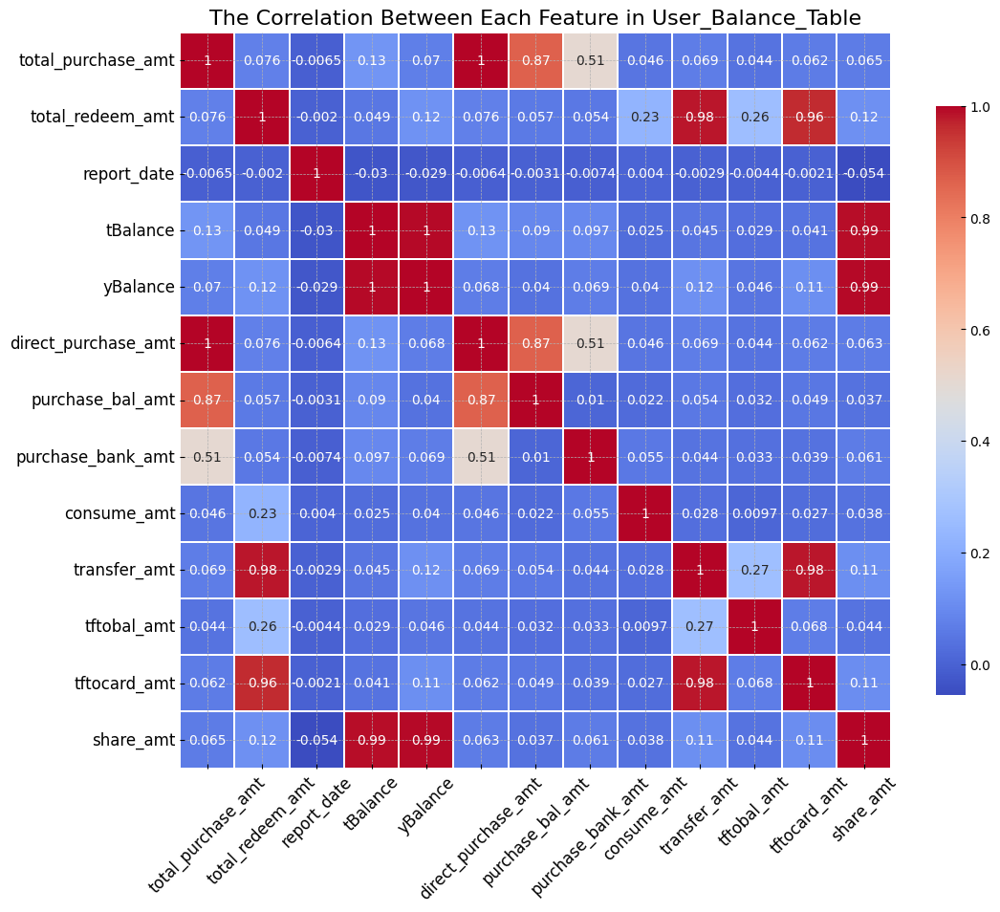

In [49]:
# Draw a correlation graph between other variables and labels in the user transaction record table

feature = ['total_purchase_amt','total_redeem_amt', 'report_date', 'tBalance', 'yBalance',
       'direct_purchase_amt', 'purchase_bal_amt', 'purchase_bank_amt',
        'consume_amt', 'transfer_amt', 'tftobal_amt',
       'tftocard_amt', 'share_amt']

# Calculate the correlation matrix of the features
corr = data_balance_1[feature].corr()

# Set the size of the plot
plt.figure(figsize=(12, 10))

# Use a more aesthetically pleasing color palette and set the annotation font size
sns.heatmap(corr, linewidths=0.1, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})

# Set the font size of the title and axis labels
plt.title("The Correlation Between Each Feature in User_Balance_Table", fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(rotation=0, fontsize=12)

plt.show()

## 1.9)Analysis of bank interest rates

In [50]:
# Read bank interest rates and add timestamp

bank = load_from_drive('1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ', info = False)
bank = bank.rename(columns = {'mfd_date': 'date'})
bank_features = [x for x in bank.columns if x not in ['date']]
bank['date'] = pd.to_datetime(bank['date'], format= "%Y%m%d")
bank['day'] = bank['date'].dt.day
bank['month'] = bank['date'].dt.month
bank['year'] = bank['date'].dt.year
bank['week'] = bank['date'].dt.isocalendar().week
bank['weekday'] = bank['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1ZJh3YXHWa-pZjq3HElDsHpuzQh7qg9jZ
To: /content/downloaded_file.csv
100%|██████████| 19.5k/19.5k [00:00<00:00, 32.1MB/s]


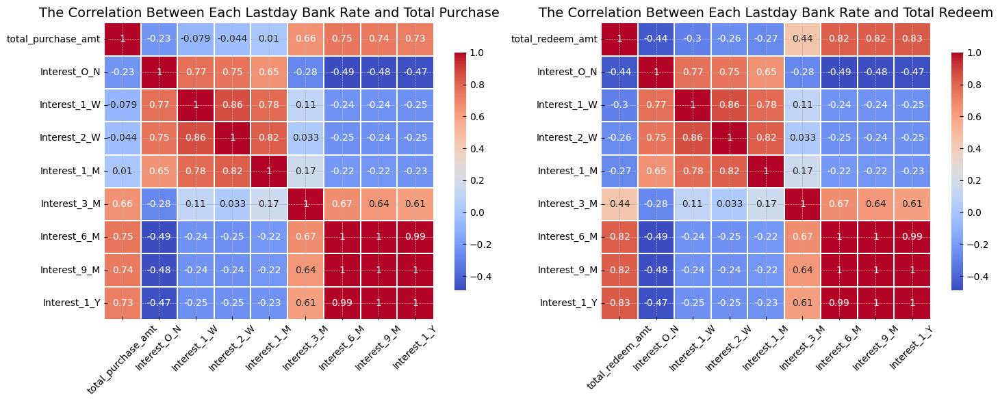

In [51]:
# Draw a correlation graph between the bank and Alipay interest rates and the label for the previous day

bank['last_date'] = bank['date'] + datetime.timedelta(days=-1)

# Set the size of the drawing
plt.figure(figsize=(15, 6))

# Sub-figure 1: Correlation between bank interest rate and total purchase amount on the previous day
plt.subplot(1, 2, 1)
plt.title("The Correlation Between Each Lastday Bank Rate and Total Purchase", fontsize=14)
temp = pd.merge(bank[['last_date'] + bank_features], total_balance, left_on='last_date', right_on='date')[['total_purchase_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Sub-figure 2: Correlation between bank interest rate and total redemption amount on the previous day
plt.subplot(1, 2, 2)
plt.title("The Correlation Between Each Lastday Bank Rate and Total Redeem", fontsize=14)
temp = pd.merge(bank[['last_date'] + bank_features], total_balance, left_on='last_date', right_on='date')[['total_redeem_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

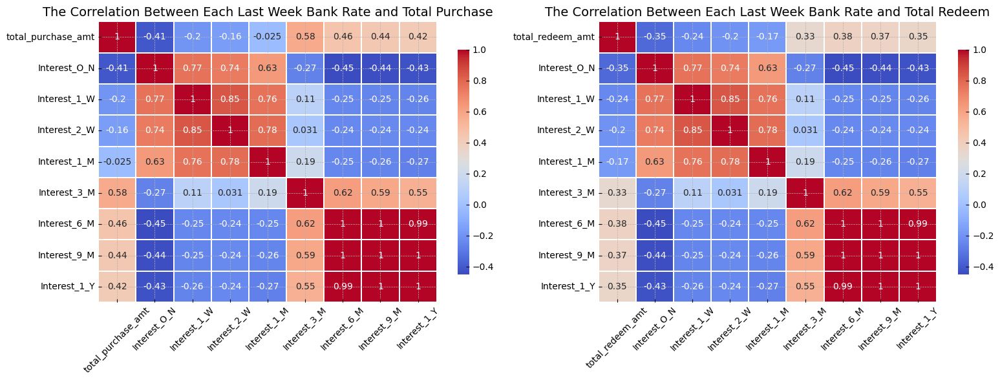

In [52]:
# Draw a correlation graph between bank and Alipay interest rates and labels from the previous week

bank['last_week'] = bank['week'] - 1

# Set the size of the drawing
plt.figure(figsize=(16, 6))

# Sub-figure 1: Correlation between bank interest rate and total purchase amount in the previous week
plt.subplot(1, 2, 1)
plt.title("The Correlation Between Each Last Week Bank Rate and Total Purchase", fontsize=14)
temp = pd.merge(bank[['last_week', 'weekday'] + bank_features], total_balance, left_on=['last_week', 'weekday'], right_on=['week', 'weekday'])[['total_purchase_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

# Sub-figure 2: Correlation between bank interest rate and total redemption amount in the previous week
plt.subplot(1, 2, 2)
plt.title("The Correlation Between Each Last Week Bank Rate and Total Redeem", fontsize=14)
temp = pd.merge(bank[['last_week', 'weekday'] + bank_features], total_balance, left_on=['last_week', 'weekday'], right_on=['week', 'weekday'])[['total_redeem_amt'] + bank_features]
sns.heatmap(temp.corr(), linewidths=0.05, annot=True, annot_kws={"size": 10}, cmap='coolwarm', cbar_kws={'shrink': .8})
plt.xticks(rotation=45, fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.tight_layout()
plt.show()

Text(0, 0.5, 'Rate')

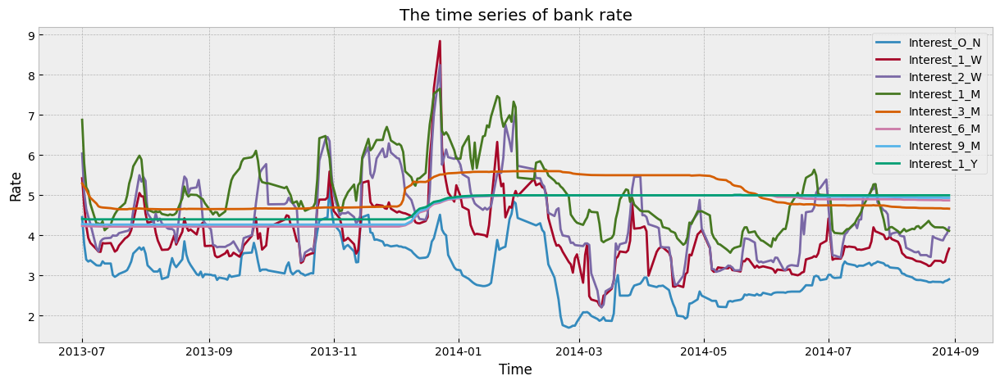

In [53]:
# Draw a time series diagram of bank interest rates

plt.figure(figsize=(15,5))
for i in bank_features:
    plt.plot(bank['date'], bank[[i]] ,label=i)
plt.legend()
plt.title("The time series of bank rate")
plt.xlabel("Time")
plt.ylabel("Rate")

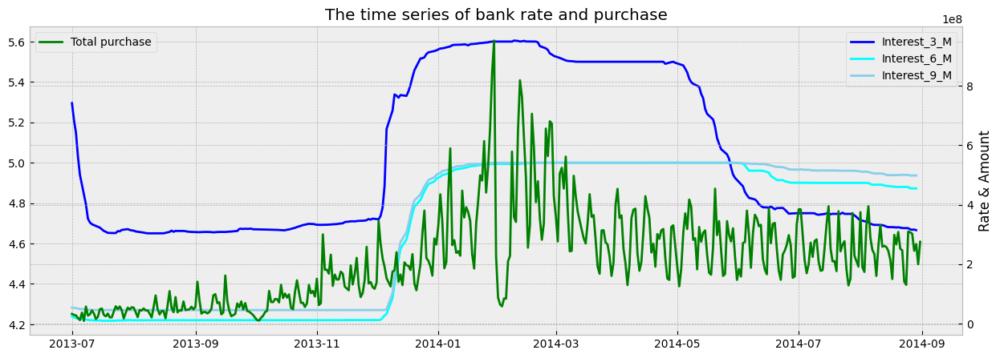

In [54]:
# Draw a time series diagram of some bank interest rates and purchase amounts

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],'b',label="Interest_3_M")
plt.plot(bank['date'], bank['Interest_6_M'],'cyan',label="Interest_6_M")
plt.plot(bank['date'], bank['Interest_9_M'],'skyblue',label="Interest_9_M")

plt.legend()

ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],'g',label="Total purchase")

plt.legend(loc=2)
plt.title("The time series of bank rate and purchase")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")
plt.show()

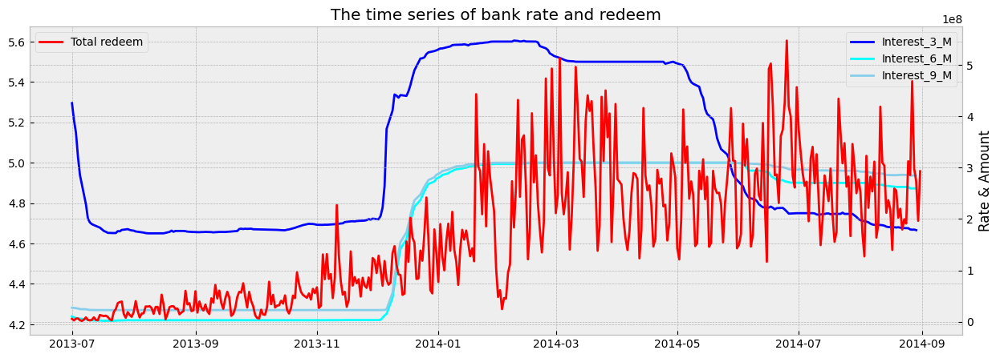

In [55]:
# Draw a time series diagram of some bank interest rates and redemption amounts

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],'b',label="Interest_3_M")
plt.plot(bank['date'], bank['Interest_6_M'],'cyan',label="Interest_6_M")
plt.plot(bank['date'], bank['Interest_9_M'],'skyblue',label="Interest_9_M")

plt.legend()

ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],'r',label="Total redeem")

plt.legend(loc=2)
plt.title("The time series of bank rate and redeem")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

## 1.10)Analysis of Alipay interest rates

In [56]:
# Read Alipay interest rate and add timestamp

share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', info = False)
share = share.rename(columns = {'mfd_date': 'date'})
share_features = [x for x in share.columns if x not in ['date']]
share['date'] = pd.to_datetime(share['date'], format= "%Y%m%d")
share['day'] = share['date'].dt.day
share['month'] = share['date'].dt.month
share['year'] = share['date'].dt.year
share['week'] = share['date'].dt.isocalendar().week
share['weekday'] = share['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI
To: /content/downloaded_file.csv
100%|██████████| 9.76k/9.76k [00:00<00:00, 21.2MB/s]


<Axes: >

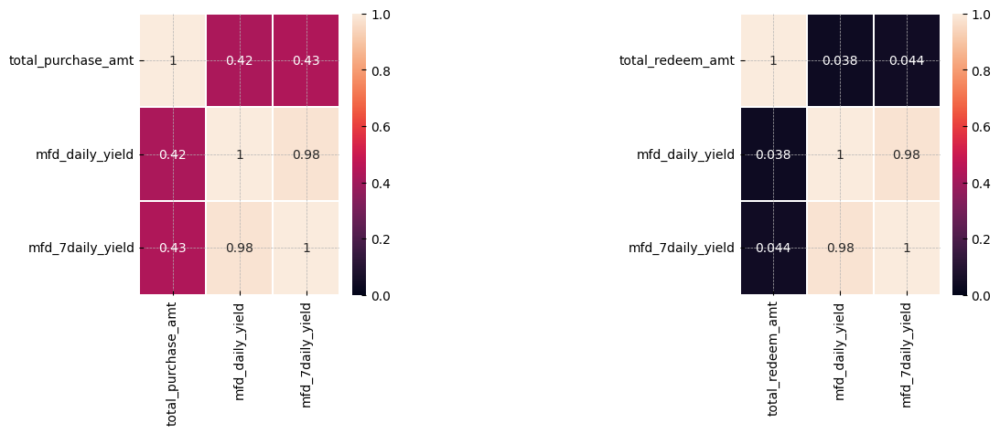

In [57]:
# Draw a correlation graph between Alipay interest rate and label

share['last_date'] = share['date'] + datetime.timedelta(days=-1)
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
temp = pd.merge(share[['last_date']+share_features], total_balance, left_on='last_date', right_on='date')[['total_purchase_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)
plt.subplot(1,3,3)
temp = pd.merge(share[['last_date']+share_features], total_balance, left_on='last_date', right_on='date')[['total_redeem_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)

<Axes: >

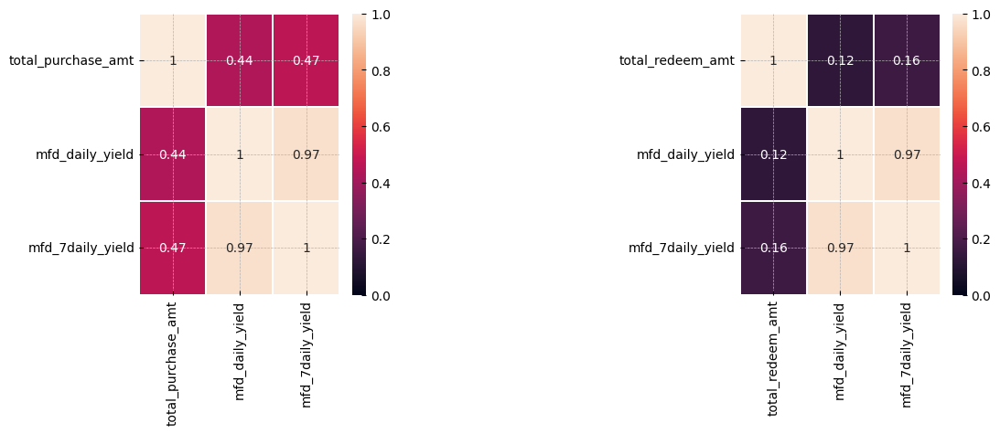

In [58]:
# Draw a graph showing the correlation between bank interest rates and labels

share['last_week'] = share['week'] - 1
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
temp = pd.merge(share[['last_week','weekday']+share_features], total_balance, left_on=['last_week','weekday'], right_on=['week','weekday'])[['total_purchase_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)
plt.subplot(1,3,3)
temp = pd.merge(share[['last_week','weekday']+share_features], total_balance, left_on=['last_week','weekday'], right_on=['week','weekday'])[['total_redeem_amt']+share_features]
sns.heatmap(temp.corr(), linewidths = 0.05, vmin = 0, annot = True)

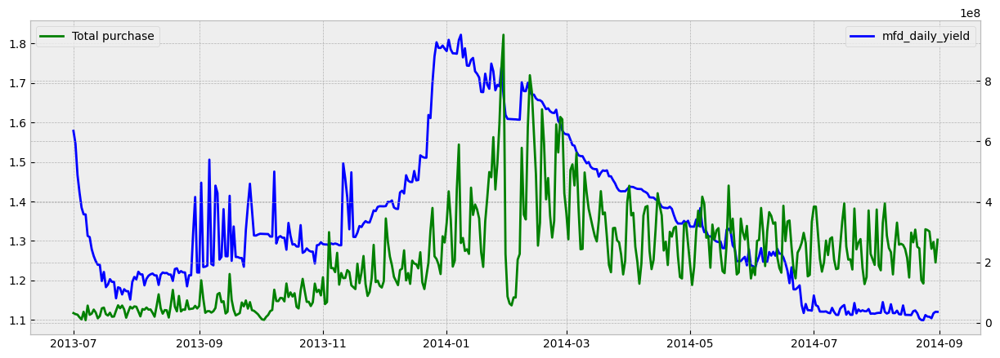

In [59]:
# Draw a time series graph of Alipay interest rate and purchase amount

fig,ax1 = plt.subplots(figsize=(15,5))
for i in share_features:
    plt.plot(share['date'], share[i],'b',label=i)
    break
plt.legend()
ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_purchase_amt'],'g',label="Total purchase")
plt.legend(loc=2)
plt.show()

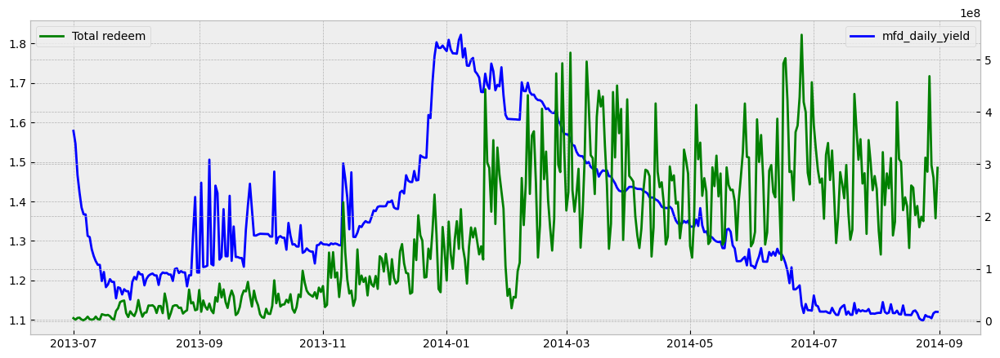

In [60]:
# Draw a time series diagram of Alipay interest rate and redemption amount

fig,ax1 = plt.subplots(figsize=(15,5))
for i in share_features:
    plt.plot(share['date'], share[i],'b',label=i)
    break
plt.legend()
ax2=ax1.twinx()
plt.plot(total_balance['date'], total_balance['total_redeem_amt'],'g',label="Total redeem")
plt.legend(loc=2)
plt.show()

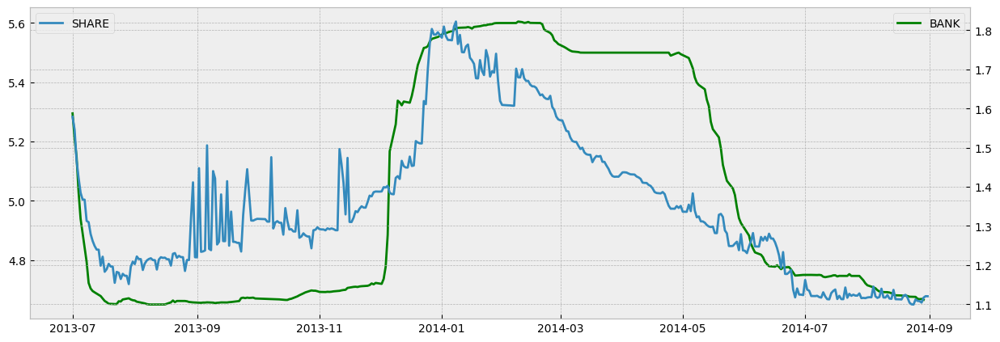

In [61]:
# Draw a time series diagram of bank interest rates and Alipay interest rates

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(bank['date'], bank['Interest_3_M'],c='g',label= 'BANK')

plt.legend()
ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],label='SHARE')
plt.legend(loc=2)
plt.show()

<br> As can be seen from the figure
* Alipay interest rate seems to have a greater impact on the purchase amount
* Bank interest rate seems to have a greater impact on the redemption amount
* The impact of Alipay interest rate is temporary
* The impact of bank interest rate is long-term

<br> Based on the above analysis, we can find the following characteristics:
* Which day of the week
* Is it a weekend
* Is it a holiday
* How long until Monday
* How long until the weekend
* How long until the holiday peak
* Time from the beginning of the month
* Time from the end of the month
* Weekly average, maximum, and minimum values ​​of the last few months
* Transaction volume on the last day of each month

# step2:Feature analysis

Note: All the amounts here are in cents. For example, if a user buys 1 million on a certain day, it means that he has purchased 10,000

## 2.1) Analysis of large and small amount users
As can be seen from the previous analysis, some users have large transaction amounts, which is very obvious for daily transaction volume. Here we count the large amount users (greater than 1 million) who are still active after April.

In [64]:
# Get a collection of big users

temp = balance_data[(balance_data['total_purchase_amt'] >= 1000000) | (balance_data['total_redeem_amt'] >= 1000000)]
big_users_set = set(temp[temp['date'] >= datetime.datetime(2014,4,1)]['user_id'])

In [65]:
len(big_users_set)

3903

In [66]:
balance_data['user_id'].nunique()

28041

There are 3,903 large users, accounting for 13% of the total

In [67]:
# Marking big users

balance_data['big_user'] = 0
balance_data.loc[balance_data['user_id'].isin(big_users_set), 'big_user'] = 1

In [68]:
# Count the difference between the total daily transaction amount of big and small users
total_balance_bigNsmall = balance_data.groupby(['date','big_user'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

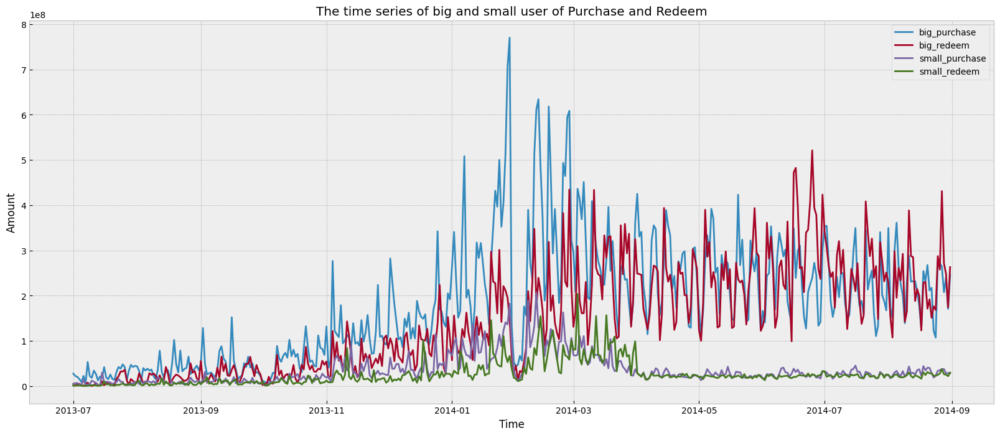

In [69]:
# Draw a graph of the total daily transaction volume of big and small users

fig = plt.figure(figsize=(20,8))
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_purchase_amt'],label='big_purchase')
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_redeem_amt'],label='big_redeem')

plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_purchase_amt'],label='small_purchase')
plt.plot(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['date'], total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_redeem_amt'],label='small_redeem')
plt.legend(loc='best')
plt.title("The time series of big and small user of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [70]:
# Statistics on the proportion of big and small user purchases

np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_purchase_amt']) / np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_purchase_amt'])

5.1456178397775805

In [71]:
# Statistics on the proportion of redemption by big and small users

np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 1]['total_redeem_amt']) / np.sum(total_balance_bigNsmall[total_balance_bigNsmall['big_user'] == 0]['total_redeem_amt'])

5.422141272341089

## 2.2)Analyze the user's transaction frequency

In [72]:
balance_data[balance_data['user_id']==1].sort_values('report_date').head(5)

,user_id,report_date,tBalance,yBalance,total_purchase_amt,direct_purchase_amt,purchase_bal_amt,purchase_bank_amt,total_redeem_amt,consume_amt,transfer_amt,tftobal_amt,tftocard_amt,share_amt,category1,category2,category3,category4,date,day,month,year,week,weekday,big_purchase,big_redeem,big_user
93,1,20140320,20111,0,20111,20111,0,20111,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2014-03-20,20,3,2014,12,3,0,0,0
59,1,20140321,20111,20111,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2014-03-21,21,3,2014,12,4,0,0,0
36,1,20140322,20113,20111,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-22,22,3,2014,12,5,0,0,0
94,1,20140323,20115,20113,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-23,23,3,2014,12,6,0,0,0
60,1,20140324,20117,20115,2,0,0,0,0,0,0,0,0,2,NaN,NaN,NaN,NaN,2014-03-24,24,3,2014,13,0,0,0,0


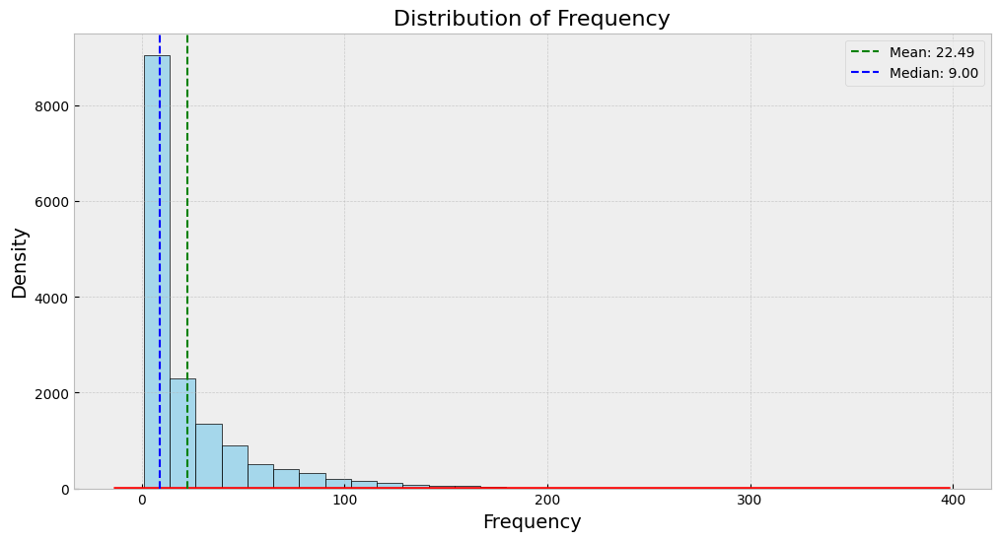

In [73]:
# Draw a distribution chart of non-zero transactions

# Calculate frequency
frequency = balance_data[(balance_data['direct_purchase_amt'] != 0) | (balance_data['total_redeem_amt'] != 0)][['user_id','tBalance']].groupby('user_id', as_index=False).count().rename({'tBalance':'freq'}, axis=1)

# Create a canvas
plt.figure(figsize=(12, 6))

# Draw a histogram and a kernel density plot
sns.histplot(frequency['freq'], kde=False, color='skyblue', bins=30, edgecolor='k', alpha=0.7)
sns.kdeplot(frequency['freq'], color='red', linewidth=2)

# Add graphic elements
plt.title('Distribution of Frequency', fontsize=16)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.axvline(frequency['freq'].mean(), color='green', linestyle='--', linewidth=1.5, label=f'Mean: {frequency["freq"].mean():.2f}')
plt.axvline(frequency['freq'].median(), color='blue', linestyle='--', linewidth=1.5, label=f'Median: {frequency["freq"].median():.2f}')
plt.legend()

# Display Graphics
plt.show()

In [74]:
# Get a collection of frequent transaction users

hot_users_set = set(frequency[frequency['freq'] > 30]['user_id'])

In [75]:
# Get transaction records of frequent users

balance_data['is_hot_users'] = 0
balance_data.loc[balance_data['user_id'].isin(hot_users_set) , 'is_hot_users'] = 1

In [76]:
# Count the difference in total daily transaction volume between frequent users and infrequent users

total_balance_hotNcold = balance_data.groupby(['date','is_hot_users'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

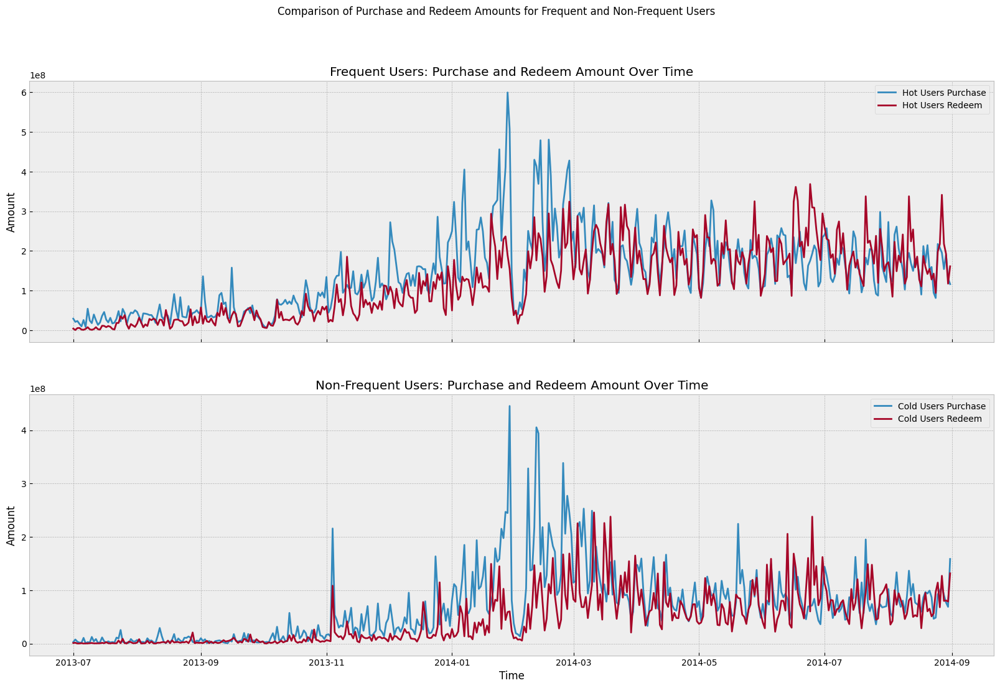

In [77]:
# Draw a time series diagram of the total purchase and redemption volume of frequent users and infrequent users

# Creating a subgraph
fig, axs = plt.subplots(2, 1, figsize=(20, 12), sharex=True)

# Plotting total purchases and redemptions for frequent users
axs[0].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['total_purchase_amt'], label='Hot Users Purchase')
axs[0].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 1]['total_redeem_amt'], label='Hot Users Redeem')
axs[0].legend(loc='best')
axs[0].set_title("Frequent Users: Purchase and Redeem Amount Over Time")
axs[0].set_ylabel("Amount")

# Plotting total purchases and redemptions for infrequent users
axs[1].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['total_purchase_amt'], label='Cold Users Purchase')
axs[1].plot(total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['date'],
            total_balance_hotNcold[total_balance_hotNcold['is_hot_users'] == 0]['total_redeem_amt'], label='Cold Users Redeem')
axs[1].legend(loc='best')
axs[1].set_title("Non-Frequent Users: Purchase and Redeem Amount Over Time")
axs[1].set_xlabel("Time")
axs[1].set_ylabel("Amount")

plt.suptitle("Comparison of Purchase and Redeem Amounts for Frequent and Non-Frequent Users")
plt.show()

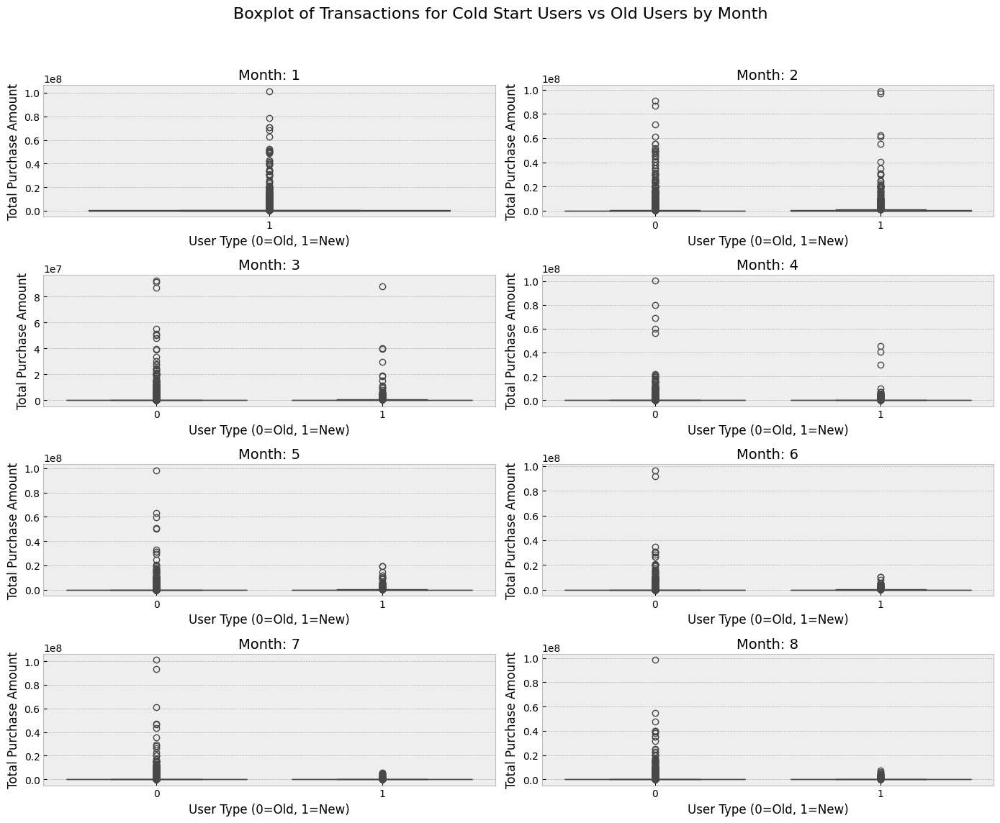

In [78]:
# Draw a box plot of transactions between cold start users and old users
# Preprocess data
temp = balance_data[['year', 'month', 'user_id', 'total_purchase_amt', 'total_redeem_amt']].groupby(['year', 'month', 'user_id'], as_index=False).sum()
user_old_set = set()

# Create a plot
plt.figure(figsize=(14, 12))

for i in range(1, 9):
    # Data for the current month
    newset = set(temp[(temp['year'] == 2014) & (temp['month'] == i)]['user_id'])
    this_month = balance_data[(balance_data['year'] == 2014) & (balance_data['month'] == i)]
    this_month['cold'] = 0
    this_month.loc[this_month['user_id'].isin(newset - user_old_set), 'cold'] = 1

    # Create subgraph
    ax = plt.subplot(4, 2, i)
    sns.boxplot(x="cold", y="total_purchase_amt", data=this_month[(this_month['direct_purchase_amt'] != 0) | (this_month['total_redeem_amt'] != 0)], ax=ax)

    # Set subgraph title and label
    ax.set_title(f'Month: {i}', fontsize=14)
    ax.set_xlabel('User Type (0=Old, 1=New)', fontsize=12)
    ax.set_ylabel('Total Purchase Amount', fontsize=12)

    # Update old user collection
    user_old_set = user_old_set | newset

# Main title
plt.suptitle('Boxplot of Transactions for Cold Start Users vs Old Users by Month', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## 2.3)Analyze other attributes of users

In [79]:
# Other properties of the user
users = load_from_drive('1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI', info = False)
users.head()

Downloading...
From: https://drive.google.com/uc?id=1wPen9jGqP1nNVsdYeRNh3sHDoRXpSSaI
To: /content/downloaded_file.csv
100%|██████████| 746k/746k [00:00<00:00, 68.4MB/s]


,user_id,sex,city,constellation
0,2,1,6411949,狮子座
1,12,1,6412149,摩羯座
2,22,1,6411949,双子座
3,23,1,6411949,双鱼座
4,25,1,6481949,双鱼座


In [80]:
# Add city, constellation, gender

balance_data = pd.merge(balance_data, users, on='user_id')

In [81]:
# balance_data = balance_data.drop('sex_x	city_x constellation_x sex_y city_y constellation_y'.split(), axis=1)

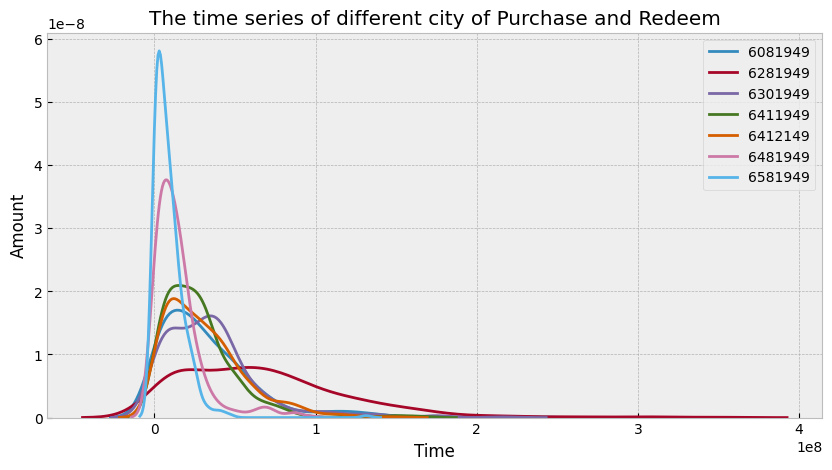

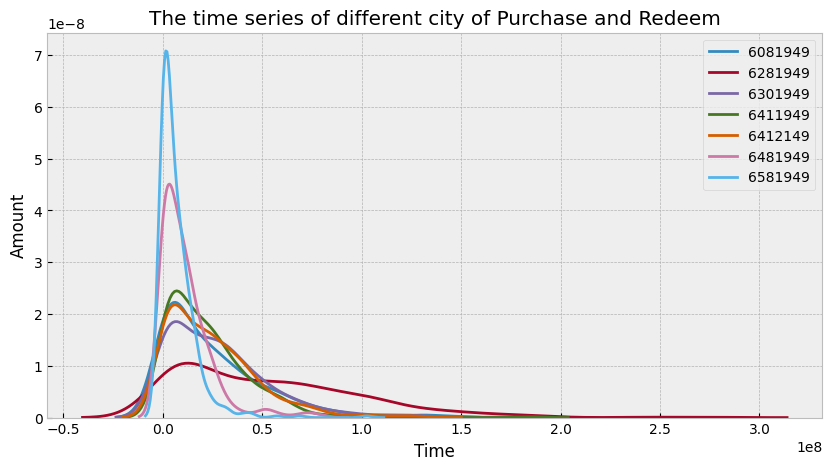

In [82]:
# Count the differences in the total daily transaction amount of users in each city and draw a distribution estimation chart

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['city']):
    temp = balance_data.groupby(['date','city'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['city'] == i]['total_purchase_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of different city of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['city']):
    temp = balance_data.groupby(['date','city'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['city'] == i]['total_redeem_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of different city of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

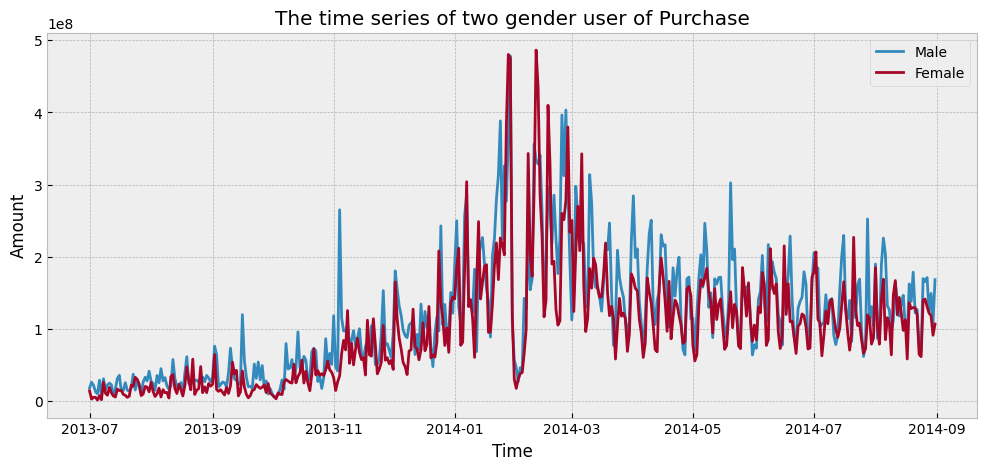

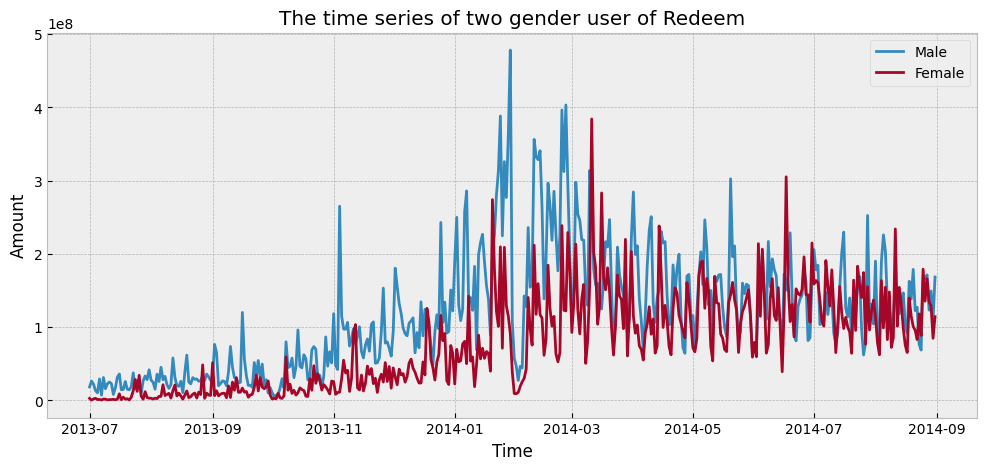

In [83]:
# Count the difference in daily total transaction amount of users of each gender and draw a time series graph

temp = balance_data.groupby(['date','sex'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()

fig = plt.figure(figsize=(12,5))
plt.plot(temp[temp['sex'] == 1]['date'], temp[temp['sex'] == 1]['total_purchase_amt'],label='Male')
plt.plot(temp[temp['sex'] == 0]['date'], temp[temp['sex'] == 0]['total_purchase_amt'],label='Female')
plt.legend(loc='best')
plt.title("The time series of two gender user of Purchase")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(12,5))
plt.plot(temp[temp['sex'] == 1]['date'], temp[temp['sex'] == 1]['total_purchase_amt'],label='Male')
plt.plot(temp[temp['sex'] == 0]['date'], temp[temp['sex'] == 0]['total_redeem_amt'],label='Female')
plt.legend(loc='best')
plt.title("The time series of two gender user of Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [84]:
# Change the Font to Chinese because there is Chinese Font in matplotlib

!wget -O TaipeiSansTCBeta-Regular.ttf https://drive.google.com/uc?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_&export=download

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.font_manager import fontManager

fontManager.addfont('TaipeiSansTCBeta-Regular.ttf')
mpl.rc('font', family='Taipei Sans TC Beta')

--2024-12-26 08:36:27--  https://drive.google.com/uc?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_
Resolving drive.google.com (drive.google.com)... 74.125.201.139, 74.125.201.138, 74.125.201.101, ...
Connecting to drive.google.com (drive.google.com)|74.125.201.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_ [following]
--2024-12-26 08:36:27--  https://drive.usercontent.google.com/download?id=1eGAsTN1HBpJAkeVM57_C7ccp7hbgSz3_
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 172.217.214.132, 2607:f8b0:4001:c05::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|172.217.214.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20659344 (20M) [application/octet-stream]
Saving to: ‘TaipeiSansTCBeta-Regular.ttf’

TaipeiSansTCBeta-Re 100%[===================>]  19.70M  57.0MB/s    in 0.3s    

2024-12-26 08:3

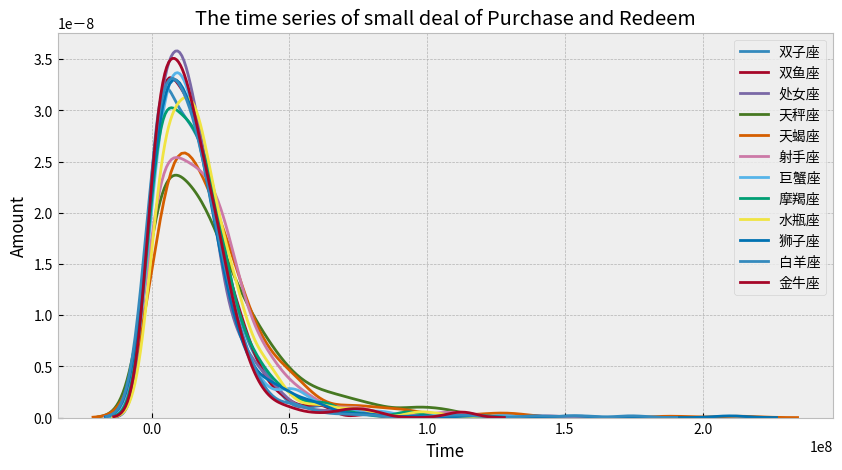

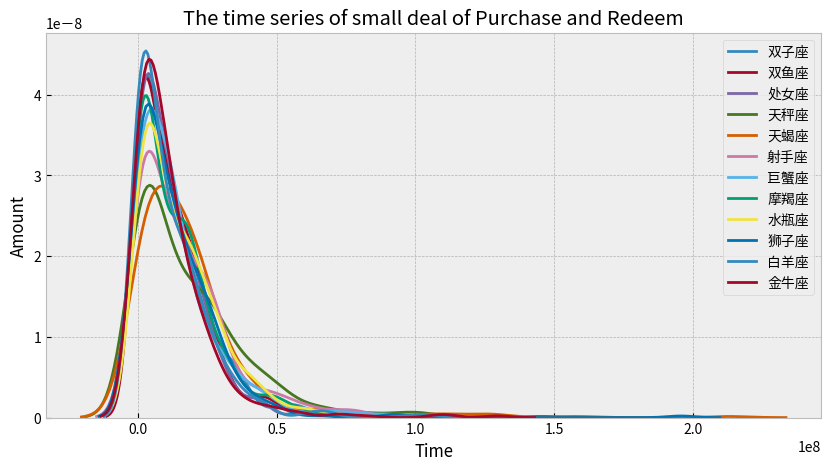

In [85]:
# Count the differences in the total daily transaction amount of users of each constellation and draw a distribution estimation chart

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['constellation']):
    temp = balance_data.groupby(['date','constellation'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['constellation'] == i]['total_purchase_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of small deal of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

fig = plt.figure(figsize=(10,5))
for i in np.unique(balance_data['constellation']):
    temp = balance_data.groupby(['date','constellation'], as_index=False)[['total_purchase_amt','total_redeem_amt']].sum()
    ax = sns.kdeplot( temp[temp['constellation'] == i]['total_redeem_amt'],label=i)
plt.legend(loc='best')
plt.title("The time series of small deal of Purchase and Redeem")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

## 2.4)Other analyses

In [86]:
temp = balance_data.groupby(['date'], as_index=False)[['direct_purchase_amt','share_amt']].sum()

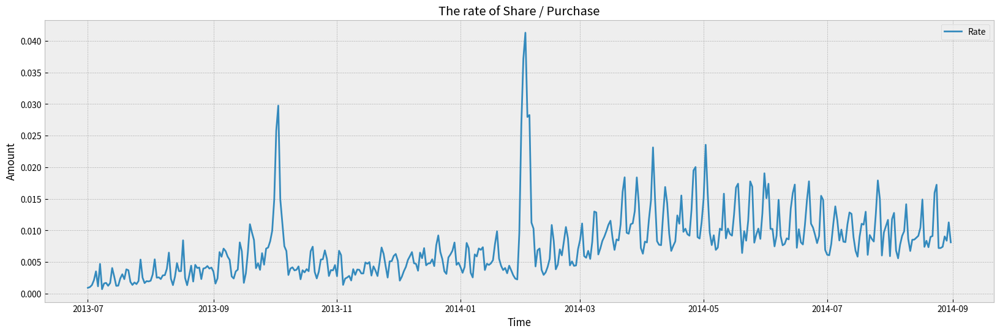

In [87]:
# Draw a time series chart of daily interest growth/direct purchase amount

fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'],  temp['share_amt'] / temp['direct_purchase_amt'] ,label='Rate')
plt.legend(loc='best')
plt.title("The rate of Share / Purchase")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

In [88]:
# Loading Alipay interest rate data

share = load_from_drive('1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI', info = False)
share = share.rename(columns = {'mfd_date': 'date'})
share_features = [x for x in share.columns if x not in ['date']]
share['date'] = pd.to_datetime(share['date'], format= "%Y%m%d")
share['day'] = share['date'].dt.day
share['month'] = share['date'].dt.month
share['year'] = share['date'].dt.year
share['week'] = share['date'].dt.isocalendar().week
share['weekday'] = share['date'].dt.weekday

Downloading...
From: https://drive.google.com/uc?id=1xhYZJQUeDOraNLyr3eNSIB-u5yfyGNqI
To: /content/downloaded_file.csv
100%|██████████| 9.76k/9.76k [00:00<00:00, 19.2MB/s]


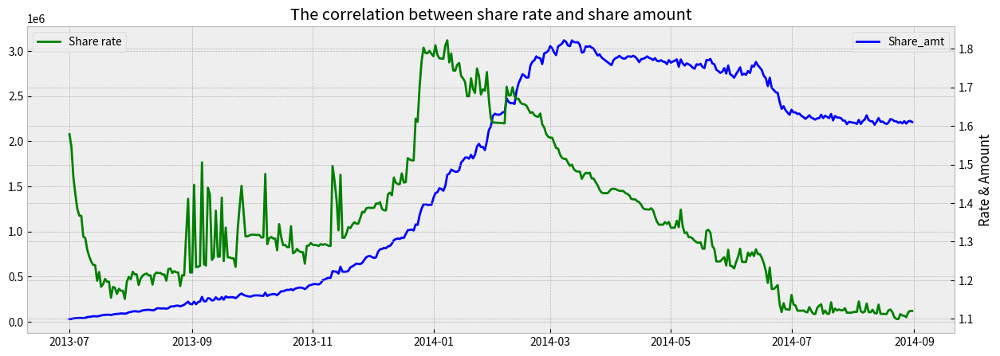

In [89]:
# Draw a time series diagram of Alipay interest rate and transaction amount

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(temp['date'], temp['share_amt'],'b',label="Share_amt")
plt.legend()

ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],'g',label="Share rate")

plt.legend(loc=2)
plt.title("The correlation between share rate and share amount")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

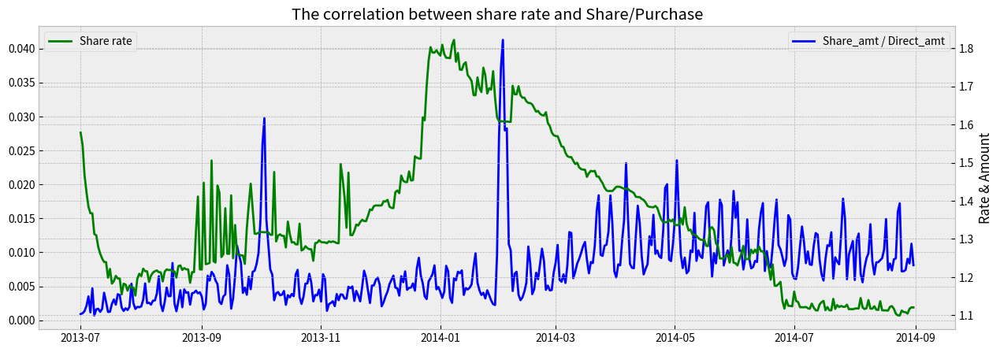

In [90]:
# Alipay interest rate and daily interest growth/direct purchase volume time series chart

fig,ax1 = plt.subplots(figsize=(15,5))
plt.plot(temp['date'], temp['share_amt'] / temp['direct_purchase_amt'],'b',label="Share_amt / Direct_amt")
plt.legend()

ax2=ax1.twinx()
plt.plot(share['date'], share['mfd_daily_yield'],'g',label="Share rate")

plt.legend(loc=2)
plt.title("The correlation between share rate and Share/Purchase")
plt.xlabel("Time")
plt.ylabel("Rate & Amount")

plt.show()

In [91]:
# Aggregate two different purchasing methods

temp = balance_data.groupby(['date'], as_index=False)[['purchase_bal_amt','purchase_bank_amt']].sum()

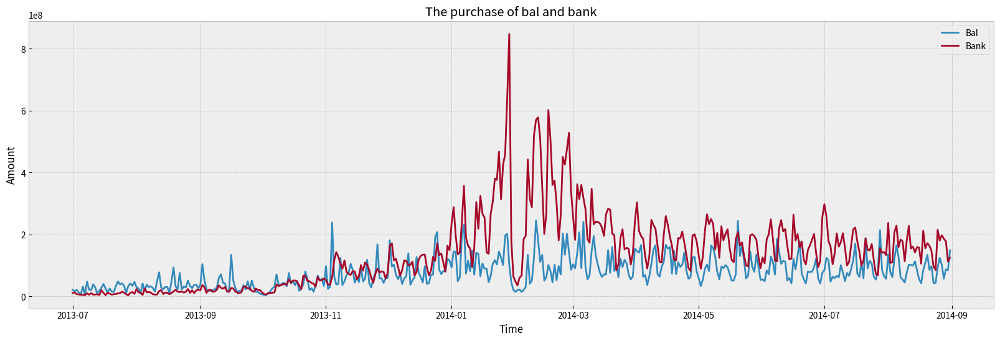

In [92]:

# Draw a time series diagram of daily purchase volume for different purchase methods

fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'], temp['purchase_bal_amt'],label='Bal')
plt.plot(temp['date'], temp['purchase_bank_amt'],label='Bank')
plt.legend(loc='best')
plt.title("The purchase of bal and bank")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

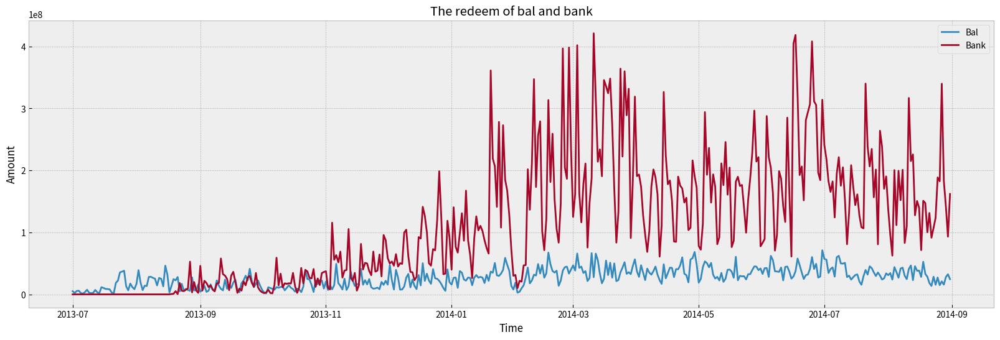

In [93]:
# Draw a time series diagram of daily redemption volume for different redemption methods

temp = balance_data.groupby(['date'], as_index=False)[['tftobal_amt','tftocard_amt']].sum()
fig = plt.figure(figsize=(20,6))
plt.plot(temp['date'], temp['tftobal_amt'],label='Bal')
plt.plot(temp['date'], temp['tftocard_amt'],label='Bank')
plt.legend(loc='best')
plt.title("The redeem of bal and bank")
plt.xlabel("Time")
plt.ylabel("Amount")
plt.show()

Although there is not much difference between buying with Alipay or bank card, the difference in redeem is quite obvious.

# step3: time series rules

# Cycle factor model

&emsp;&emsp;Since the time series data of Yu'ebao shows strong cyclical characteristics, this project adopts the cycle factor model.
* Calculate the cycle factors
* Calculate the base
* Prediction = base*factors

## About the Cycle Factor Model

Quick Introduction to the Basic Rule Method
&emsp;&emsp;Suppose given the following data, the task is to predict the daily passenger flow in the fourth week.

| Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday | Weekly average |
| :- | :- | :- | :- | :- | :- | :- | :- |
| Week 1 | 20 | 10 | 70 | 50 | 250 | 200 | 100 | 100 |
| Week 2 | 26 | 18 | 66 | 50 | 180 | 140 | 80 | 80 |
| Week 3 | 15 | 8 | 67 | 60 | 270 | 160 | 120 | 100 |

&emsp;&emsp;It is obvious to see the periodic fluctuation from Monday to Sunday. The core task of prediction is to extract this period as accurately as possible.

&emsp;&emsp;The first step: Divide by the weekly average to get a ratio.
&emsp;&emsp;The second step: Take the median by column.
&emsp;&emsp;You can get a set of robust periodic factors.

| Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| :- | :- | :- | :- | :- | :- | :- |
| Week 1 | 0.2 | 0.1 | 0.7 | 0.5 | 2.5 | 2 | 1 |
| Week 2 | 0.325 | 0.225 | 0.825 | 0.625 | 2.25 | 1.75 | 1 |
| Week 3 | 0.15 | 0.08 | 0.67 | 0.6 | 2.7 | 1.6 | 1.2 |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |

&emsp;&emsp;When making a forecast, just multiply the period factor by a base to make a forecast for the next week. For example, if we take the average passenger flow of the last week as 100 as the base, then we directly multiply it by the period factor to get the forecast for the next week:

| Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| :- | :- | :- | :- | :- | :- | :- |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |
| Forecast (base=100) | 20 | 10 | 70 | 60 | 250 | 175 | 100 |

&emsp;&emsp;Here we only take three weeks as an example. Of course, a longer period is required for actual application. The specific number of weeks is determined by the performance of the test set.

&emsp;&emsp;Optimization of periodic factors
&emsp;&emsp;Extracting the median by column is a simple and effective way to extract periodic factors. The median is very robust and is not affected by extreme values. But the median loses a lot of information. In practice, we can further optimize on this basis. For example, we can extract a mean and a median, and then fuse the mean and the median. The fusion ratio is determined according to the performance of the test set. Different weights can also be assigned according to the time distance from the predicted week.

&emsp;&emsp;Optimization of base
&emsp;&emsp;Directly using the average passenger flow of the last week as the base is not necessarily the best method. Perhaps the average of the last three days or the last five days can better reflect the latest situation. However, we cannot directly take the average of the passenger flow of the last three days (the last three days are weekends, so the base is too large). We need to remove the periodic factors and then take the average. Specifically, we divide the passenger flow by the cycle factor.

| Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| :- | :- | :- | :- | :- | :- | :- |
| Week 3 | 15 | 8 | 67 | 60 | 270 | 160 | 120 |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |
| Passenger flow after the cycle | 75 | 80 | 95.7 | 100 | 108 | 91.4 | 120 |

&emsp;&emsp;In this way, we can take the average of the last three days, (108+91.4+120)/3=106.5, as the base. The specific number of days to take should also be determined by the performance of the test set. Of course, different weights can also be assigned to each day in the form of certain functions.

# References

## Basic rule method quick start

Suppose given the following data, the task is to predict the passenger flow of each day in the fourth week.

| | Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday | Weekly average |
| ------ | ---- | ---- | ---- | ---- | ---- | ---- | ---- | ------ |
| Week 1 | 20 | 10 | 70 | 50 | 250 | 200 | 100 | 100 |
| Week 2 | 26 | 18 | 66 | 50 | 180 | 140 | 80 | 80 |
| Week 3 | 15 | 8 | 67 | 60 | 270 | 160 | 120 | 100 |

It is obvious that there is a periodic fluctuation from Monday to Sunday. The core task of prediction is to extract this period as accurately as possible.
**Step 1**: Divide by the weekly average to get a ratio.
**Step 2**: Take the median by column.
You can get a set of robust period factors.

| | Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| ------ | ----- | ----- | ----- | ---- | ---- | ---- |
| Week 1 | 0.2 | 0.1 | 0.7 | 0.5 | 2.5 | 2 | 1 |
| Week 2 | 0.325 | 0.225 | 0.825 | 0.625 | 2.25 | 1.75 | 1 |
| Week 3 | 0.15 | 0.08 | 0.67 | 0.6 | 2.7 | 1.6 | 1.2 |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |

When making a prediction, just multiply the period factor by a base to make a prediction for the next week. For example, if we take the average passenger flow of the last week as 100 as the base, then we directly multiply it by the period factor to get the prediction for the next week:

| | Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| --------------- | ---- | ---- | ---- | ---- | ---- | ---- | ---- |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |
| Prediction (base=100) | 20 | 10 | 70 | 60 | 250 | 175 | 100 |

Here we only take three weeks as an example. Of course, a longer period is required for actual application. The specific number of weeks is determined by the effect of the test set.

### Optimization for periodic factors

Extracting the median by column is a simple and effective way to extract periodic factors. The median is very robust and is not affected by extreme values. But the median loses a lot of information. In practice, it can be further optimized on this basis. For example, a mean and a median can be extracted, and then the mean and median can be fused. The fusion ratio is determined according to the performance of the test set. Different weights can also be assigned according to the time distance from the predicted week.

### Optimization for base

Directly using the average passenger flow of the last week as the base is not necessarily the best method. Perhaps the average of the last three days or the last five days can better reflect the latest situation. However, we cannot directly take the average of the passenger flow of the last three days (the last three days are weekends, so the base is too large). It is necessary to remove the periodic factors and then take the average. The specific method is to divide the passenger flow by the periodic factor.

| | Monday | Tuesday | Wednesday | Thursday | Friday | Saturday | Sunday |
| ------------------ | ---- | ---- | ---- | ---- | ---- | ---- | ---- |
| Week 3 | 15 | 8 | 67 | 60 | 270 | 160 | 120 |
| Median | 0.2 | 0.1 | 0.7 | 0.6 | 2.5 | 1.75 | 1 |
| Customer flow after the period | 75 | 80 | 95.7 | 100 | 108 | 91.4 | 120 |

So we can take the average of the last three days, (108+91.4+120)/3=106.5, as the base. The specific number of days to take should also be determined by the performance of the test set. Of course, different weights can also be assigned to each day according to certain functional forms.

In [94]:
# Loading data

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = '2014-03-01')
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=334fc384-b0a2-4ac7-8f54-8df7865129fc
To: /content/downloaded_file.csv
100%|██████████| 158M/158M [00:01<00:00, 151MB/s]


In [95]:
# Create a deep copy of the data

data = total_balance.copy()
data

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2
...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4
210,2014-09-27,NaN,NaN,27,9,2014,39,5
211,2014-09-28,NaN,NaN,28,9,2014,39,6
212,2014-09-29,NaN,NaN,29,9,2014,40,0


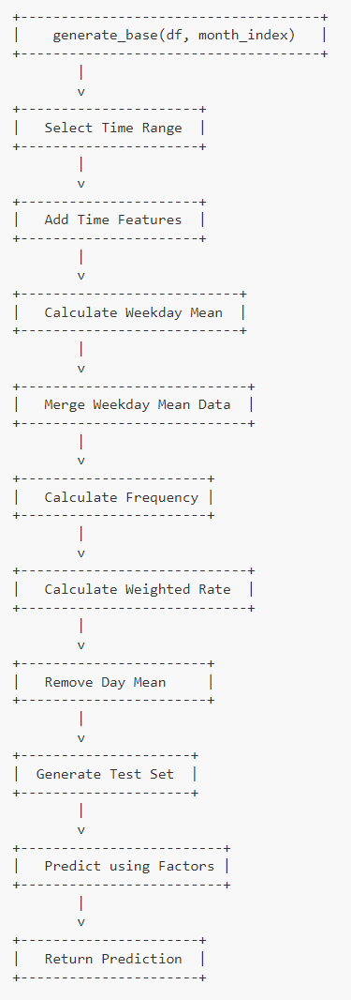


"Next-Day Factor" refers to the prediction of the value change at a certain point in the future based on certain features in the historical data in time series forecasting. In this context, the Next-Day Factor refers to the prediction of the value change at the next point in time (i.e. the next day) based on certain features in the historical data (such as the day of the week, date, etc.).

**Link and process**:

1. **Data screening and processing**:

  - Filter out the data from "2014-03-01" to a specific "month_index". Here, "month_index" represents a specified month index, which is used to select data in a specific time period.

  **Result**: Only the data from "2014-03-01" to a specific month is retained in the data frame.

2. **Add timestamp**:

  - Add various time features, including day of the week, date, week number, and month.

  **Result**: The columns "weekday", "day", "week", and "month" are added to the data frame.

3. **Calculate the next day factor**:

  - Calculate the average purchase amount and redemption amount for each day of the week, and divide these means by the mean of the total purchase and redemption amounts to obtain the next day factor.

  **Result**: The `mean_of_each_weekday` data frame contains the average purchase and redemption amount for each day of the week and the calculated purchase and redemption next day factors.

4. **Merge statistical results into the original dataset**:

  - Merge the next day factors into the original dataset for subsequent calculations.

  **Result**: The purchase and redemption next day factor columns are added to the original data frame.

5. **Count the frequency of the next day appearing on (1~31) days**:

  - Count the frequency of each date appearing on a certain day of the week, and the corresponding next day factor.

  **Result**: The `weekday_count` data frame contains the frequency of each date appearing on a certain day of the week, and the purchase and redemption next day factors calculated based on the frequency of the day of the week.

6. **Weight the next day factors according to the frequency to obtain the date factor**:

  - Weight the purchase and redemption next day factors according to the frequency of each date to obtain the date factor.

  **Result**: The `day_rate` data frame contains the purchase and redemption date factors for each date.

7. **Get base by removing the date residual from the mean of all dates in the training set**:

  - Calculate the purchase and redemption mean for each date, and then combine the weighted date factor with the mean to obtain the adjusted baseline value.

  **Result**: The `day_pre` data frame contains the purchase and redemption baseline values ​​for each date.

8. **Generate test data**:

  - Generate test data based on month, day and base value.

  **Result**: The generated test data contains date, purchase and redemption base values.

9. **Get the final prediction result based on base and next day factor**:

  - Combine the test data with the next day factor, calculate the purchase and redemption amount again, and finally get the prediction result.

  **Result**: The `day_pre` data frame is recalculated, and the purchase and redemption amount are adjusted according to the purchase and redemption next day factors to get the final prediction result.

In [96]:


# Define the method to generate time series rule prediction results
def generate_base(df: pd.DataFrame, month_index: int) -> pd.DataFrame:
    # Select a data set for a fixed time period
    total_balance = df.copy()  # Copy the incoming DataFrame to avoid modifying the original data
    total_balance = total_balance[['date', 'total_purchase_amt', 'total_redeem_amt']]  # Select data from a specific column
    total_balance = total_balance[(total_balance['date'] >= pd.to_datetime('2014/3/1')) & (total_balance['date'] < pd.to_datetime('2014/{}/1'.format(month_index)))]  # Filter data for a specific time period

    # Add timestamp
    total_balance['weekday'] = total_balance['date'].dt.weekday  # Add day of the week information
    total_balance['day'] = total_balance['date'].dt.day          # Add date information
    total_balance['week'] = total_balance['date'].dt.isocalendar().week      # Add week information
    total_balance['month'] = total_balance['date'].dt.month      # Add month information

    # Count next day factor
    mean_of_each_weekday = total_balance[['weekday'] + ['total_purchase_amt', 'total_redeem_amt']].groupby('weekday', as_index=False).mean()  # Count the average purchase and redemption amounts for each day of the week
    for name in ['total_purchase_amt', 'total_redeem_amt']:
        mean_of_each_weekday = mean_of_each_weekday.rename(columns={name: name+'_weekdaymean'})  # Add suffix to statistical results to distinguish next day factors
    mean_of_each_weekday['total_purchase_amt_weekdaymean'] /= np.mean(total_balance['total_purchase_amt'])  # Calculate the next day factor of the purchase amount
    mean_of_each_weekday['total_redeem_amt_weekdaymean'] /= np.mean(total_balance['total_redeem_amt'])    # Calculate the next day factor of the redemption amount

    # Merge statistical results into the original data set
    total_balance = pd.merge(total_balance, mean_of_each_weekday, on='weekday', how='left')  # Merge the next day factor into the original data set
    # print(total_balance)


    # Count the frequency of occurrences on the next day (1~31)
    weekday_count = total_balance[['day', 'weekday', 'date']].groupby(['day', 'weekday'], as_index=False).count()  # Count the number of times each date appears on which day of the week
    weekday_count = pd.merge(weekday_count, mean_of_each_weekday, on='weekday')  # Combined statistical results and next day factors

    # Weight the next day factor according to the frequency to obtain the date factor
    weekday_count['total_purchase_amt_weekdaymean'] *= weekday_count['date'] / len(np.unique(total_balance['month']))  # Calculate the date factor of the purchase amount based on frequency weighting
    weekday_count['total_redeem_amt_weekdaymean'] *= weekday_count['date'] / len(np.unique(total_balance['month']))    # Date factor for calculating redemption amount based on frequency weighting
    day_rate = weekday_count.drop(['weekday', 'date'], axis=1).groupby('day', as_index=False).sum()  # Calculate the sum of the weighting factors for each date

    # The base is obtained by removing the date residual from the mean of all dates in the training set.
    day_mean = total_balance[['day'] + ['total_purchase_amt', 'total_redeem_amt']].groupby('day', as_index=False).mean()  # Calculate the mean of purchases and redemptions for each date
    day_pre = pd.merge(day_mean, day_rate, on='day', how='left')  # Incorporate the weighting factor into the mean for each date
    day_pre['total_purchase_amt'] /= day_pre['total_purchase_amt_weekdaymean']  # Divide the purchase amount by the purchase next day factor
    day_pre['total_redeem_amt'] /= day_pre['total_redeem_amt_weekdaymean']        # Divide the redemption amount by the redemption day factor

    # Generate test set data
    for index, row in day_pre.iterrows():
        if month_index in (2, 4, 6, 9) and row['day'] == 31:
            break
        day_pre.loc[index, 'date'] = datetime.datetime(2014, month_index, int(row['day']), 0, 0, 0)  # Generate test set date based on month and day

    # Get the final forecast result based on base and next day factors
    day_pre['weekday'] = day_pre['date'].dt.weekday  # Add day of week information
    day_pre = day_pre[['date', 'weekday'] + ['total_purchase_amt', 'total_redeem_amt']]  # Select the required columns
    day_pre = pd.merge(day_pre, mean_of_each_weekday, on='weekday')  # Combined Next Day Factor
    day_pre['total_purchase_amt'] *= day_pre['total_purchase_amt_weekdaymean']  # Adjust the purchase amount based on the next day factor
    day_pre['total_redeem_amt'] *= day_pre['total_redeem_amt_weekdaymean']        # Adjust the redemption amount based on the redemption day factor

    day_pre = day_pre.sort_values('date')[['date'] + ['total_purchase_amt', 'total_redeem_amt']]  # Sort by date and select the required columns
    return day_pre  # Returns the generated time series forecast result DataFrame

In [97]:
# Generate predictions (and residuals)

base_list = []
for i in range(4, 10):
    base_list.append(generate_base(data, i).reset_index(drop=True))

base = pd.concat(base_list).reset_index(drop=True)

In [98]:
for i in ['total_purchase_amt','total_redeem_amt']:
    base = base.rename(columns={i: i+'_base'})

In [99]:
base_res = pd.merge(data.reset_index(drop=True), base.reset_index(drop=True), on='date', how='left').reset_index(drop=True)
base_res

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday,total_purchase_amt_base,total_redeem_amt_base
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5,NaN,NaN
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6,NaN,NaN
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0,NaN,NaN
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1,NaN,NaN
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4,221701520.1815,306329996.0163
210,2014-09-27,NaN,NaN,27,9,2014,39,5,173675867.5541,218142847.5830
211,2014-09-28,NaN,NaN,28,9,2014,39,6,180985508.4888,249228870.4353
212,2014-09-29,NaN,NaN,29,9,2014,40,0,295381730.1155,351559762.6468


In [100]:
base_res['purchase_residual'] = base_res['total_purchase_amt'] / base_res['total_purchase_amt_base']
base_res['redeem_residual'] = base_res['total_redeem_amt'] / base_res['total_redeem_amt_base']

In [101]:
base_res

,date,total_purchase_amt,total_redeem_amt,day,month,year,week,weekday,total_purchase_amt_base,total_redeem_amt_base,purchase_residual,redeem_residual
0,2014-03-01,362865580.0000,211279011.0000,1,3,2014,9,5,NaN,NaN,NaN,NaN
1,2014-03-02,276202230.0000,246199417.0000,2,3,2014,9,6,NaN,NaN,NaN,NaN
2,2014-03-03,505305862.0000,513017360.0000,3,3,2014,10,0,NaN,NaN,NaN,NaN
3,2014-03-04,524146340.0000,250562978.0000,4,3,2014,10,1,NaN,NaN,NaN,NaN
4,2014-03-05,454295491.0000,209072753.0000,5,3,2014,10,2,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
209,2014-09-26,NaN,NaN,26,9,2014,39,4,221701520.1815,306329996.0163,NaN,NaN
210,2014-09-27,NaN,NaN,27,9,2014,39,5,173675867.5541,218142847.5830,NaN,NaN
211,2014-09-28,NaN,NaN,28,9,2014,39,6,180985508.4888,249228870.4353,NaN,NaN
212,2014-09-29,NaN,NaN,29,9,2014,40,0,295381730.1155,351559762.6468,NaN,NaN


In [ ]:
# Rename the result table

base_res = base_res[['date','total_purchase_amt','total_redeem_amt','purchase_residual','redeem_residual','total_purchase_amt_base', 'total_redeem_amt_base']]
for i in base_res.columns:
    if i == 'date':
        base_res[i] = base_res[i].astype(str)
        base_res[i] = base_res[i].str.replace('-','')

In [102]:
from collections.abc import Iterable

# Split the dataset
def split_data_underline(data):
    data['date'] = pd.to_datetime(data['date'])
    trainset = data[(datetime.datetime(2014, 4, 1) <= data['date']) & (data['date'] < datetime.datetime(2014, 8, 1))]
    testset = data[(datetime.datetime(2014, 8, 1) <= data['date']) & (data['date'] < datetime.datetime(2014, 9, 1))]
    return trainset, testset

trainset, testset = split_data_underline(base_res)

# Defining the evaluation function
def AE(y: Iterable, yhat: Iterable) -> Iterable:
    return np.abs(y - yhat) / np.abs(y)

def total_AE(purchasehat: Iterable, redeemhat: Iterable, purchase: Iterable, redeem: Iterable, h: float = 0.3) -> float:
    purchase_score = sum(np.exp(-AE(purchase, purchasehat) / h) * 10)
    redeem_score = sum(np.exp(-AE(redeem, redeemhat) / h) * 10)
    return purchase_score * 0.45 + redeem_score * 0.55

# Calculate the score on the test set
score = total_AE(
    testset['total_purchase_amt'],
    testset['total_redeem_amt'],
    testset['total_purchase_amt_base'],
    testset['total_redeem_amt_base']
)

print("Score on the test set:", score)


Score on the test set: 186.60893633571055


# step4:Feature Engineering

In [103]:
# For later operations, set the global index variable

labels = ['total_purchase_amt','total_redeem_amt']
date_indexs = ['week','year','month','weekday','day']

In [104]:
# Reading the dataset

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = '2014-03-01')
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=eb435df7-f171-4b92-8702-b12cfdf44891
To: /content/downloaded_file.csv
100%|██████████| 158M/158M [00:00<00:00, 207MB/s]


# Feature extraction

There are three main methods for time series prediction at present

- The first is the traditional time series prediction method, with typical representatives being ARIMA and exponential smoothing

- The second is a method based on machine learning, with lightgbm and xgboost being the most commonly used

- The third is a method based on deep learning, such as RNN, LSTM, etc.

The prediction accuracy of traditional time series prediction methods is now inferior to that of methods based on machine learning and deep learning, but the latter relies on feature engineering, and if the features are well tuned, they can achieve very high prediction accuracy

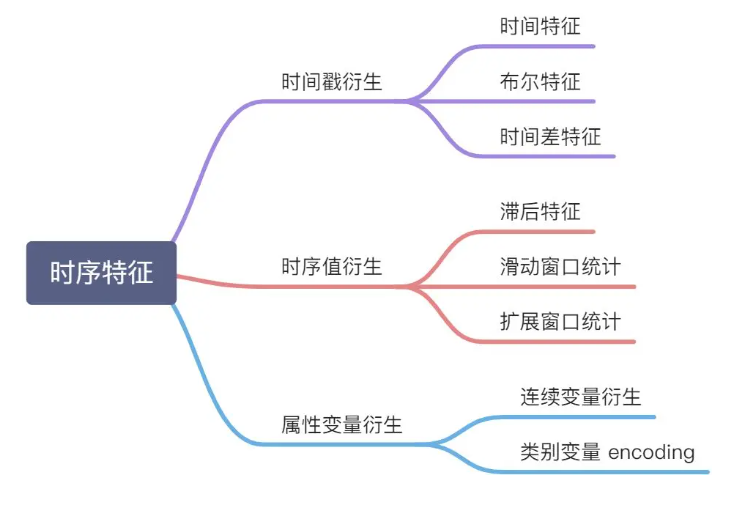



## 一、Date-based static features

### 1.1 Extract is feature

Boolean feature

Is it the beginning/end of the year
Is it the beginning/end of the month
Is it the weekend
Is it a holiday
Is it a special date
Is it morning/noon/evening
...

In [105]:
# Get holiday collection

def get_holiday_set()->Set[datetime.date]:
    holiday_set = set()
    # Qingming Festival
    holiday_set = holiday_set | {datetime.date(2014,4,5), datetime.date(2014,4,6), datetime.date(2014,4,7)}
    # Labor Day
    holiday_set = holiday_set | {datetime.date(2014,5,1), datetime.date(2014,5,2), datetime.date(2014,5,3)}
    # Dragon Boat Festival
    holiday_set = holiday_set | {datetime.date(2014,5,31), datetime.date(2014,6,1), datetime.date(2014,6,2)}
    # Mid-Autumn Festival
    holiday_set = holiday_set | {datetime.date(2014,9,6), datetime.date(2014,9,7), datetime.date(2014,9,8)}
    # National Day
    holiday_set = holiday_set | {datetime.date(2014,10,1), datetime.date(2014,10,2), datetime.date(2014,10,3),\
                                 datetime.date(2014,10,4), datetime.date(2014,10,5), datetime.date(2014,10,6),\
                                datetime.date(2014,10,7)}
    # Mid-Autumn Festival
    holiday_set = holiday_set | {datetime.date(2013,9,19), datetime.date(2013,9,20), datetime.date(2013,9,21)}
    # National Day
    holiday_set = holiday_set | {datetime.date(2013,10,1), datetime.date(2013,10,2), datetime.date(2013,10,3),\
                                 datetime.date(2013,10,4), datetime.date(2013,10,5), datetime.date(2013,10,6),\
                                datetime.date(2013,10,7)}
    return holiday_set

In [106]:
# Extract all is features

def extract_is_feature(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy().reset_index(drop=True)

    # Is it Weekend?
    total_balance['is_weekend'] = 0
    total_balance.loc[total_balance['weekday'].isin((5,6)), 'is_weekend'] = 1
    # Is it holiday?
    total_balance['is_holiday'] = 0
    total_balance.loc[total_balance['date'].isin(get_holiday_set()), 'is_holiday'] = 1

    # Is it the first day of a holiday?
    last_day_flag = 0
    total_balance['is_firstday_of_holiday'] = 0
    for index, row in total_balance.iterrows():
        if last_day_flag == 0 and row['is_holiday'] == 1:
            total_balance.loc[index, 'is_firstday_of_holiday'] = 1
        last_day_flag = row['is_holiday']

    # Is it the last day of a holiday?
    total_balance['is_lastday_of_holiday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_holiday'] == 1 and total_balance.loc[index+1, 'is_holiday'] == 0:
             total_balance.loc[index, 'is_lastday_of_holiday'] = 1

    # Is it the first day of work after a holiday?
    total_balance['is_firstday_of_work'] = 0
    last_day_flag = 0
    for index, row in total_balance.iterrows():
        if last_day_flag == 1 and row['is_holiday'] == 0:
            total_balance.loc[index, 'is_firstday_of_work'] = 1
        last_day_flag = row['is_lastday_of_holiday']

    # is work?
    total_balance['is_work'] = 1
    total_balance.loc[(total_balance['is_holiday'] == 1) | (total_balance['is_weekend'] == 1), 'is_work'] = 0
    special_work_day_set = {datetime.date(2014,5,4), datetime.date(2014,9,28)}
    total_balance.loc[total_balance['date'].isin(special_work_day_set), 'is_work'] = 1

    # is gonna work tomorrow?
    total_balance['is_gonna_work_tomorrow'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['is_work'] == 0 and total_balance.loc[index+1, 'is_work'] == 1:
             total_balance.loc[index, 'is_gonna_work_tomorrow'] = 1

    # is worked yesterday?
    total_balance['is_worked_yestday'] = 0
    for index, row in total_balance.iterrows():
        if index <= 1:
            continue
        if total_balance.loc[index-1, 'is_work'] == 1:
             total_balance.loc[index, 'is_worked_yestday'] = 1

    # Is it the day before a holiday?
    total_balance['is_lastday_of_workday'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['is_holiday'] == 0 and total_balance.loc[index+1, 'is_holiday'] == 1:
             total_balance.loc[index, 'is_lastday_of_workday'] = 1

    # is work on Sunday?
    total_balance['is_work_on_sunday'] = 0
    for index, row in total_balance.iterrows():
        if index == len(total_balance)-1:
            break
        if row['weekday'] == 6 and row['is_work'] == 1:
             total_balance.loc[index, 'is_work_on_sunday'] = 1

    # Is it the first day of the month?
    total_balance['is_firstday_of_month'] = 0
    total_balance.loc[total_balance['day'] == 1, 'is_firstday_of_month'] = 1

    # Is it the second day of the month?
    total_balance['is_secday_of_month'] = 0
    total_balance.loc[total_balance['day'] == 2, 'is_secday_of_month'] = 1

    # Is it the beginning of the month?
    total_balance['is_premonth'] = 0
    total_balance.loc[total_balance['day'] <= 10, 'is_premonth'] = 1

    # Is it the middle of the month?
    total_balance['is_midmonth'] = 0
    total_balance.loc[(10 < total_balance['day']) & (total_balance['day'] <= 20), 'is_midmonth'] = 1

    # Is it the end of the month?
    total_balance['is_tailmonth'] = 0
    total_balance.loc[20 < total_balance['day'], 'is_tailmonth'] = 1

    # Is it the first week of every month?
    total_balance['is_first_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 1, 'is_first_week'] = 1

    # Is it the first week of every month?
    total_balance['is_second_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 2, 'is_second_week'] = 1

    # Is it the first week of every month?
    total_balance['is_third_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 3, 'is_third_week'] = 1

    # Is it the first week of every month?
    total_balance['is_fourth_week'] = 0
    total_balance.loc[total_balance['week'] % 4 == 0, 'is_fourth_week'] = 1

    return total_balance.reset_index(drop=True)

In [107]:
# Extract is features to the dataset

total_balance = extract_is_feature(total_balance)

In [108]:
# Encoding next day features
def encode_data(data: pd.DataFrame, feature_name: str = 'weekday', encoder=OneHotEncoder()) -> pd.DataFrame:
    """
    Perform one-hot encoding on the given DataFrame data and return the encoded DataFrame.

    Parameters:
    - data: pd.DataFrame, the dataset to be encoded.
    - feature_name: str, the feature name to be one-hot encoded, default is 'weekday'.
    - encoder: encoder object, default is OneHotEncoder().

    Returns:
    - pd.DataFrame, the encoded DataFrame.

    Raises:
    - No exception handling.
    """
    # Copying a Dataset
    total_balance = data.copy()

    # One-hot encode features using encoder
    week_feature = encoder.fit_transform(np.array(total_balance[feature_name]).reshape(-1, 1)).toarray()

    # Convert the encoded features into a DataFrame
    week_feature = pd.DataFrame(week_feature, columns=[feature_name + '_onehot_' + str(x) for x in range(len(week_feature[0]))])

    # Merge the encoded features with the original dataset
    featureWeekday = pd.concat([total_balance, week_feature], axis=1)

    # Returns the encoded DataFrame
    return featureWeekday


In [109]:
# Encode the next day's features into the dataset

total_balance = encode_data(total_balance)

In [110]:
# Generate is feature set

# Get the list of column names containing "is"
is_columns = [x for x in total_balance.columns if 'is' in x]

# Extract the column containing "is"
feature = total_balance[is_columns + date_indexs + labels + ['date']]

### 1.2 Analysis of label distribution under is feature

In [111]:
def draw_boxplot(data: pd.DataFrame, label: str = 'total_purchase_amt') -> None:
    # Setting the drawing style
    sns.set(style="whitegrid")

    # Creating a subgraph
    f, axes = plt.subplots(5, 4, figsize=(18, 18))

    # Get column names
    global date_indexs, labels
    count = 0
    # Define the color palette
    colors = sns.color_palette("Set2")

    for i in [x for x in data.columns if x not in date_indexs + labels + ['date']]:
        # Draw a box plot and specify the color
        sns.boxenplot(x=i, y=label, data=data, ax=axes[count // 4][count % 4], palette=colors)

        # Remove x-axis and y-axis labels
        axes[count // 4][count % 4].set_xlabel(None)
        axes[count // 4][count % 4].set_ylabel(None)

        # Set the feature name as the subgraph title
        axes[count // 4][count % 4].set_title(i,color = '#ff6c42')

        count += 1

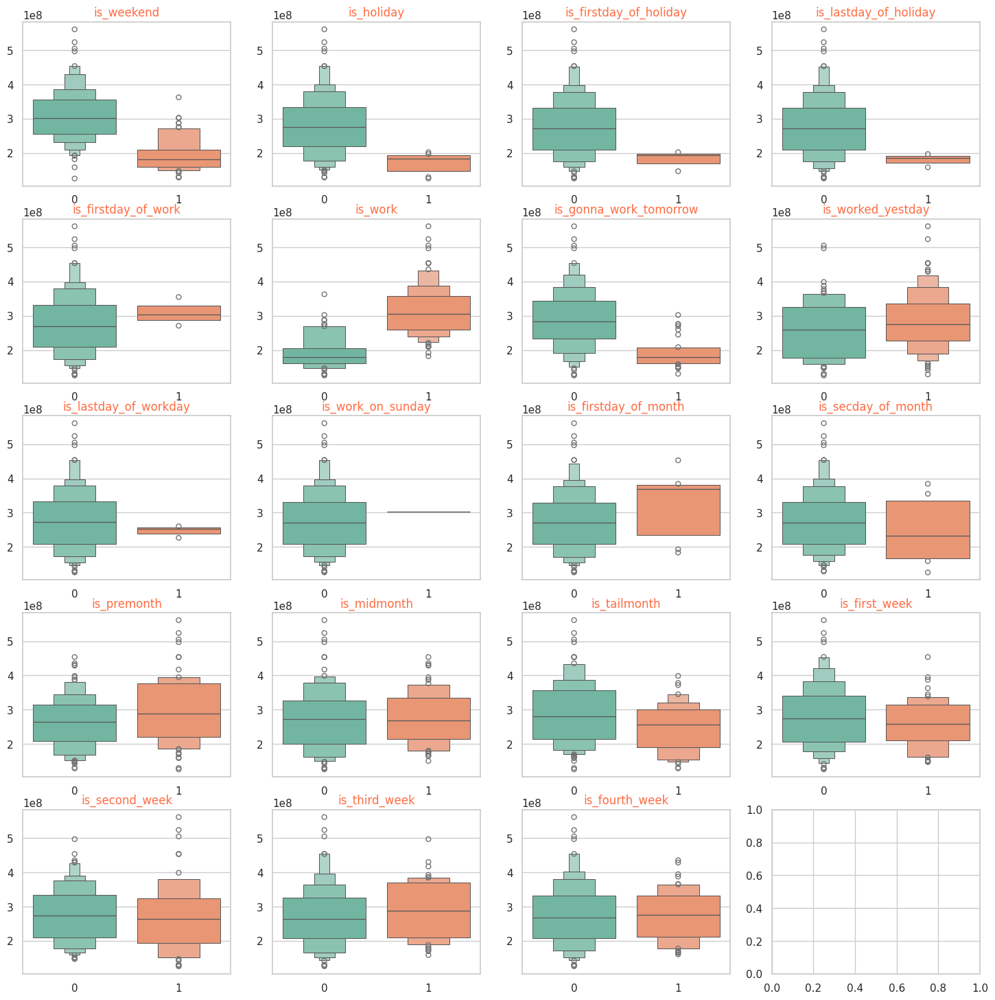

In [112]:
draw_boxplot(feature,label = 'total_purchase_amt')

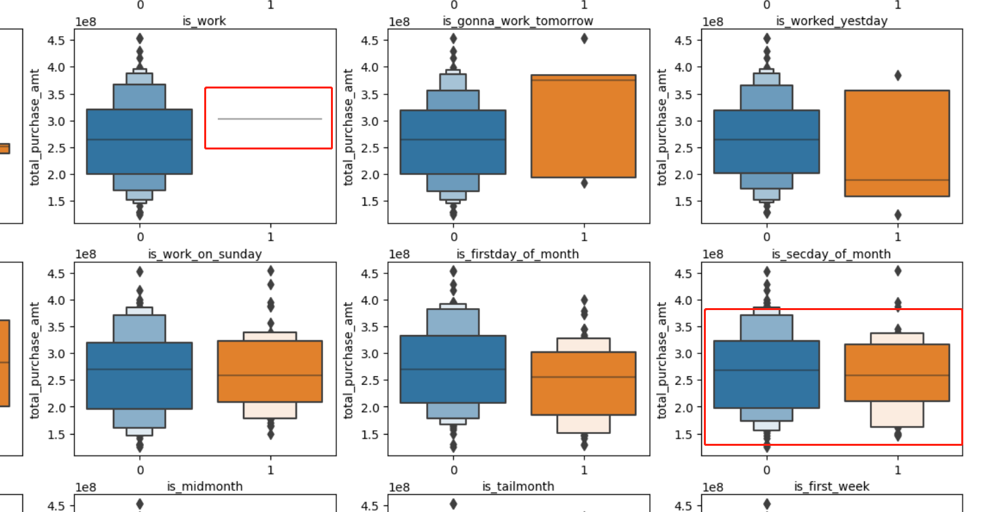

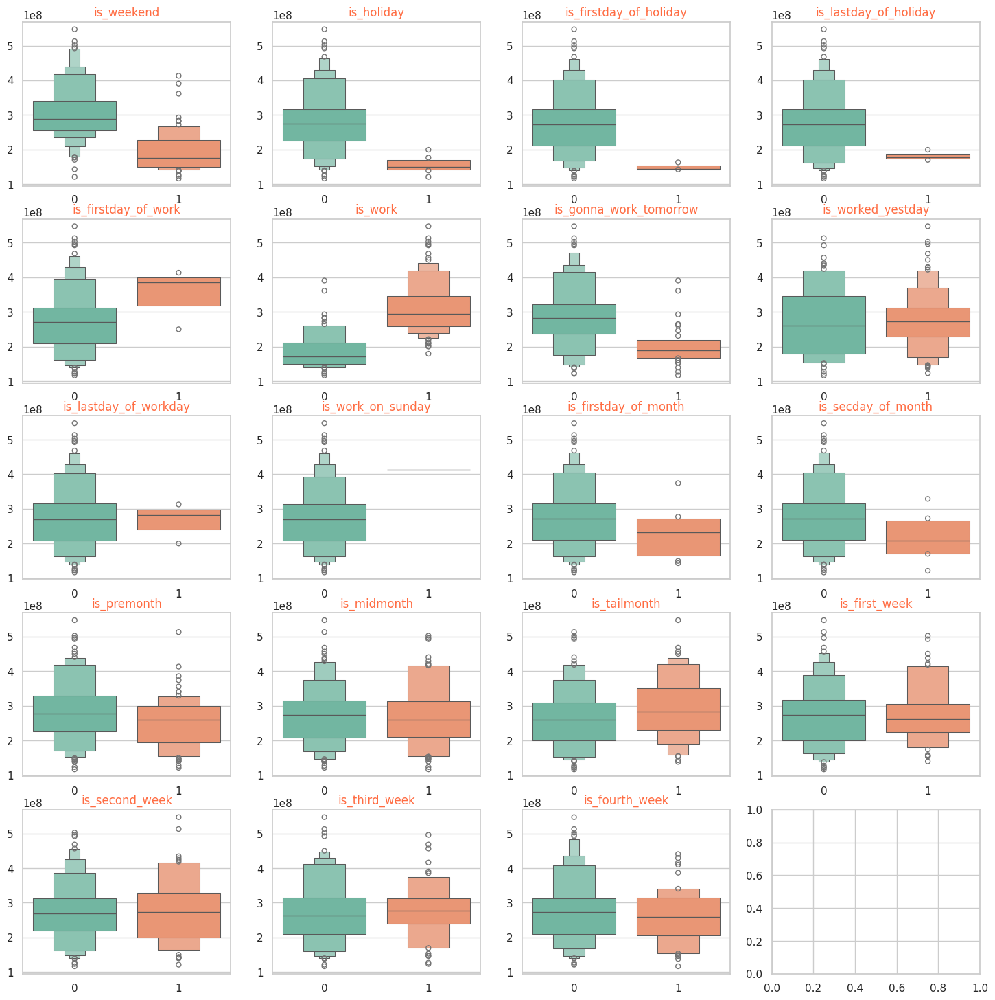

In [113]:
draw_boxplot(feature,label = 'total_redeem_amt')

In [114]:


## Eliminate features that seem to be useless

purchase_feature_seems_useless = [
    #The sample size is too small, so it is invalid for modeling; but if it is determined that this is a useful rule, the result can be corrected
    'is_work_on_sunday',
    #The median difference is not obvious
    'is_first_week'
]


### 1.3 Correlation analysis of IS characteristics

In [115]:
# Draw a correlation heatmap

def draw_correlation_heatmap(data: pd.DataFrame, way: str = 'pearson') -> None:
    feature = data.copy()
    plt.figure(figsize=(20,10))
    plt.title('The ' + way +' coleration between total purchase and each feature')
    sns.heatmap(feature[[x for x in feature.columns if x not in ['total_redeem_amt', 'date'] ]].corr(way),
                linecolor='white',
                linewidths=0.2,
                annot = True,
                fmt=".3f",  # Keep three decimal places
                annot_kws={"size": 8},  # Adjust text size
                cmap="RdBu")

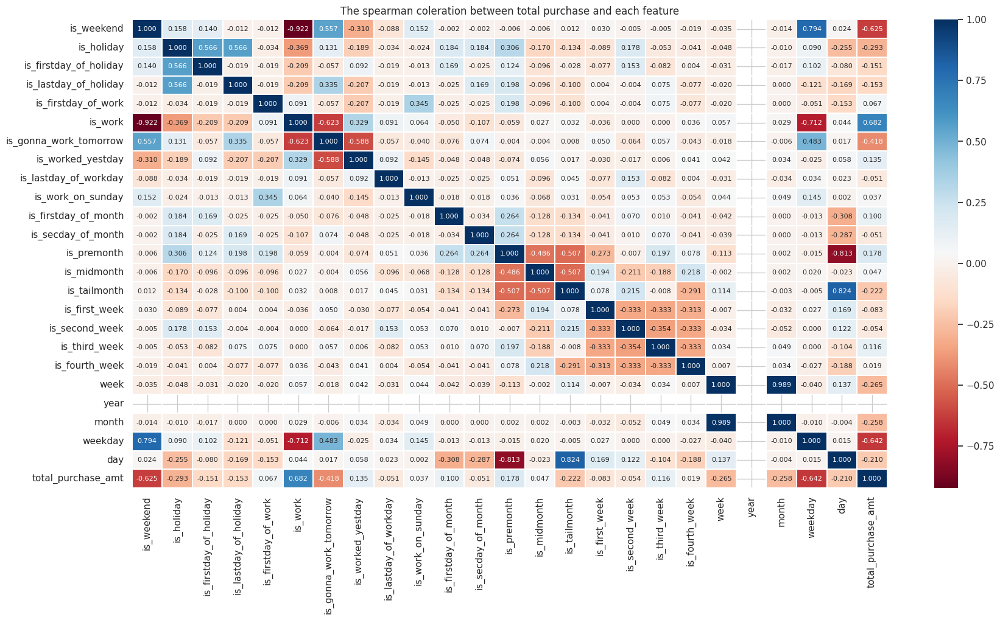

In [116]:
draw_correlation_heatmap(feature, 'spearman')

In [117]:
# Eliminate features with low relevance
temp = np.abs(feature[[x for x in feature.columns
                       if x not in ['total_redeem_amt', 'date'] ]].corr('spearman')['total_purchase_amt'])
feature_low_correlation = list(set(temp[temp < 0.1].index))

In [118]:
feature_low_correlation

['is_work_on_sunday',
 'is_fourth_week',
 'is_firstday_of_month',
 'is_secday_of_month',
 'is_lastday_of_workday',
 'is_firstday_of_work',
 'is_second_week',
 'is_midmonth',
 'is_first_week']

## 二、Distance-based features

### 2.1 Distance feature extraction

In [119]:
# Extracting distance features

def extract_distance_feature(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy()

    # How many days are left until the holiday?
    total_balance['dis_to_nowork'] = 0
    for index, row in total_balance.iterrows():
        if row['is_work'] == 0:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_work'] == 1:
                    total_balance.loc[index - step, 'dis_to_nowork'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_nowork'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_work'] == 1:
            total_balance.loc[index, 'dis_from_nowork'] = step
        else:
            step = 0

    # How many days until work?
    total_balance['dis_to_work'] = 0
    for index, row in total_balance.iterrows():
        if row['is_work'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_work'] == 0:
                    total_balance.loc[index - step, 'dis_to_work'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_work'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_work'] == 0:
            total_balance.loc[index, 'dis_from_work'] = step
        else:
            step = 0


    # How many days until the holiday?
    total_balance['dis_to_holiday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_holiday'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_holiday'] == 0:
                    total_balance.loc[index - step, 'dis_to_holiday'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_holiday'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_holiday'] == 0:
            total_balance.loc[index, 'dis_from_holiday'] = step
        else:
            step = 0

    # How many days are left until the last day of the holiday
    total_balance['dis_to_holiendday'] = 0
    for index, row in total_balance.iterrows():
        if row['is_lastday_of_holiday'] == 1:
            step = 1
            flag = 1
            while flag:
                if index - step >= 0 and total_balance.loc[index - step, 'is_lastday_of_holiday'] == 0:
                    total_balance.loc[index - step, 'dis_to_holiendday'] = step
                    step += 1
                else:
                    flag = 0

    total_balance['dis_from_holiendday'] = 0
    step = 0
    for index, row in total_balance.iterrows():
        step += 1
        if row['is_lastday_of_holiday'] == 0:
            total_balance.loc[index, 'dis_from_holiendday'] = step
        else:
            step = 0

    # How many days from the beginning of the month
    total_balance['dis_from_startofmonth'] = np.abs(total_balance['day'])

    # How many days from the middle of the month
    total_balance['dis_from_middleofmonth'] = np.abs(total_balance['day'] - 15)

    # How many days from the middle of the week
    total_balance['dis_from_middleofweek'] = np.abs(total_balance['weekday'] - 3)

    # How many days until Sunday
    total_balance['dis_from_endofweek'] = np.abs(total_balance['weekday'] - 6)

    return total_balance

In [120]:
# Splice distance features to the original dataset

total_balance = extract_distance_feature(total_balance)

### 2.2 Distance feature analysis

In [121]:
# Get the column name of the distance feature
feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]
dis_feature_indexs = [x for x in feature.columns if (x not in date_indexs + labels + ['date']) & ('dis_' in x)]

Point plot is a type of chart used to show the relationship between two variables. It is applicable to the relationship between continuous and categorical variables, and is usually used to compare the mean or median between different groups.

The functions of point plot include:

1. Show trend: Point plot can help us observe the trend of the mean or median of variables between different categories or groups, so as to more intuitively understand the law of data change.

2. Compare differences: Through point plot, we can intuitively compare the differences in the mean or median of variables between different categories or groups, helping us to find patterns and trends in the data.

3. Show confidence interval: Point plot usually displays confidence intervals, which helps us evaluate the accuracy of mean or median estimates and provides information about the degree of data variation.

4. Highlight outliers: Point plot can help us identify outliers, which may indicate special circumstances or abnormal events in the data.

In [122]:
# Drawing the graph

def draw_point_feature(data: pd.DataFrame) -> None:
    # Copy the data
    feature = data.copy()

    # Create subplots
    f, axes = plt.subplots(data.shape[1] // 3, 3, figsize=(30, data.shape[1] // 3 * 4))

    # Counter
    count = 0

    # Iterate over feature columns to draw point plots
    for i in [x for x in feature.columns if (x not in date_indexs + labels + ['date'])]:
        # Draw point plot
        sns.pointplot(x=i, y="total_purchase_amt",
                      marker="o",  # Set marker style to circle
                      data=feature,  # Data source
                      ax=axes[count // 3][count % 3] if data.shape[1] > 3 else axes[count])  # Set subplot position

        # Update counter
        count += 1

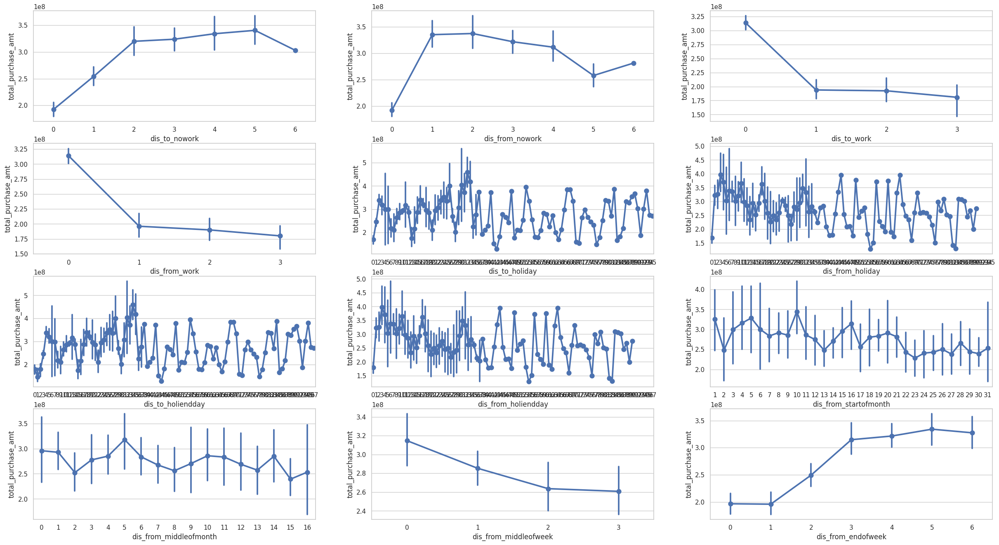

In [123]:
draw_point_feature(feature[['total_purchase_amt'] + dis_feature_indexs])

In [124]:
# Dealing with time points that are too far away

def dis_change(x):
    if x > 5:
        x = 10
    return x

In [125]:
# Handling special distances

dis_holiday_feature = [x for x in total_balance.columns if 'dis' in x and 'holi' in x]
dis_month_feature = [x for x in total_balance.columns if 'dis' in x and 'month' in x]
total_balance[dis_holiday_feature] = total_balance[dis_holiday_feature].applymap(dis_change)
total_balance[dis_month_feature] = total_balance[dis_month_feature].applymap(dis_change)

In [126]:
feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]

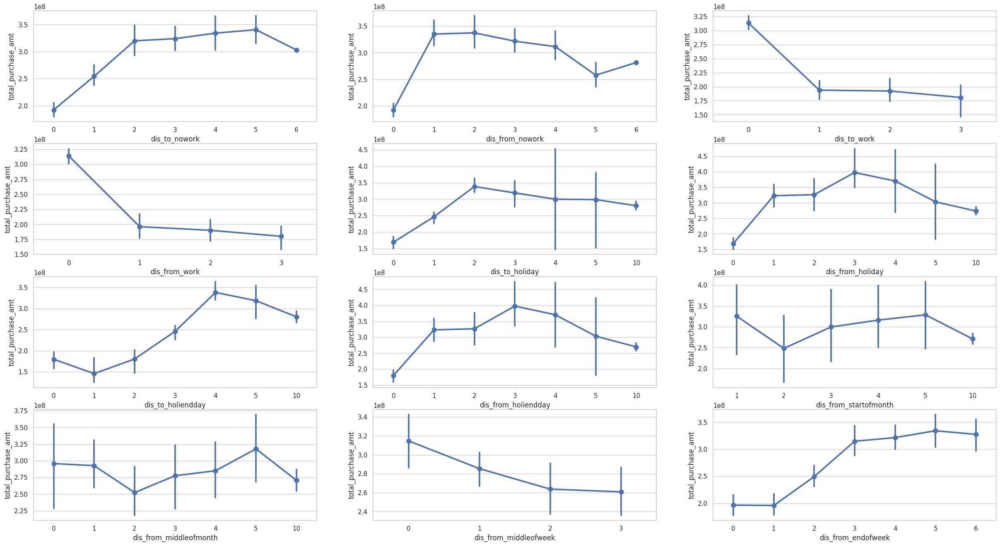

In [127]:
# Draw the processed graph

draw_point_feature(feature[['total_purchase_amt'] + dis_feature_indexs])

In [128]:
## Eliminate features that seem to be of little use
purchase_feature_seems_useless += [
    #Even if processed, the variance is too large, unreliable, and the pattern is not obvious
    'dis_to_holiday',
    #The variance is too large, unreliable
    'dis_from_startofmonth',
    #The variance is too large, unreliable
    'dis_from_middleofmonth'
]

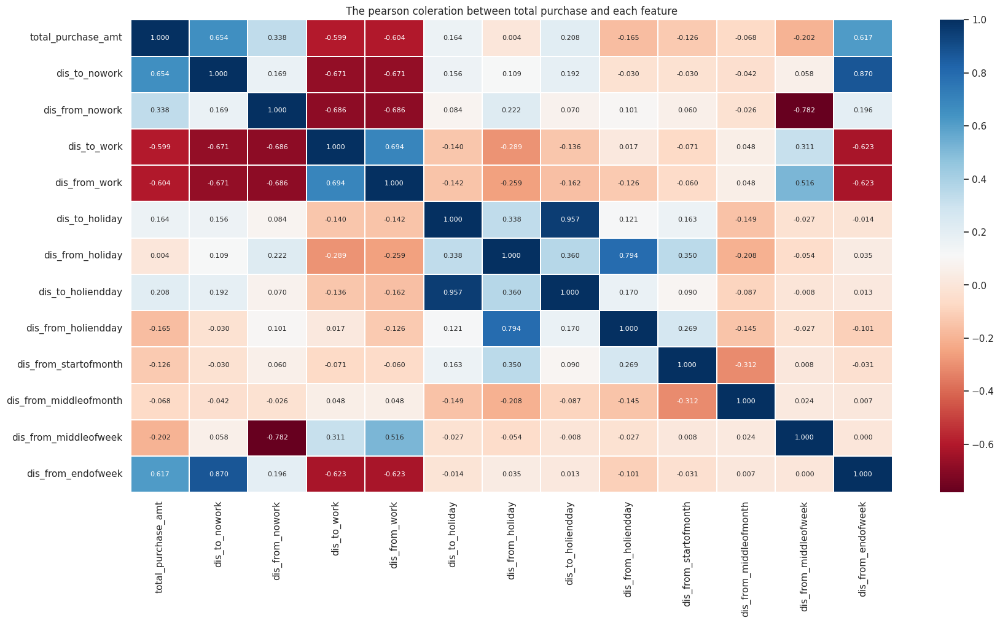

In [129]:
# Plotting the correlation graph

draw_correlation_heatmap(feature[['total_purchase_amt'] + dis_feature_indexs])

In [130]:
# Eliminate features with poor relevance

temp = np.abs(feature[[x for x in feature.columns
                       if ('dis' in x) | (x in ['total_purchase_amt']) ]].corr()['total_purchase_amt'])
feature_low_correlation += list(set(temp[temp < 0.1].index) )

In [131]:
feature_low_correlation

['is_work_on_sunday',
 'is_fourth_week',
 'is_firstday_of_month',
 'is_secday_of_month',
 'is_lastday_of_workday',
 'is_firstday_of_work',
 'is_second_week',
 'is_midmonth',
 'is_first_week',
 'dis_from_middleofmonth',
 'dis_from_holiday']

## 三、Peak and trough characteristics

### 3.1 Extract peak features

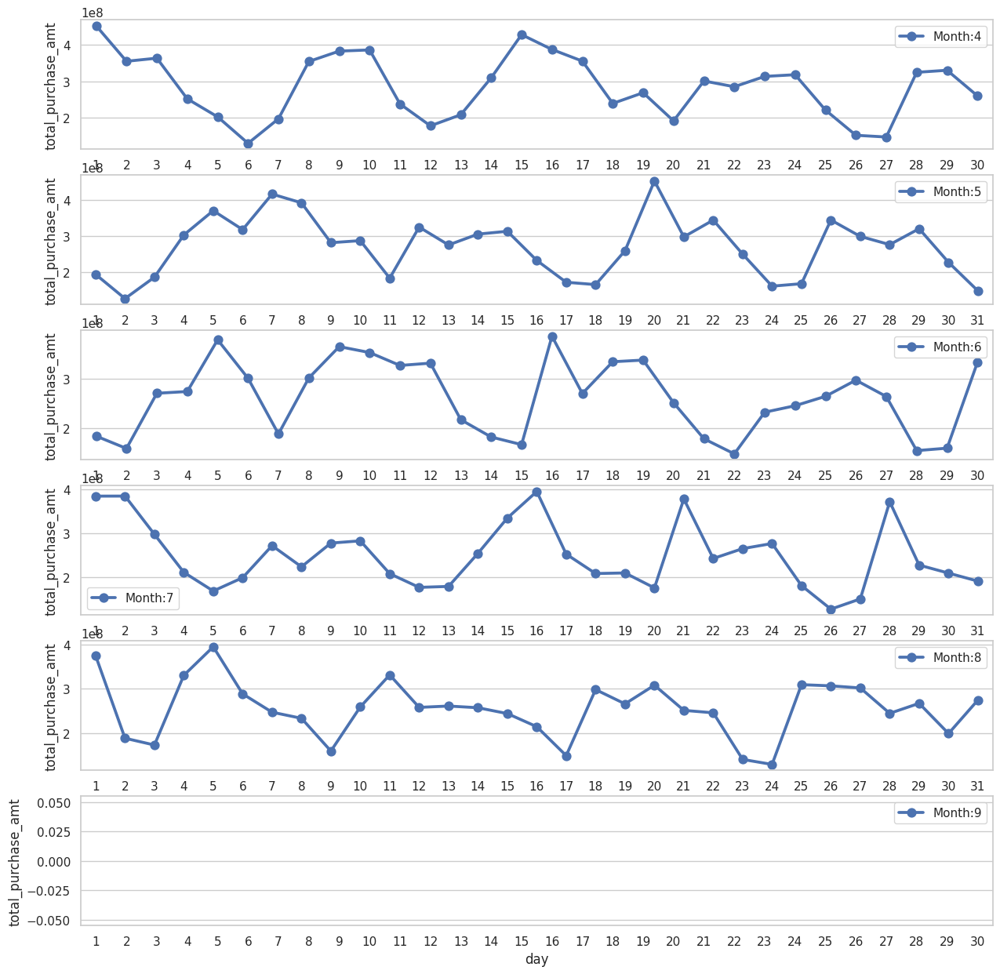

In [132]:
# Observe the peak characteristics
import datetime
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(15,15))
for i in range(4, 10):
    plt.subplot(6,1,i - 3)
    total_balance_2 = total_balance[(total_balance['date'].dt.date >= datetime.date(2014,i,1)) \
                                    & (total_balance['date'].dt.date < datetime.date(2014,i+1,1))]
    sns.pointplot(x=total_balance_2['day'],y=total_balance_2['total_purchase_amt'], label='Month:' + str(i))
    plt.legend()
plt.show()


In [133]:
#Purchase

#0401 (Tuesday) 0406 (Sunday, the second day of Qingming Festival)

#0410 (Thursday, similar to Tuesday) 0412 (Saturday, similar to Sunday)

#0415 (Tuesday) 0420 (Sunday)

#0424 (Thursday, similar to Tuesday) 0427 (Sunday)

#0429 (Tuesday) 0502 (Friday, the second day of Labor Day)

#0507 (Wednesday, with a big difference from Tuesday, may be affected by Labor Day) 0511 (Sunday)

#0512 (Monday, with a certain difference from Tuesday) 0518 (Sunday)

#0519 (Tuesday) 0525 (Sunday)

#0526 (Monday, with a certain difference from Tuesday) 0531 (Saturday, the end of the month)

#0605 (Thursday, with a big difference from Tuesday, may be affected by Dragon Boat Festival) 0607 (Saturday, may be affected by the Dragon Boat Festival)
#0609 (Monday, similar to Tuesday) 0615 (Sunday)
#0616 (Monday, big difference from Tuesday) 0622 (Sunday)
#0626 (Thursday, not much difference from Tuesday) 0629 (Sunday)
#0701 (Tuesday) 0705 (Saturday, not much difference from Sunday)
#0707 (Monday, there is a gap with Tuesday) 0713 (Sunday)
#0716 (Wednesday, there is a certain gap with Tuesday) 0720 (Sunday)
#0721 (Monday, there is a significant gap with Tuesday) 0726 (Saturday, similar to Sunday)
#0728 (Monday, there is a significant gap with Tuesday) 0803 (Sunday)
#0805 (Tuesday) 0809 (Saturday, there is a large gap with Sunday)
#0811 (Monday, there is a large gap with Tuesday) 0817 (Sunday)
#0818 (Monday, not much different from Tuesday) 0824 (Sunday)

In [134]:
# Set the peak date

def extract_peak_feature(data: pd.DataFrame)->pd.DataFrame:
    total_balance = data.copy()
    # How many days are there from the purchase peak (Tuesday)
    total_balance['dis_from_purchase_peak'] = np.abs(total_balance['weekday'] - 1)

    # How many days are there from the purchase valley (Sunday), the same as dis_from_endofweek
    total_balance['dis_from_purchase_valley'] = np.abs(total_balance['weekday'] - 6)

    return total_balance

In [135]:
# Extract peak features

total_balance = extract_peak_feature(total_balance)
feature = total_balance[[x for x in total_balance.columns if x not in date_indexs]]

### 3.2 Analyze peak characteristics

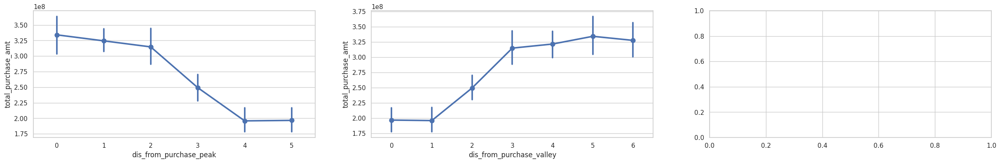

In [136]:
draw_point_feature(feature[['total_purchase_amt'] + ['dis_from_purchase_peak','dis_from_purchase_valley']])

### 3.3 Analyze peak feature correlation

In [137]:
temp = np.abs(feature[[x for x in feature.columns if ('peak' in x) or ('valley' in x) or (x in ['total_purchase_amt']) ]].corr()['total_purchase_amt'])
temp

,total_purchase_amt
total_purchase_amt,1.0000
dis_from_purchase_peak,0.6396
dis_from_purchase_valley,0.6170


## 4. Adding periodic factors as features

### 4.1 Extracting periodic factors

In [138]:
def generate_rate(df, month_index):
    """
    Generate weekly and daily average ratios of purchases and redemptions

    Parameters:
        df: DataFrame containing date, total purchase amount, and total redemption amount
        month_index: Month index to generate ratios for

    Return value:
        weekday_rate: Weekly average ratio
        day_rate: Daily average ratio
    """

    # Copy the input DataFrame
    total_balance = df.copy()

    # Extract date, total purchase amount and total redemption amount from total balance
    pure_balance = total_balance[['date','total_purchase_amt','total_redeem_amt']]

    # Filter data before a specified month
    pure_balance = pure_balance[(pure_balance['date'].dt.date >= datetime.date(2014, 3, 1)) \
                                & (pure_balance['date'].dt.date < datetime.date(2014, month_index, 1))]

    # Extract the day of the week, date, week number, and month from a date
    pure_balance['weekday'] = pure_balance['date'].dt.weekday
    pure_balance['day'] = pure_balance['date'].dt.day
    pure_balance['week'] = pure_balance['date'].dt.isocalendar().week
    pure_balance['month'] = pure_balance['date'].dt.month

    # Calculate the average purchase and redemption ratio per week
    weekday_rate = pure_balance[['weekday']+labels].groupby('weekday', as_index=False).mean()
    for name in labels:
        weekday_rate = weekday_rate.rename(columns={name: name+'_weekdaymean'})
    weekday_rate['total_purchase_amt_weekdaymean'] /= np.mean(pure_balance['total_purchase_amt'])
    weekday_rate['total_redeem_amt_weekdaymean'] /= np.mean(pure_balance['total_redeem_amt'])

    # Merge the weekly average ratio with the original data
    pure_balance = pd.merge(pure_balance, weekday_rate, on='weekday', how='left')

    # Calculate the daily purchase and redemption ratio
    weekday_count = pure_balance[['day','weekday','date']].groupby(['day','weekday'], as_index=False).count()
    weekday_count = pd.merge(weekday_count, weekday_rate, on='weekday')
    weekday_count['total_purchase_amt_weekdaymean'] *= weekday_count['date'] / (len(set(pure_balance['month'])) - 1)
    weekday_count['total_redeem_amt_weekdaymean'] *= weekday_count['date'] / (len(set(pure_balance['month'])) - 1)
    day_rate = weekday_count.drop(['weekday','date'], axis=1).groupby('day', as_index=False).sum()

    # Rename columns
    weekday_rate.columns = ['weekday','purchase_weekdayrate','redeem_weekdayrate']
    day_rate.columns = ['day','purchase_dayrate','redeem_dayrate']

    # Add the date of each day to the DataFrame
    day_rate['date'] = datetime.datetime(2014, month_index, 1)
    for index, row in day_rate.iterrows():
        if month_index in (2, 4, 6, 9) and row['day'] == 31:
            continue
        day_rate.loc[index, 'date'] = datetime.datetime(2014, month_index, int(row['day']))

    # Add the day of the week and calculate the daily purchase and redemption ratio
    day_rate['weekday'] = day_rate['date'].dt.weekday
    day_rate = pd.merge(day_rate, weekday_rate, on='weekday')
    day_rate['purchase_dayrate'] = day_rate['purchase_weekdayrate'] / day_rate['purchase_dayrate']
    day_rate['redeem_dayrate'] = day_rate['redeem_weekdayrate'] / day_rate['redeem_dayrate']

    # Add month information
    weekday_rate['month'] = month_index
    day_rate['month'] = month_index

    # Returns the weekly and daily ratios
    return weekday_rate, day_rate[['day','purchase_dayrate','redeem_dayrate','month']].sort_values('day')


In [139]:
# Generate periodic factors and merge into the dataset

weekday_rate_list = []
day_rate_list = []
for i in range(3, 10):
    weekday_rate, day_rate = generate_rate(total_balance, i)
    weekday_rate_list.append(weekday_rate.reset_index(drop=True))
    day_rate_list.append(day_rate.reset_index(drop=True))

weekday_rate_list = pd.concat(weekday_rate_list).reset_index(drop=True)
day_rate_list = pd.concat(day_rate_list).reset_index(drop=True)
total_balance = pd.merge(total_balance, weekday_rate_list, on=['weekday','month'], how='left')
total_balance = pd.merge(total_balance, day_rate_list, on=['day','month'], how='left')

In [140]:
# Special treatment of periodic factors Median is used to fill missing values

for i in [x for x in total_balance.columns
          if 'rate' in x and x not in labels + date_indexs]:
    total_balance[i] = total_balance[i].fillna(np.nanmedian(total_balance[i]))

### 4.2 Analyzing the Correlation of Periodic Factors

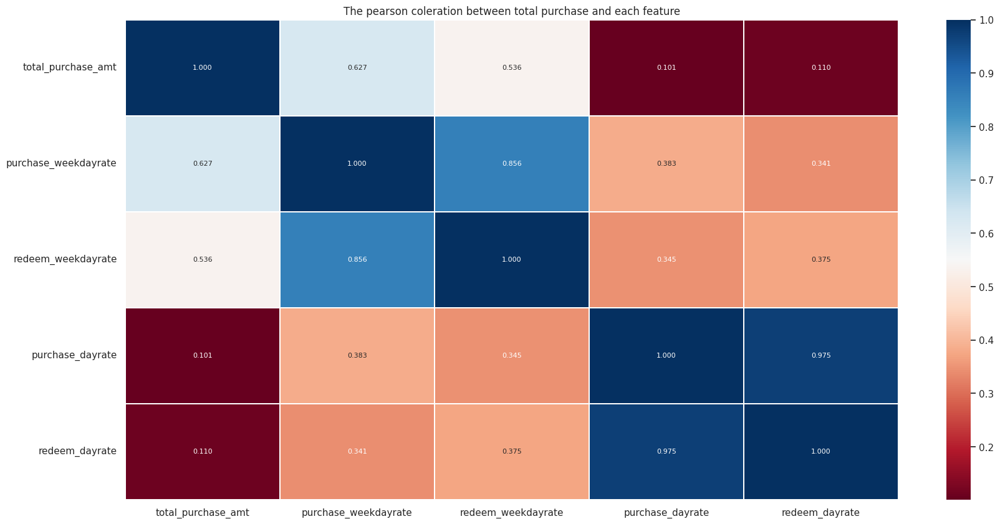

In [141]:
# Plotting the correlation graph

draw_correlation_heatmap(total_balance[['total_purchase_amt']
                                       + [x for x in total_balance.columns
                                          if 'rate' in x and x not in labels + date_indexs]])

In [142]:
# Eliminate features with low relevance

feature = total_balance.drop(date_indexs, axis=1)

## 5. Adding dynamic timing features

### 5.1 Extracting dynamic features

It mainly counts the purchase amount in different weeks of the week and calculates its statistical features, such as median, mean, minimum, maximum, standard deviation and skewness.

In [143]:
def get_amtfeature_with_time(data: pd.DataFrame) -> pd.DataFrame:
    # Copy a portion of the input dataset and keep the necessary columns (labels, date_indexes, and 'date')
    df_tmp_ = data[labels + date_indexs + ['date']].copy()
    total_balance = data.copy()  # Copy the entire input dataset

    # Select data with a date greater than or equal to March 3, 2014
    df_tmp_ = df_tmp_[(df_tmp_['date'].dt.date >= datetime.date(2014, 3, 3))]

    # Added new features: day of week, week number, day of date and month
    df_tmp_['weekday'] = df_tmp_['date'].dt.weekday + 1
    df_tmp_['week'] = df_tmp_['date'].dt.isocalendar().week - min(df_tmp_['date'].dt.isocalendar().week) + 1
    df_tmp_['day'] = df_tmp_['date'].dt.day
    df_tmp_['month'] = df_tmp_['date'].dt.month

    # Reset Index
    df_tmp_.reset_index(inplace=True)
    del df_tmp_['index']

    # Create a new DataFrame to store the purchase amount for each day of the week
    df_purchase = pd.DataFrame(columns=['weekday1', 'weekday2', 'weekday3', 'weekday4',
                                         'weekday5', 'weekday6', 'weekday7'])
    count = 0

    # Traverse the data and store the purchase amount for each week in the corresponding column in df_purchase
    for i in range(len(df_tmp_)):
        df_purchase.loc[count, 'weekday'+str(df_tmp_.loc[i, 'weekday'])] = df_tmp_.loc[i, 'total_purchase_amt']
        if df_tmp_.loc[i, 'weekday'] == 7:
            count = count + 1

    # Initialize columns for storing dynamic features
    df_tmp_['purchase_weekday_median'] = np.nan
    df_tmp_['purchase_weekday_mean'] = np.nan
    df_tmp_['purchase_weekday_min'] = np.nan
    df_tmp_['purchase_weekday_max'] = np.nan
    df_tmp_['purchase_weekday_std'] = np.nan
    df_tmp_['purchase_weekday_skew'] = np.nan

    # Calculate dynamic features: median, mean, minimum, maximum, standard deviation and skewness of purchase amount
    for i in range(len(df_tmp_)):
        if i > 4*7-1:  # Statistics from March 31, 2014
            df_tmp_.loc[i, 'purchase_weekday_median'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                       'weekday'+str(df_tmp_.loc[i, 'weekday'])].median()
            df_tmp_.loc[i, 'purchase_weekday_mean'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                     'weekday'+str(df_tmp_.loc[i, 'weekday'])].mean()
            df_tmp_.loc[i, 'purchase_weekday_min'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].min()
            df_tmp_.loc[i, 'purchase_weekday_max'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].max()
            df_tmp_.loc[i, 'purchase_weekday_std'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                    'weekday'+str(df_tmp_.loc[i, 'weekday'])].std()
            df_tmp_.loc[i, 'purchase_weekday_skew'] = df_purchase.loc[:df_tmp_.loc[i, 'week']-2,
                                                                     'weekday'+str(df_tmp_.loc[i, 'weekday'])].skew()

    # List of feature columns to merge into the overall dataset
    colList = ['purchase_weekday_median', 'purchase_weekday_mean', 'purchase_weekday_min',
               'purchase_weekday_max', 'purchase_weekday_std', 'purchase_weekday_skew']

    # Merge the new feature columns into the original dataset, based on day and month
    total_balance = pd.merge(total_balance, df_tmp_[colList+['day', 'month']], on=['day', 'month'], how='left')

    return total_balance


In [144]:
# Merge features into dataset

total_balance = get_amtfeature_with_time(total_balance)

In [145]:
# Special treatment for dynamic features

for i in [x for x in total_balance.columns
          if '_weekday_' in x and x not in labels + date_indexs]:
    total_balance[i] = total_balance[i].fillna(np.nanmedian(total_balance[i]))

### 5.2 Analyzing dynamic feature correlations

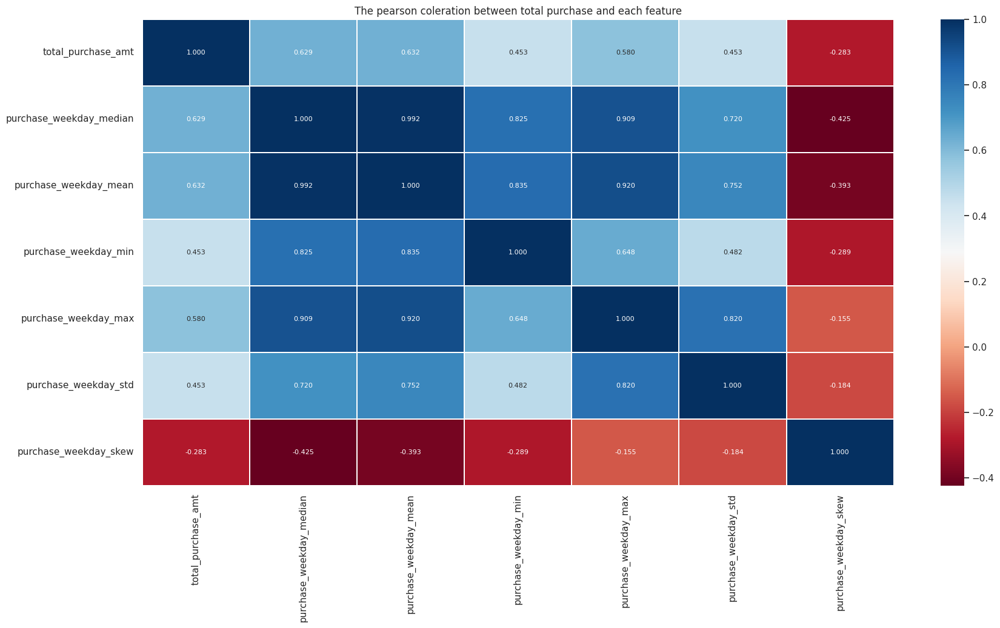

In [146]:
# Plotting correlation graphs of dynamic features

draw_correlation_heatmap(total_balance[['total_purchase_amt'] +
                                      ['purchase_weekday_median',
                                      'purchase_weekday_mean','purchase_weekday_min',
                                       'purchase_weekday_max','purchase_weekday_std',
                                       'purchase_weekday_skew'
                                      ]])

In [147]:
feature[labels + ['dis_to_nowork', 'dis_to_work', 'dis_from_work', 'purchase_weekdayrate',
       'redeem_dayrate', 'weekday_onehot_5', 'weekday_onehot_6',
       'dis_from_nowork', 'is_holiday', 'weekday_onehot_1', 'weekday_onehot_2',
       'weekday_onehot_0', 'dis_from_middleofweek', 'dis_from_holiendday',
       'weekday_onehot_3', 'is_lastday_of_holiday', 'is_firstday_of_holiday',
       'weekday_onehot_4', 'is_worked_yestday', 'is_second_week',
       'is_third_week', 'dis_from_startofmonth', 'dis_from_holiday', 'total_purchase_amt',
       'total_redeem_amt', 'date']].to_csv('residual_purchase_origined.csv', index=False)

#  Feature elimination

### 1.1 Eliminate features that cannot effectively segment the dataset

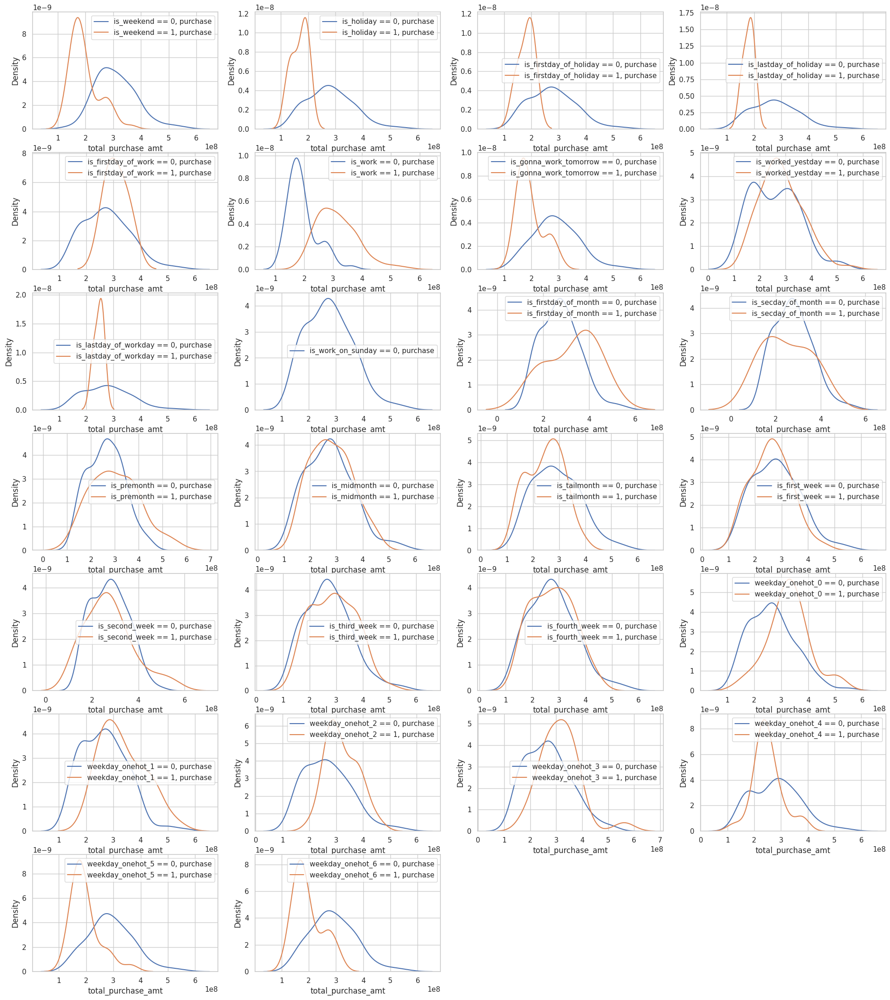

In [148]:
# Draw the distribution estimation diagram of each feature segmentation data set
plt.figure(figsize=(4 * 6, 6 * len(feature.columns) / 6))
count = 0
for i in [x for x in feature.columns
          if (x not in labels + date_indexs + ['date'])
          & ('amt' not in x) & ('dis' not in x) & ('rate' not in x)]:
    count += 1
    # if feature[feature[i] == 0].empty:
    #     continue
    plt.subplot(12, 4, count)

    ax = sns.kdeplot(feature[feature[i] == 0]['total_purchase_amt'], label= str(i) + ' == 0, purchase')
    ax = sns.kdeplot(feature[feature[i] == 1]['total_purchase_amt'], label= str(i) + ' == 1, purchase')
    plt.legend()

In [ ]:
# Eliminate features that do not clearly divide the data set

purchase_feature_seems_useless += ['is_gonna_work_tomorrow','is_fourth_week','weekday_onehot_4']

# Pick the winning features

In [149]:
# Split the dataset

def split_data_underline(data):
    import datetime
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,8,1))]
    testset = data[(datetime.date(2014,8,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    return trainset, testset

### 1.1 Use SHAP package to obtain winning features

> SHAP testues represent the fair score of features depending on their contribution towards the total score in the set of features.

> SHAP can also visualize how the score changes when the feature testue is low/high on each data.

The basic principle of SHAP is to arrange and combine different values ​​of features and calculate the impact of each arrangement and combination on the prediction results. Specifically, the SHAP value measures the "contribution" of each feature value to the model output, that is, the average impact of each feature value on the prediction results in all possible feature combinations. This average impact can be used to explain the model prediction of a single prediction result.

In [150]:
duplicated_col = feature.columns.duplicated()
feature = feature.loc[:,~duplicated_col]

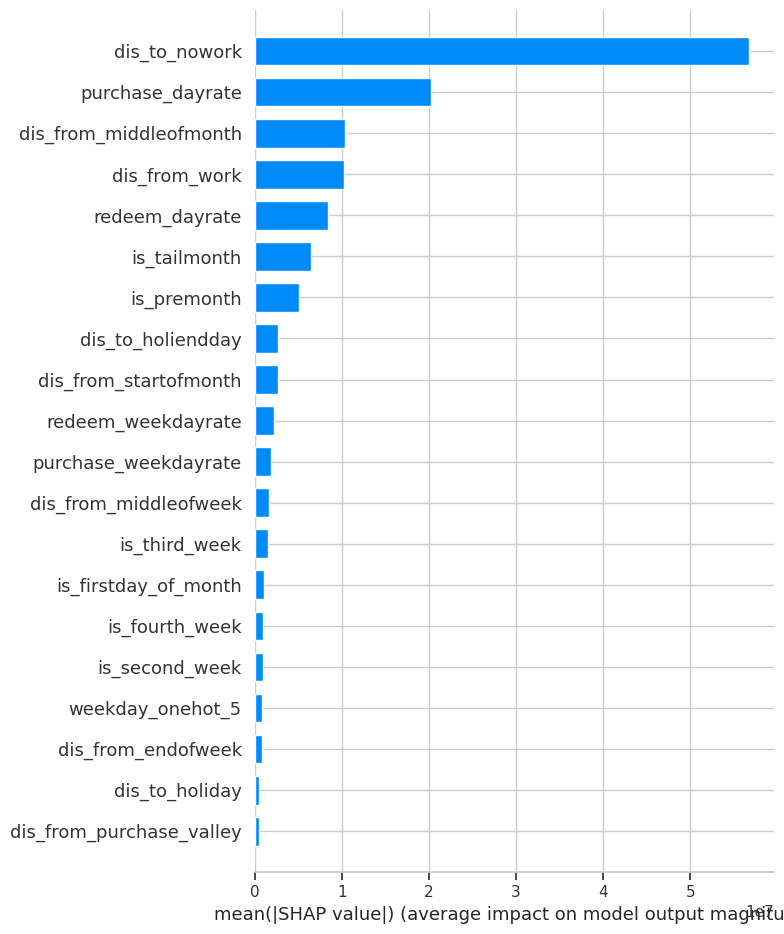

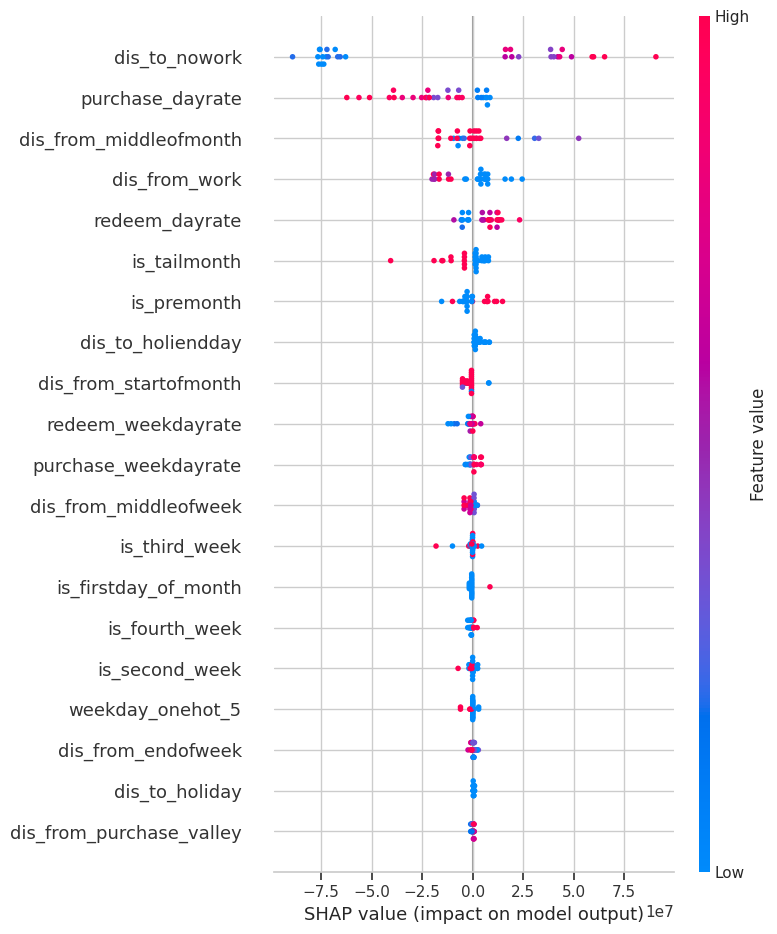

In [151]:
shap.initjs()
from sklearn import tree
model = tree.DecisionTreeRegressor()
train, test = split_data_underline(feature.dropna())
features = [x for x in train.columns if x not in date_indexs]
model.fit(train[features].drop(labels+['date'], axis=1), train['total_purchase_amt'])

explainer = shap.TreeExplainer(model)
shap_testues = explainer.shap_values(test[features].drop(labels+['date'], axis=1))

shap.summary_plot(shap_testues, test[features].drop(labels+['date'], axis=1), plot_type='bar')

shap.summary_plot(shap_testues, test[features].drop(labels+['date'], axis=1))

tree_important_purchase = pd.DataFrame(np.mean(np.abs(shap_testues), axis=0),[x for x in features if x not in labels + date_indexs + ['date']]).reset_index()

In [152]:
tree_important_purchase = tree_important_purchase.sort_values(0, ascending=False).reset_index(drop=True)
tree_important_purchase = list(tree_important_purchase[:30]['index'])

In [153]:
tree_important_purchase

['dis_to_nowork',
 'purchase_dayrate',
 'dis_from_middleofmonth',
 'dis_from_work',
 'redeem_dayrate',
 'is_tailmonth',
 'is_premonth',
 'dis_to_holiendday',
 'dis_from_startofmonth',
 'redeem_weekdayrate',
 'purchase_weekdayrate',
 'dis_from_middleofweek',
 'is_third_week',
 'is_firstday_of_month',
 'is_fourth_week',
 'is_second_week',
 'weekday_onehot_5',
 'dis_from_endofweek',
 'dis_to_holiday',
 'dis_from_purchase_valley',
 'weekday_onehot_0',
 'is_lastday_of_holiday',
 'is_first_week',
 'is_lastday_of_workday',
 'weekday_onehot_1',
 'dis_from_holiendday',
 'is_midmonth',
 'dis_from_nowork',
 'weekday_onehot_2',
 'is_gonna_work_tomorrow']

In [154]:
# Output selected features

def draw_cloud(feature_index: List[str])->None:
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    ciyun = WordCloud(background_color='white', max_font_size=40)
    ciyun.generate(text=''.join([x+' ' for x in feature_index if x != 'total_purchase_amt']))
    plt.imshow(ciyun, interpolation='bilinear')
    plt.axis("off")


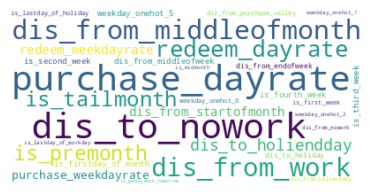

In [155]:
draw_cloud(tree_important_purchase)

### 1.2 Use the Permutation importance package to obtain the winning features

Permutation importance is a method used to explain the importance of features in machine learning models. It measures the importance of features by randomly permuting features (i.e., scrambling the order of feature values) and then observing the changes in model performance. The basic idea is that if a feature is important for the model's prediction, then the performance of the model will be greatly affected after it is permuted; conversely, if a feature is not important for the model's prediction, then the performance of the model should change less after it is permuted.

In [160]:
!pip install eli5

In [162]:
import eli5

In [163]:
from eli5.sklearn import PermutationImportance

In [164]:
model = LinearRegression()
train, test = split_data_underline(feature.dropna())
model.fit(train[features].drop(labels+['date'], axis=1), train['total_purchase_amt'])
perm = PermutationImportance(model, random_state=42).fit(test[features].drop(labels+['date'], axis=1), test['total_purchase_amt'])
liner_important_purchase = pd.DataFrame(np.abs(perm.feature_importances_), [x for x in features if x not in labels + date_indexs + ['date']]).reset_index()
eli5.show_weights(perm, feature_names=list(str(x) for x in features if x not in labels + ['date']))


Weight,Feature
2.7721 ± 1.0007,redeem_weekdayrate
2.4609 ± 0.8026,dis_to_work
0.9072 ± 0.7078,dis_from_endofweek
0.8767 ± 0.2668,dis_from_purchase_valley
0.5286 ± 0.2775,is_gonna_work_tomorrow
0.3869 ± 0.2305,purchase_dayrate
0.2385 ± 0.2484,is_firstday_of_month
0.1503 ± 0.1062,dis_from_purchase_peak
0.1477 ± 0.1220,is_premonth
0.1419 ± 0.1316,weekday_onehot_5


In [165]:
liner_important_purchase = liner_important_purchase.sort_values(0, ascending=False).reset_index(drop=True)
liner_important_purchase = list(liner_important_purchase[:30]['index'])


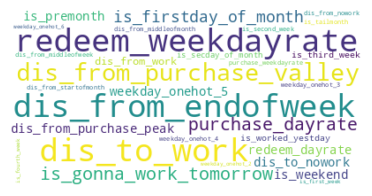

In [166]:
draw_cloud(liner_important_purchase)

### 1.3 The final winning feature is selected by taking the intersection of the feature set

In [167]:
winer_features_purchase = list(set(tree_important_purchase)\
                     & set(liner_important_purchase))

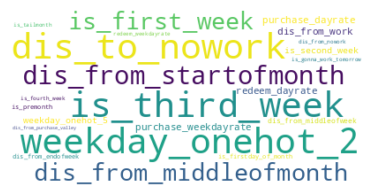

In [168]:
draw_cloud(winer_features_purchase)

In [169]:
# Split the dataset

labels = ['total_purchase_amt', 'total_redeem_amt']

def split_data_underline(data: pd.DataFrame)->pd.DataFrame:
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,8,1))]
    testset = data[(datetime.date(2014,8,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    return trainset, testset

def split_data_online(data: pd.DataFrame)->pd.DataFrame:
    trainset = data[(datetime.date(2014,4,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,9,1))]
    testset = data[(datetime.date(2014,9,1) <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014,10,1))]
    return trainset, testset

In [170]:
# Define the evaluation function

def AE(y: Iterable, yhat: Iterable)->Iterable:
    return np.abs(y - yhat) / np.abs(y)

def total_AE(purchasehat: Iterable, redeemhat: Iterable, purchase: Iterable, redeem: Iterable, h: int = 0.3)->Iterable:
    return sum(map(lambda x : np.exp(-x/h)*10, AE(purchase, purchasehat))) * 0.45 + sum(map(lambda x : np.exp(-x/h)*10, AE(redeem, redeemhat))) * 0.55

In [171]:
# Validate the model at different time periods

def week_evalution_single(data: pd.DataFrame, model: object, types: str)->pd.DataFrame:
    results = []
    a_month = relativedelta(months=1)
    for i in [datetime.date(2014, 8, 1), datetime.date(2014, 7, 25), datetime.date(2014, 7, 18), datetime.date(2014, 7, 11),
          datetime.date(2014, 7, 4), datetime.date(2014, 6, 27), datetime.date(2014, 6,20)]:
        trainset = data[(i - 4 * a_month <= data['date'].dt.date) & (data['date'].dt.date < i)]
        testset = data[(i <= data['date'].dt.date) & (data['date'].dt.date < i + a_month)]
        if len(testset) == 0 or len(trainset) == 0:
            i = datetime.date(2014, 4, 20)
            trainset = data[(i - 4 * a_month <= data['date'].dt.date) & (data['date'].dt.date < i)]
            testset = data[(i <= data['date'].dt.date) & (data['date'].dt.date < datetime.date(2014, 9, 1))]
        feature = [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']]

        model.fit(X=trainset[feature], y=trainset['total_' + types + '_amt'])
        result_lr = model.predict(testset[feature])

        h = 0.3
        results.append(sum(AE(testset['total_' + types + '_amt'], result_lr).apply(lambda x : np.exp(-x/h))*10))
    return pd.DataFrame(results)

In [172]:
# Output rating table

def draw_eva_table(df: pd.DataFrame)->pd.DataFrame:
    rest = df.copy()
    rest['interval'] = [datetime.date(2014, 8, 1), datetime.date(2014, 7, 25), datetime.date(2014, 7, 18), datetime.date(2014, 7, 11),
          datetime.date(2014, 7, 4), datetime.date(2014, 6, 27), datetime.date(2014, 6,20)]
    return rest

In [173]:
# Visualize the generated results

def visual(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame)->None:
    fig = plt.figure(figsize=(10,4))
    plt.plot(testset['date'], result_purchase_lr, label='predicted_purchase')
    plt.plot(testset['date'], testset['total_purchase_amt'], label='real_purchase')

    plt.legend(loc='best')
    plt.title("The distribution of real and predict purchase")
    plt.xlabel("Time")
    plt.ylabel("Amount")
    plt.show()
    fig = plt.figure(figsize=(10,4))
    sns.barplot(x = testset['date'].dt.day ,y = result_purchase_lr - testset['total_purchase_amt'])

    fig = plt.figure(figsize=(10,4))
    plt.plot(testset['date'], result_redeem_lr, label='predicted_redeem')
    plt.plot(testset['date'], testset['total_redeem_amt'], label='real_redeem')

    plt.legend(loc='best')
    plt.title("The distribution of real and predict redeem")
    plt.xlabel("Time")
    plt.ylabel("Amount")
    plt.show()
    fig = plt.figure(figsize=(10,4))
    sns.barplot(x = testset['date'].dt.day ,y = result_redeem_lr - testset['total_redeem_amt'])

In [174]:
# Define the function to extract the best offline features

def feature_extract(data: pd.DataFrame, model: object, types: str)->Tuple[List[str], List[float]]:
    features = [x for x in data.columns if x not in labels + ['date']]
    random.shuffle(features)
    results = []
    score = -1
    for i in features:
        score_update = np.mean(week_evalution_single(data[results + [i] + labels + ['date']], model, types))
        if score_update > score:
            score = score_update
            results.append(i)
    return results, score

def robust_feature_extract(data: pd.DataFrame, model: object, types: str):
    results = []
    score = -1
    for i in range(10):
        results_update, score_update = feature_extract(data, model, types)
        if score_update > score:
            score = score_update
            results = results_update
        print(results_update, score_update)
    return results

In [175]:
# Define AIC, BIC evaluation indicators

def AIC(L: Iterable, delta: float, n_features: int):
    return L * np.log10(delta) + 2 * (n_features + 1)
def BIC(L: Iterable, delta: float, n_features: int):
    return L * np.log10(delta) + (n_features + 1) * np.log10(L)

In [176]:
# Using the AIC metric to combine models

def feature_extract_AIC(data: pd.DataFrame, model: object, types: str)->Tuple[List[str], float]:
    features = [x for x in data.columns if x not in labels + ['date']]
    random.shuffle(features)
    results = []
    test_score = 1e9
    train_score = 0
    for i in features:
        test_score_update = np.mean(week_evalution_single(data[results + [i] + labels + ['date']], model, types)[0])
        if test_score_update < test_score:
            test_score = test_score_update
            results.append(i)

    trainset, testset = split_data_underline(data)
    feature = results
    model.fit(X=trainset[feature], y=trainset['total_' + types + '_amt'])
    train_result_lr = model.predict(trainset[feature])
    delta = mean_squared_error(train_result_lr, trainset['total_' + types + '_amt'])
    #delta = np.sum(AE(trainset['total_' + types + '_amt'], train_result_lr).apply(lambda x : np.exp(-x/0.1))*10)
    return results, AIC(len(trainset), delta, len(feature))

def multi_model(data: pd.DataFrame, model: object, types: str)->Tuple[List[List[str]], float]:
    features = []
    weights = []
    for i in range(100):
        results_update, score_update = feature_extract_AIC(data, model, types)
        features.append(results_update)
        weights.append(score_update)
    avg = np.mean(weights)
    weights = [x - avg for x in weights]
    weights = [np.power((-1 * x / 2), 10) for x in weights]
    summ = np.sum(weights)
    weights = [x / summ for x in weights]
    return features, weights

In [177]:
# Generate online results

def generate_online_result(df: pd.DataFrame, feature: Iterable, model = LinearRegression(), target:str = 'total_purchase_amt')->Iterable:
    trainset, testset = split_data_online(df)
    model.fit(X=trainset[feature], y=trainset[target])
    result_purchase_lr = model.predict(testset[feature])
    return result_purchase_lr

In [178]:
def generate_under_result(df: pd.DataFrame, feature: Iterable, model = LinearRegression(), target:str = 'total_purchase_amt')->Iterable:
    trainset, testset = split_data_underline(df)
    model.fit(X=trainset[feature], y=trainset[target])
    result_purchase_lr = model.predict(testset[feature])
    return result_purchase_lr

In [179]:
# Generate online submission format

def normalize_upload_file(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame)->pd.DataFrame:
    testset['total_purchase_amt'] = result_purchase_lr
    testset['total_redeem_amt'] = result_redeem_lr
    online_upload = testset[['date','total_purchase_amt','total_redeem_amt']]
    online_upload['date'] = online_upload['date'].astype(str)
    online_upload['date'] = online_upload['date'].str.replace('-','')
    return online_upload

In [180]:
# Online results visualization

def draw_result(result_purchase_lr: Iterable, result_redeem_lr: Iterable, testset: pd.DataFrame):
    fig = plt.figure(figsize=(12,6))
    plt.plot(testset['date'], result_purchase_lr, label='online_purchase', linewidth = 0.7, linestyle = '--', marker = 'o')
    plt.plot(testset['date'], result_redeem_lr, label='online_redeem', linewidth = 1.2, marker = '*')
    plt.legend(loc='best')
    plt.title("The predict values")
    plt.xlabel("Time")
    plt.ylabel("Amount")

In [181]:
# Overloading DataFrame addition

def add_two_df(df1, df2, features = None, left_a = 0.45, right_a = 0.55):
    data = df1.copy()
    if not features:
        features = [x for x in data.columns if x != 'interval']
    for i in features:
        data[i] = (data[i] * left_a + df2[i] * right_a)
    return data

In [182]:
# Overloading DataFrame multiplication

def scale_df(df1, features = None, eta = 1):
    data = df1.copy()
    if not features:
        features = [x for x in data.columns if x != 'interval']
    for i in features:
        data[i] *= eta
    return data

# Feature elimination

## 1. Use only IS features



In [183]:
winer_features_purchase

['dis_to_nowork',
 'weekday_onehot_2',
 'is_third_week',
 'dis_from_startofmonth',
 'dis_from_middleofmonth',
 'is_first_week',
 'purchase_weekdayrate',
 'dis_from_work',
 'purchase_dayrate',
 'redeem_dayrate',
 'weekday_onehot_5',
 'is_second_week',
 'dis_from_middleofweek',
 'dis_from_endofweek',
 'is_premonth',
 'is_firstday_of_month',
 'is_gonna_work_tomorrow',
 'is_tailmonth',
 'redeem_weekdayrate',
 'is_fourth_week',
 'dis_from_nowork',
 'dis_from_purchase_valley']

In [184]:
data = feature[['date','total_purchase_amt','total_redeem_amt']+winer_features_purchase].copy()
data['date'] = pd.to_datetime(data['date'])

In [185]:
trainset, testset = split_data_underline(data)
result_purchase_lr = generate_under_result(data, [x for x in data.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], target='total_purchase_amt')
result_redeem_lr = generate_under_result(data, [x for x in data.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], target='total_redeem_amt')

### 1.1 August Forecast

In [186]:
total_AE(result_purchase_lr, result_redeem_lr, testset['total_purchase_amt'], testset['total_redeem_amt'])

185.90839135793289

In [187]:
draw_eva_table(week_evalution_single(data, model=LinearRegression(), types = 'purchase'))

,0,interval
0,205.7622,2014-08-01
1,192.7039,2014-07-25
2,186.6693,2014-07-18
3,193.8890,2014-07-11
4,165.2049,2014-07-04
5,171.4884,2014-06-27
6,170.4699,2014-06-20


### 1.2 Sliding Window Test

In [188]:
draw_eva_table(week_evalution_single(data, LinearRegression(), 'redeem'))

,0,interval
0,169.6643,2014-08-01
1,134.2580,2014-07-25
2,162.6899,2014-07-18
3,149.5044,2014-07-11
4,154.7978,2014-07-04
5,174.3305,2014-06-27
6,163.7869,2014-06-20


### 1.3 Comparative Analysis

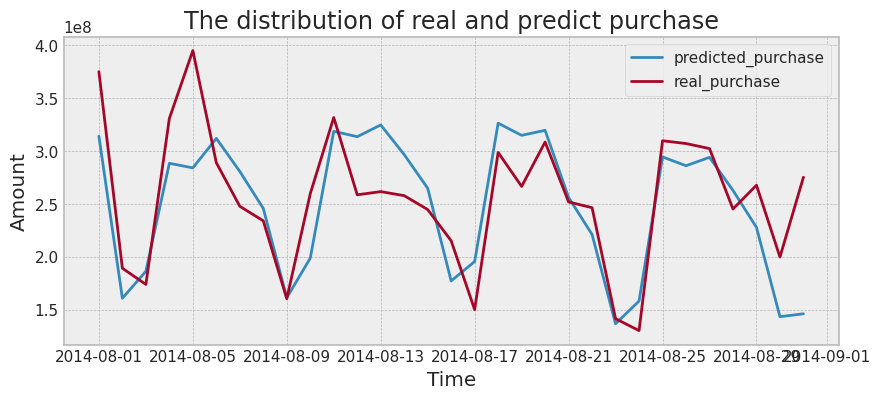

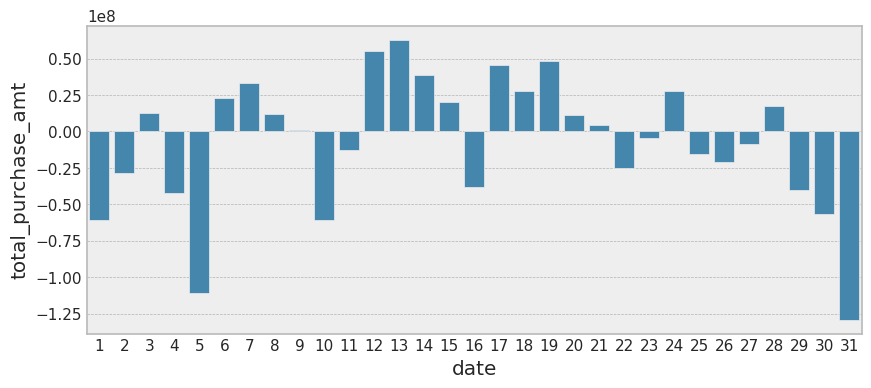

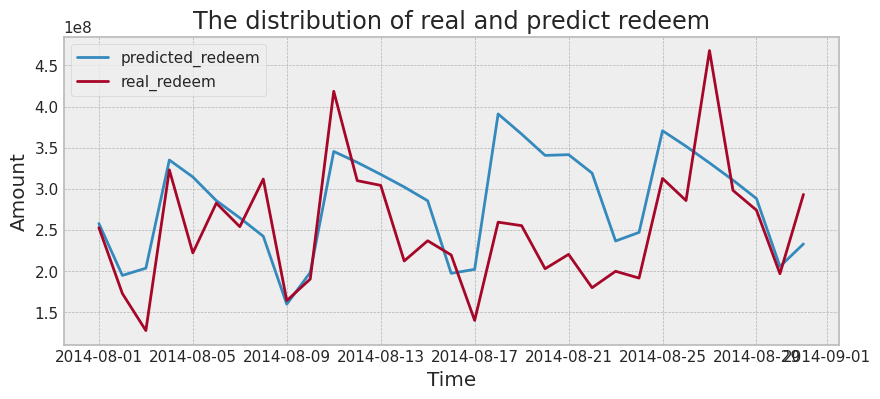

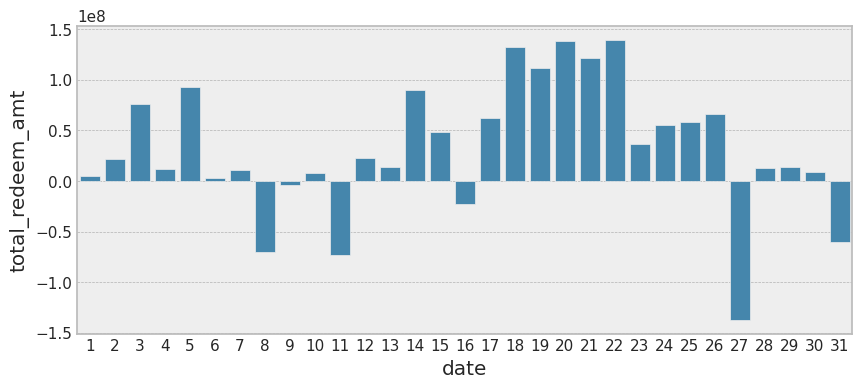

In [189]:
visual(result_purchase_lr, result_redeem_lr, testset)

In [190]:
result_purchase_lr = generate_online_result(data, [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], LinearRegression(),'total_purchase_amt')
result_redeem_lr = generate_online_result(data, [x for x in trainset.columns if x not in ['total_purchase_amt','total_redeem_amt','date']], LinearRegression(),'total_redeem_amt')

### 1.4 September Forecast

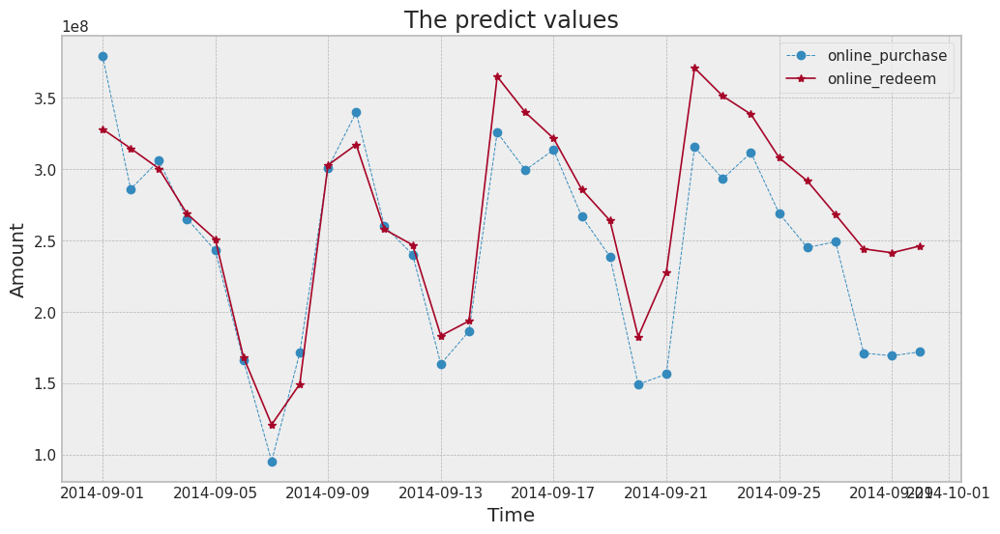

In [191]:
trainset, testset = split_data_online(data)
draw_result(result_purchase_lr, result_redeem_lr, testset)

In [192]:
# from datetime import datetime
# now = datetime.now().strftime("%Y-%m-%d")
# save_path = '路径'
# normalize_upload_file(result_purchase_lr, result_redeem_lr, testset).to_csv(save_path+f'{now}_only_is.csv',index=False,header=None)

## 1.5 Multi-model comparative analysis

Evaluating Models: 100%|██████████| 13/13 [00:05<00:00,  2.47model/s, Current Model=KNeighborsRegressor]


Text(0, 0.5, 'Score')

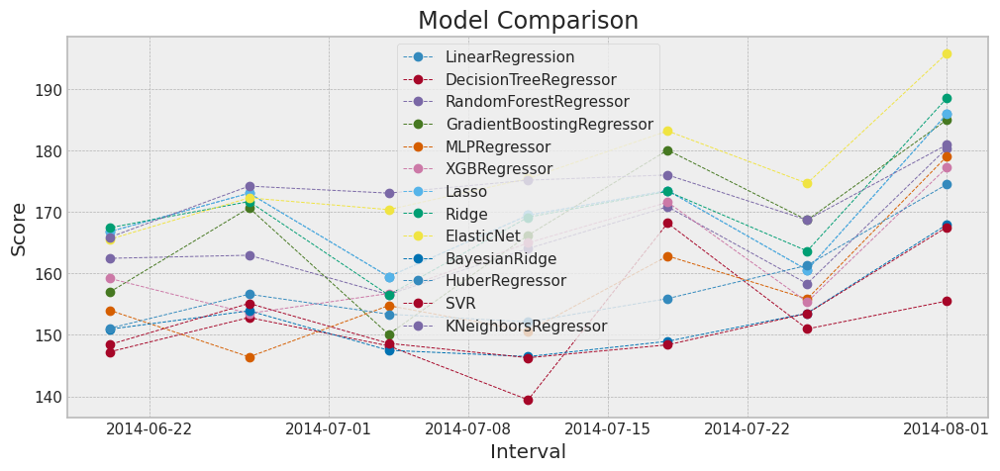

In [193]:
def multi_model_eva(data, types: str = 'purchase'):
    results = pd.DataFrame()
    models = [
        LinearRegression(),
        DecisionTreeRegressor(),
        RandomForestRegressor(),
        GradientBoostingRegressor(),
        MLPRegressor(solver='lbfgs'),
        xgb.XGBRegressor(objective='reg:squarederror'),
        Lasso(),
        Ridge(),
        ElasticNet(),
        BayesianRidge(),
        HuberRegressor(),
        SVR(),
        KNeighborsRegressor()
    ]

    # Initialize tqdm to track progress
    progress_bar = tqdm(models, desc="Evaluating Models", unit="model")

    for model in progress_bar:
        model_name = repr(model).split('(')[0]
        if results.empty:
            results = draw_eva_table(week_evalution_single(data, model, types)).rename(columns={0: model_name})
        else:
            results = pd.merge(results,
                               draw_eva_table(week_evalution_single(data, model, types)).rename(columns={0: model_name}),
                               on='interval')

        # Update tqdm description with current model name
        progress_bar.set_postfix({'Current Model': model_name})

    results = results[['interval'] + [x for x in results.columns if x != 'interval']]
    return results

multi_result = add_two_df(multi_model_eva(data, 'purchase'), multi_model_eva(data, 'redeem')).set_index('interval')
multi_result

multi_result.plot(figsize = (12,5),kind = 'line', marker = 'o', linewidth = 0.7, linestyle = '--')
plt.title('Model Comparison')
plt.xlabel('Interval')
plt.ylabel('Score')

In [194]:
from prophet import Prophet

Downloading...
From (original): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo
From (redirected): https://drive.google.com/uc?id=176NOnrMP4xKUNQ8nFs7cYJ_SAmjaDZfo&confirm=t&uuid=dfa548b0-54c3-4aa6-ab90-d61ae159a919
To: /content/downloaded_file.csv
100%|██████████| 158M/158M [00:01<00:00, 154MB/s]
DEBUG:cmdstanpy:input tempfile: /tmp/tmpv5x2nbfu/4tmqh74j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpv5x2nbfu/b7lk5qnc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83494', 'data', 'file=/tmp/tmpv5x2nbfu/4tmqh74j.json', 'init=/tmp/tmpv5x2nbfu/b7lk5qnc.json', 'output', 'file=/tmp/tmpv5x2nbfu/prophet_modelq5e58l8q/prophet_model-20241226095502.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:55:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:55:03 - cmdstanpy - 

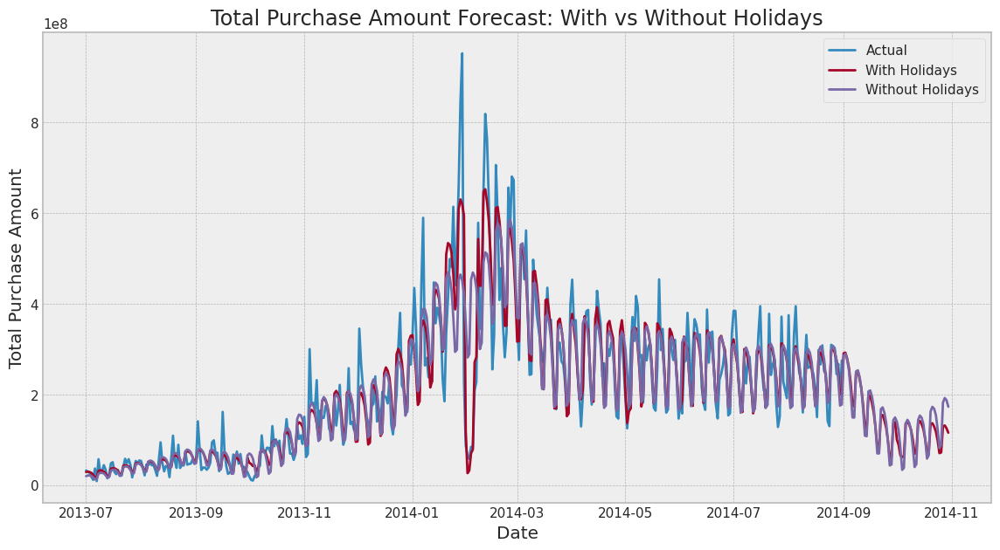

In [195]:
# Preparing the data format required for the Prophet model

balance_data = load_data()
balance_data = add_timestamp(balance_data)
total_balance = get_total_balance(balance_data, date = None)
total_balance = generate_test_data(total_balance)
total_balance = add_timestamp(total_balance, 'date')

df_purchase = total_balance[['date', 'total_purchase_amt']].rename(columns={'date': 'ds', 'total_purchase_amt': 'y'})

# Add special date data
special_dates = [
    '2014-04-01', '2014-04-06', '2014-04-10', '2014-04-12', '2014-04-15', '2014-04-20',
    '2014-04-24', '2014-04-27', '2014-04-29', '2014-05-02', '2014-05-07', '2014-05-11',
    '2014-05-12', '2014-05-18', '2014-05-19', '2014-05-25', '2014-05-26', '2014-05-31',
    '2014-06-05', '2014-06-07', '2014-06-09', '2014-06-15', '2014-06-16', '2014-06-22',
    '2014-06-26', '2014-06-29', '2014-07-01', '2014-07-05', '2014-07-07', '2014-07-13',
    '2014-07-16', '2014-07-20', '2014-07-21', '2014-07-26', '2014-07-28', '2014-08-03',
    '2014-08-05', '2014-08-09', '2014-08-11', '2014-08-17', '2014-08-18', '2014-08-24'
]

holidays = pd.DataFrame({
    'holiday': 'special_day',
    'ds': pd.to_datetime(special_dates),
    'lower_window': 0,
    'upper_window': 1
})

# Create and train a Prophet model that includes holidays
m_with_holidays = Prophet(
    holidays=holidays,
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.1,
    seasonality_prior_scale=20,
    yearly_seasonality=True,
    daily_seasonality=True
)
m_with_holidays.add_country_holidays(country_name='CN')  # Add Chinese holidays
m_with_holidays.fit(df_purchase)

# Create and train a Prophet model excluding holidays
m_without_holidays = Prophet(
    seasonality_mode='multiplicative',
    changepoint_prior_scale=0.1,
    seasonality_prior_scale=20,
    yearly_seasonality=True,
    daily_seasonality=True
)
m_without_holidays.fit(df_purchase)

# Generate a date 30 days in the future
future = m_with_holidays.make_future_dataframe(periods=30)

# Making predictions
forecast_with_holidays = m_with_holidays.predict(future)
forecast_without_holidays = m_without_holidays.predict(future)

# Visualization result comparison
plt.figure(figsize=(14, 7))
plt.plot(df_purchase['ds'], df_purchase['y'], label='Actual')
plt.plot(forecast_with_holidays['ds'], forecast_with_holidays['yhat'], label='With Holidays')
plt.plot(forecast_without_holidays['ds'], forecast_without_holidays['yhat'], label='Without Holidays')
# plt.fill_between(forecast_with_holidays['ds'], forecast_with_holidays['yhat_lower'], forecast_with_holidays['yhat_upper'], alpha=0.2)
# plt.fill_between(forecast_without_holidays['ds'], forecast_without_holidays['yhat_lower'], forecast_without_holidays['yhat_upper'], alpha=0.2)
plt.title('Total Purchase Amount Forecast: With vs Without Holidays')
plt.xlabel('Date')
plt.ylabel('Total Purchase Amount')
plt.legend()
plt.show()